In [1]:
import os
import sys
import random
import csv
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import torch.nn.functional as F
import pandas as pd
import json
# from esm.models.esmc import ESMC
# from esm.sdk.api import ESMProtein, LogitsConfig
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from scipy.stats import spearmanr, pearsonr
import argparse
from scipy.stats import norm
import numpy as np
from collections import Counter
import glob
import matplotlib.pyplot as plt 
import seaborn as sns
import datetime
from scipy.stats import spearmanr, pearsonr, gaussian_kde
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_predictions(predictions_df, predicted_model, title_prefix=''):
    # --- Compute metrics ---
    spearman_rho, _ = spearmanr(predictions_df, predicted_model)
    pearson_r, _ = pearsonr(predictions_df, predicted_model)
    mse = mean_squared_error(predictions_df, predicted_model)
    mae = mean_absolute_error(predictions_df, predicted_model)
    r2 = r2_score(predictions_df, predicted_model)
    
    # Create an overall title that includes the summary metrics (as a subtitle)
    overall_title = title_prefix if title_prefix else "Model Predictions"
    subtitle = (
        f"Spearman Rho: {spearman_rho:.2f} | Pearson R: {pearson_r:.2f} | "
        f"MSE: {mse:.2f} | MAE: {mae:.2f} | R²: {r2:.2f}"
    )
    
    # Convert to numpy arrays for processing
    x = np.array(predictions_df)
    y = np.array(predicted_model)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    
    # Create a 2x2 subplot figure
    fig, axs = plt.subplots(2, 2, figsize=(6, 8))
    
    # Panel A: Scatter plot with density coloring and identity line
    ax = axs[0, 0]
    # Compute point density
    xy = np.vstack([x, y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()  # sort points by density so that the densest are plotted on top
    x_sorted, y_sorted, z_sorted = x[idx], y[idx], z[idx]
    
    scatter = ax.scatter(x_sorted, y_sorted, c=z_sorted, s=10, cmap='viridis')
    # Add identity line
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Identity Line')
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_xlabel('Actual Log Binding Affinity (nM)')
    ax.set_ylabel('Predicted Log Binding Affinity (nM)')
    ax.set_title('Scatter Plot with Density')
    ax.legend()
    ax.set_aspect('equal', adjustable='box')
    # cbar = fig.colorbar(scatter, ax=ax)
    # cbar.set_label('Point Density')

    ax = axs[0, 1]  # This is the designated subplot for Panel B

    #Panel B: Scatter plot with Histogras
    # Create a divider for the existing axis and add marginal axes on top and right.
    divider = make_axes_locatable(ax)
    ax_marg_x = divider.append_axes("top", size="25%", pad=0.1, sharex=ax)
    ax_marg_y = divider.append_axes("right", size="25%", pad=0.1, sharey=ax)

    # Hide the tick labels on the marginal axes
    plt.setp(ax_marg_x.get_xticklabels(), visible=False)
    plt.setp(ax_marg_y.get_yticklabels(), visible=False)

    # Set the main axis limits and force a square (equal aspect) display.
    ax.set_xlim(min_val, max_val)
    ax.set_ylim(min_val, max_val)
    ax.set_aspect('equal', adjustable='box')

    # Plot the hexbin on the main axis.
    hb = ax.hexbin(x, y, gridsize=30, mincnt=1)
    # Add the identity line.
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', label='Identity Line')
    ax.set_xlabel('Actual Log Binding Affinity (nM)')
    ax.set_ylabel('Predicted Log Binding Affinity (nM)')
    # ax.set_title('Hexbin Plot with Marginals')
    # ax.legend()

    # # Add a colorbar for the hexbin plot.
    # cbar = fig.colorbar(hb, ax=ax)
    # cbar.set_label('Counts')

    # Plot the marginal distributions:
    # Top marginal: distribution of actual values (x).
    ax_marg_x.hist(x, bins=20, color='gray', alpha=0.7)
    # Right marginal: distribution of predicted values (y); plot horizontally.
    ax_marg_y.hist(y, bins=20, color='gray', alpha=0.7, orientation='horizontal')

    
    # Panel C: Residuals vs. Actual plot (only one residuals panel)
    ax = axs[1, 0]
    residuals = x - y
    ax.scatter(x, residuals, c='blue', alpha=0.7, s=10)
    ax.axhline(0, color='red', linestyle='--')
    ax.set_xlabel('Actual Log Binding Affinity (nM)')
    ax.set_ylabel('Residuals')
    ax.set_title('Residuals vs. Actual')
    
    # Panel D: KDE plot of Actual vs. Predicted distributions
    ax = axs[1, 1]
    sns.kdeplot(x, shade=True, color='green', label='Actual', ax=ax)
    sns.kdeplot(y, shade=True, color='orange', label='Predicted', ax=ax)
    ax.set_xlabel('Log Binding Affinity (nM)')
    ax.set_title('Density Plot of Actual vs. Predicted')
    ax.set_ylim(0, 1)
    ax.set_xlim(-1, 6)
    ax.legend()
    
    # Set the overall title (with subtitle for the metrics)
    fig.suptitle(f"{overall_title}\n{subtitle}", fontsize=12, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [3]:
evaluations_df = []


for path in glob.glob('/global/scratch/users/sergiomar10/losses/ESMCBA_02032025/*.csv'):

    creation_time = os.path.getctime(path)
    creation_date = datetime.datetime.fromtimestamp(creation_time)

    df = pd.read_csv(path)

    num_evaluations = len(df)
    # Compute correlation metrics
    spearman_r, _ = spearmanr(df['measured'], df['prediction'])
    pearson_r, _ = pearsonr(df['measured'], df['prediction'])
    
    # Compute regression metrics
    mse = mean_squared_error(df['measured'], df['prediction'])
    mae = mean_absolute_error(df['measured'], df['prediction'])
    r2 = r2_score(df['measured'], df['prediction'])
    rmse = np.sqrt(mse)


    if '_MSE_' in path:
        loss = 'MSE'
    else:
        loss = 'Hubber' 
    
    name = path.split('_')
    if len(name) < 14:
        continue

    HLA = name[14]

    evaluations_df.append([
        HLA,
        loss,
        name[3],
        name[4],
        name[5],
        name[16],
        name[17],
        num_evaluations,
        spearman_r,
        pearson_r,
        mse,
        mae,
        r2,
        rmse,
        creation_date,
        path
    ])

columns_to_name = ['HLA','Losses','encoding','data_prop','trained_blocks','lr_transformer','lr_regression','n_evaluations','spearman','pearsonr','mse','mae','r2','rmse','time','path']


In [6]:
# evaluations_dt = pd.DataFrame(evaluations_df, columns = columns_to_name)
evaluations_dt = pd.read_csv('models_performances_05032025.csv')
evaluations_dt = evaluations_dt.iloc[:, 1:]
evaluations_dt = evaluations_dt.sort_values(by='spearman', ascending = False).reset_index(drop=True)
evaluations_dt.head(5)

,HLA,Losses,encoding,data_prop,trained_blocks,lr_transformer,lr_regression,n_evaluations,spearman,pearsonr,mse,mae,r2,rmse,time,path
0,HLAB1801,Hubber,HLA,0.80,30,0.0001,0.000010,12,0.867133,0.914945,1.108200,0.848268,0.609242,1.052711,2025-03-04 04:38:55,/global/scratch/users/sergiomar10/losses/ESMCB...
1,HLAA2601,MSE,HLA,0.50,30,0.0001,0.000010,15,0.864286,0.862720,0.732143,0.595892,0.607185,0.855653,2025-03-04 13:10:46,/global/scratch/users/sergiomar10/losses/ESMCB...
2,HLAB1801,MSE,HLA,0.80,30,0.0001,0.000001,12,0.860140,0.900747,1.368902,1.000458,0.517317,1.170001,2025-03-05 06:07:02,/global/scratch/users/sergiomar10/losses/ESMCB...
3,HLAB0801,Hubber,epitope,0.95,20,0.0001,0.001000,16,0.857361,0.851606,1.805032,1.229421,0.095840,1.343515,2025-03-04 04:15:00,/global/scratch/users/sergiomar10/losses/ESMCB...
4,HLAB0801,MSE,epitope,0.80,30,0.0001,0.001000,16,0.854353,0.840859,1.530798,1.117961,0.233207,1.237254,2025-03-04 12:00:30,/global/scratch/users/sergiomar10/losses/ESMCB...


UnboundLocalError: local variable 'boxprops' referenced before assignment

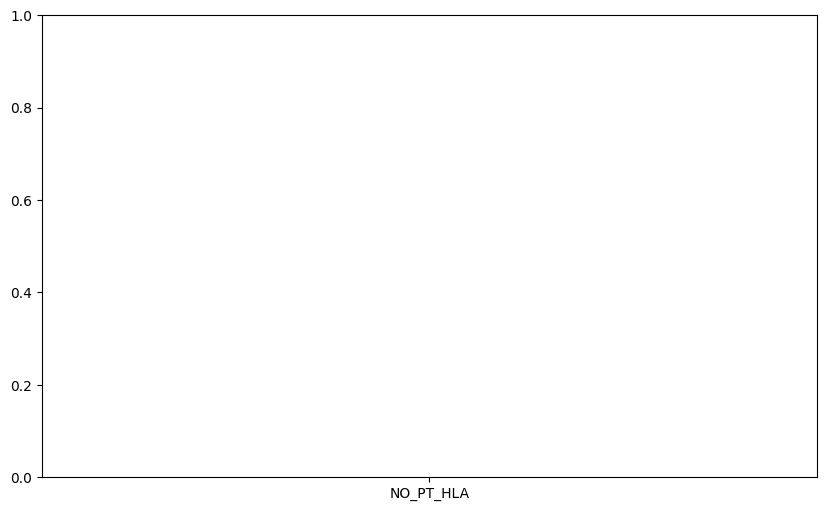

In [5]:
import itertools
from scipy.stats import f

# --------------------------
# Helper: Bonferroni Correction
# --------------------------
def bonferroni_correction(pvals):
    """
    Perform Bonferroni correction for multiple testing.
    pvals: list or np.array of raw p-values.
    Returns an array of adjusted p-values in the same order as input.
    """
    pvals = np.array(pvals)
    m = len(pvals)
    adjusted = np.minimum(pvals * m, 1.0)
    return adjusted

# --------------------------
# 1) Prepare Data & Plot Boxes
# --------------------------
# (Assumes 'evaluations_dt' is already defined.)
order = ['NO_PT_HLA', 'NO_PT_EPITOPE', 'PT_EPITOPE', 'PT_HLA']
custom_labels = [
    'No Pretraining \n HLA Encoding', 
    'No Pretraining \n Epitope Encoding', 
    'Pre-trained model \n Epitope Encoding', 
    'Pre-trained model \n HLA Encoding'
]
counts = evaluations_dt['encoding'].value_counts().reindex(order)
custom_labels_with_count = [
    f"{label}\nn = {counts[cat]}" 
    for cat, label in zip(order, custom_labels)
]

df_melt = evaluations_dt.melt(
    id_vars=['encoding'],
    value_vars=['spearman', 'pearsonr'],
    var_name='Metric',
    value_name='Value'
)

plt.figure(figsize=(10, 6))
ax = sns.boxplot(
    x='encoding', 
    y='Value', 
    hue='Metric', 
    data=df_melt, 
    order=order, 
    zorder=1
)

# --------------------------
# 2) Overlay Scatter Points
# --------------------------
metrics = ['spearman', 'pearsonr']
metric_colors = {'spearman': 'black', 'pearsonr': 'black'}

for metric in metrics:
    for i, cat in enumerate(order):
        y_vals = evaluations_dt.loc[evaluations_dt['encoding'] == cat, metric].dropna()
        x_center = i  
        jitter = np.random.uniform(-0.3, 0.3, size=len(y_vals))
        plt.scatter(
            np.full_like(y_vals, x_center) + jitter, 
            y_vals, 
            color=metric_colors[metric], 
            alpha=0.7, 
            s=5, 
            zorder=2
        )

# Remove duplicate legend entries
handles, labels_legend = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels_legend[:2])

plt.title('Distribution of Spearman and Pearsonr by Models Pre-training')
plt.ylabel('Correlation Value')
plt.xlabel('Encoding')
ax.set_xticklabels(custom_labels_with_count)

# --------------------------
# 3) Pairwise Statistical Tests with Bonferroni Correction using an F-test
# --------------------------
pairs = list(itertools.combinations(order, 2))  # all pairwise category combinations
offset_step = 0.03  # vertical offset increment for stacking brackets
bar_height = 0.01   # height of the bracket 'cap'
metric_vertical_shifts = {'spearman': 0.00, 'pearsonr': 0.15}

# Define an F-test function that returns the F-statistic and a two-tailed p-value.
def f_test(group1, group2):
    var1 = np.var(group1, ddof=1)
    var2 = np.var(group2, ddof=1)
    n1 = len(group1)
    n2 = len(group2)
    # Always compute F as the ratio of the larger variance to the smaller one.
    if var1 >= var2:
        F_stat = var1 / var2
        dfn = n1 - 1
        dfd = n2 - 1
    else:
        F_stat = var2 / var1
        dfn = n2 - 1
        dfd = n1 - 1
    # Two-tailed p-value
    p_value = 2 * f.sf(F_stat, dfn, dfd)
    return F_stat, min(p_value, 1.0)

# First, compute all raw p-values for each metric and each pair.
p_value_results = {metric: [] for metric in metrics}
for metric in metrics:
    for (cat1, cat2) in pairs:
        group1 = evaluations_dt.loc[evaluations_dt['encoding'] == cat1, metric].dropna()
        group2 = evaluations_dt.loc[evaluations_dt['encoding'] == cat2, metric].dropna()
        if len(group1) == 0 or len(group2) == 0:
            continue
        _, p_value = f_test(group1, group2)
        p_value_results[metric].append({ "pair": (cat1, cat2), "p_value": p_value })

# Apply Bonferroni correction for each metric.
for metric in metrics:
    if p_value_results[metric]:
        raw_pvals = [entry["p_value"] for entry in p_value_results[metric]]
        corrected_pvals = bonferroni_correction(raw_pvals)
        # Update each entry with its corrected p-value.
        for entry, p_corr in zip(p_value_results[metric], corrected_pvals):
            entry["p_corr"] = p_corr

# Now, draw significance brackets only for comparisons with corrected p < 0.05.
for metric in metrics:
    # Initialize a dictionary to track vertical offsets for each pair so brackets do not overlap.
    current_offsets = {pair: 0 for pair in pairs}
    for entry in p_value_results[metric]:
        cat1, cat2 = entry["pair"]
        if entry["p_corr"] < 0.0001:
            x1 = order.index(cat1)
            x2 = order.index(cat2)
            group1 = evaluations_dt.loc[evaluations_dt['encoding'] == cat1, metric].dropna()
            group2 = evaluations_dt.loc[evaluations_dt['encoding'] == cat2, metric].dropna()
            max_y_pair = max(group1.max(), group2.max())
            vertical_shift = metric_vertical_shifts[metric]
            bracket_y = max_y_pair + vertical_shift + current_offsets[(cat1, cat2)]
            # Draw the bracket.
            ax.plot([x1, x1, x2, x2],
                    [bracket_y, bracket_y + bar_height, 
                     bracket_y + bar_height, bracket_y],
                    c='k')
            # Place significance text in the middle.
            ax.text((x1 + x2) * 0.5, 
                    bracket_y + bar_height, 
                    "p < 0.05", 
                    ha='center', va='bottom')
            current_offsets[(cat1, cat2)] += offset_step

# --------------------------
# 4) Show Plot
# --------------------------
plt.show()


/tmp/ipykernel_710162/2770344291.py:69: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(custom_labels_with_count)


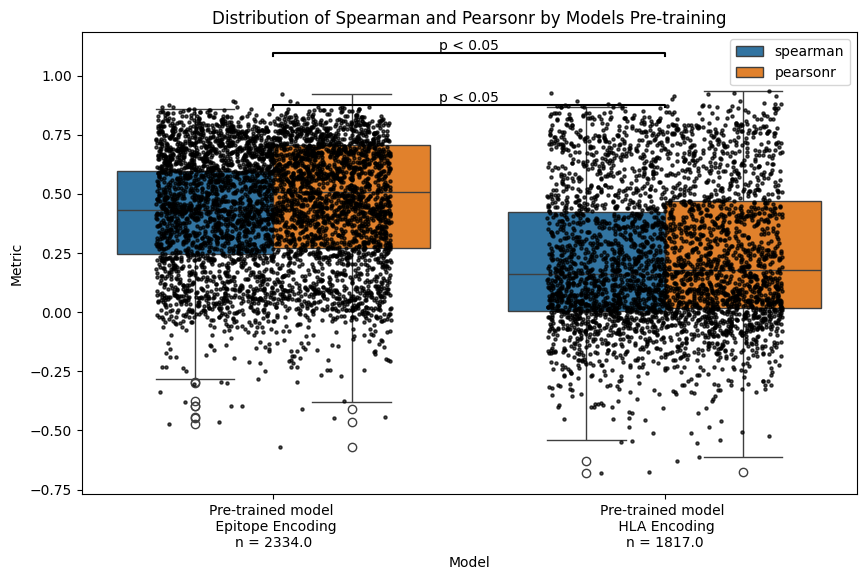

In [5]:
# evaluations_dt = evaluations_dt_subset

from scipy.stats import mannwhitneyu  # <-- Nonparametric test

# --------------------------
# 1) Prepare Data & Plot Boxes
# --------------------------
# We'll assume you already have 'evaluations_dt', 'order', and 'custom_labels_with_count' defined.

order = ['NO_PT_HLA', 'NO_PT_EPITOPE', 'PT_EPITOPE', 'PT_HLA']
custom_labels = [
    'No Pretraining \n HLA Encoding', 
    'No Pretraining \n Epitope Encoding', 
    'Pre-trained model \n Epitope Encoding', 
    'Pre-trained model \n HLA Encoding'
]
counts = evaluations_dt['Losses'].value_counts().reindex(order)
custom_labels_with_count = [
    f"{label}\nn = {counts[cat]}" 
    for cat, label in zip(order, custom_labels)
]

# Melt DataFrame for easier plotting with seaborn
df_melt = evaluations_dt.melt(
    id_vars=['Losses'],
    value_vars=['spearman', 'pearsonr'],
    var_name='Metric',
    value_name='Value'
)

plt.figure(figsize=(10, 6))

ax = sns.boxplot(
    x='Losses', 
    y='Value', 
    hue='Metric', 
    data=df_melt, 
    order=order, 
    zorder=1
)

# --------------------------
# 2) Overlay Scatter Points
# --------------------------
metrics = ['spearman', 'pearsonr']
metric_colors = {'spearman': 'black', 'pearsonr': 'black'}

for metric in metrics:
    for i, cat in enumerate(order):
        y_vals = evaluations_dt.loc[evaluations_dt['Losses'] == cat, metric].dropna()
        x_center = i  
        jitter = np.random.uniform(-0.3, 0.3, size=len(y_vals))
        plt.scatter(
            np.full_like(y_vals, x_center) + jitter, 
            y_vals, 
            color=metric_colors[metric], 
            alpha=0.7, 
            s=5, 
            zorder=2
        )

# Remove duplicate legend entries
handles, labels_legend = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels_legend[:2])

plt.title('Distribution of Spearman and Pearsonr by Models Pre-training')
plt.ylabel('Metric')
plt.xlabel('Model')
ax.set_xticklabels(custom_labels_with_count)

# --------------------------
# 3) Pairwise Mann–Whitney Tests + Significance Bars
# --------------------------
pairs = list(itertools.combinations(order, 2))  # all pairwise category combos
offset_step = 0.03  # how far above each box to start a bracket
bar_height = 0.01   # bracket 'cap' height

# We'll do separate significance lines for each Metric,
# shifting them upward to avoid collisions.
metric_vertical_shifts = {'spearman': 0.00, 'pearsonr': 0.15}

p_values = []

for metric in metrics:
    current_offsets = {}
    for p in pairs:
        current_offsets[p] = 0  # track how high we've drawn each bracket

    for (cat1, cat2) in pairs:
        # Extract the two samples
        group1 = evaluations_dt.loc[evaluations_dt['Losses'] == cat1, metric].dropna()
        group2 = evaluations_dt.loc[evaluations_dt['Losses'] == cat2, metric].dropna()

        if len(group1) == 0 or len(group2) == 0:
            continue  # skip if empty

        # Mann–Whitney U test (two-sided)
        stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')
        
        p_values.append([metric, cat1,cat2, p_value])
        # Check significance at p < 0.05
        if p_value < 0.05:
            x1 = order.index(cat1)
            x2 = order.index(cat2)
    
            # Get max y to place bracket above the data
            max_y_pair = max(group1.max(), group2.max())
            # Add metric-specific vertical shift so lines for spearman & pearsonr don't collide
            vertical_shift = metric_vertical_shifts[metric]
            bracket_y = max_y_pair + vertical_shift + current_offsets[(cat1, cat2)]

            # Draw bracket
            ax.plot([x1, x1, x2, x2],
                    [bracket_y, bracket_y + bar_height, 
                     bracket_y + bar_height, bracket_y],
                    c='k')
            # Place text in the middle
            ax.text((x1 + x2)*0.5, 
                    bracket_y + bar_height, 
                    "p < 0.05", 
                    ha='center', va='bottom')

            # Bump offset for subsequent brackets on the same pair
            current_offsets[(cat1, cat2)] += offset_step

# --------------------------
# 4) Show Plot
# --------------------------
plt.show()


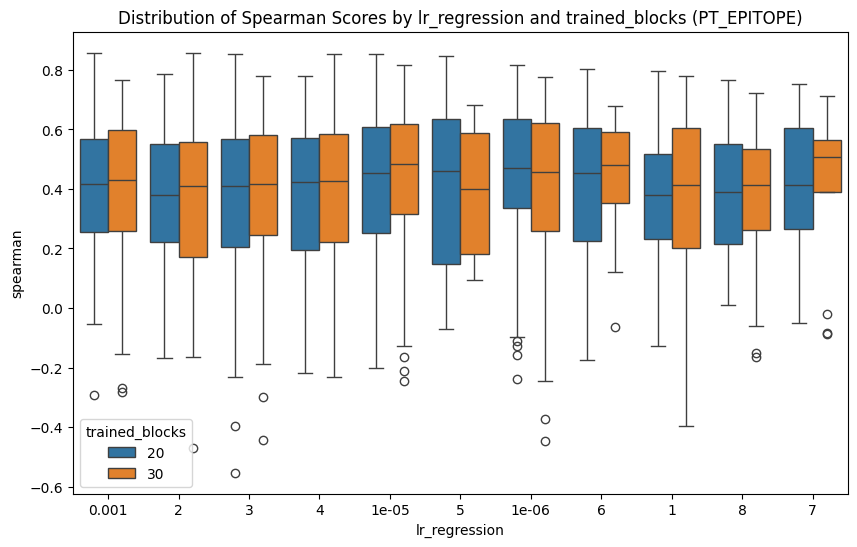

In [6]:

data_pt_epitope = evaluations_dt[evaluations_dt['Losses'] == 'PT_EPITOPE']

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=data_pt_epitope,
    x='lr_regression',
    y='spearman',
    hue='trained_blocks',   # separates each lr_regression by trained_blocks
    palette='tab10',
    dodge=True              # separate violins side-by-side
)

plt.title("Distribution of Spearman Scores by lr_regression and trained_blocks (PT_EPITOPE)")
plt.show()


In [23]:
evaluations_dt['AUG6'] = evaluations_dt['path'].str.contains('_AUG_6_')

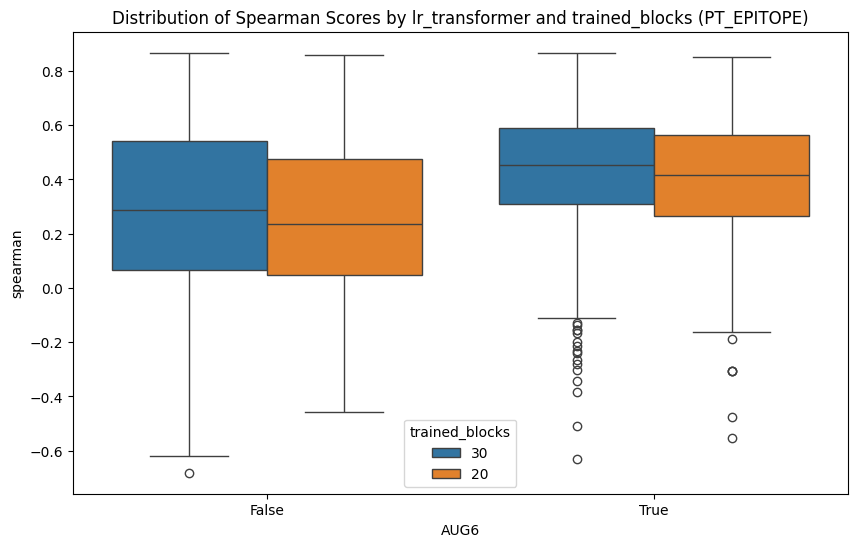

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data for PT_EPITOPE losses
# data_pt_epitope = evaluations_dt[evaluations_dt['Losses'] == 'PT_EPITOPE']

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=evaluations_dt,
    x='AUG6',
    y='spearman',
    hue='trained_blocks',   # separates each lr_regression by trained_blocks
    palette='tab10',
    dodge=True              # separate violins side-by-side
)

plt.title("Distribution of Spearman Scores by lr_transformer and trained_blocks (PT_EPITOPE)")
plt.show()


/tmp/ipykernel_710162/403532378.py:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(custom_labels_with_count)


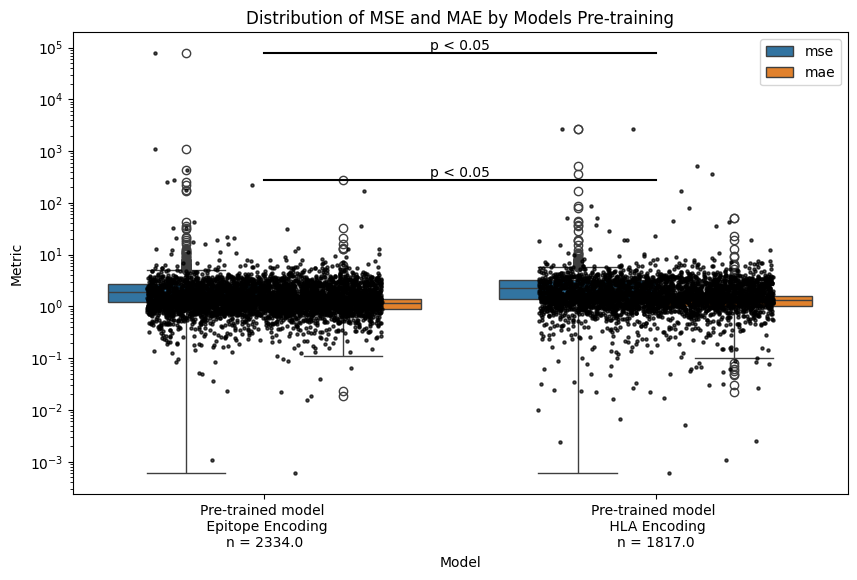

In [8]:
from scipy.stats import mannwhitneyu  # <-- Nonparametric test

# --------------------------
# 1) Prepare Data & Plot Boxes
# --------------------------
# We'll assume you already have 'evaluations_dt', 'order', and 'custom_labels_with_count' defined.

order = ['NO_PT_HLA', 'NO_PT_EPITOPE', 'PT_EPITOPE', 'PT_HLA']
custom_labels = [
    'No Pretraining \n HLA Encoding', 
    'No Pretraining \n Epitope Encoding', 
    'Pre-trained model \n Epitope Encoding', 
    'Pre-trained model \n HLA Encoding'
]
counts = evaluations_dt['Losses'].value_counts().reindex(order)
custom_labels_with_count = [
    f"{label}\nn = {counts[cat]}" 
    for cat, label in zip(order, custom_labels)
]

# Melt DataFrame for easier plotting with seaborn
df_melt = evaluations_dt.melt(
    id_vars=['Losses'],
    value_vars=['mse', 'mae'],
    var_name='Metric',
    value_name='Value'
)

plt.figure(figsize=(10, 6))

ax = sns.boxplot(
    x='Losses', 
    y='Value', 
    hue='Metric', 
    data=df_melt, 
    order=order, 
    zorder=1
)

# --------------------------
# 2) Overlay Scatter Points
# --------------------------
metrics = ['mse', 'mae']
metric_colors = {'mse': 'black', 'mae': 'black'}

for metric in metrics:
    for i, cat in enumerate(order):
        y_vals = evaluations_dt.loc[evaluations_dt['Losses'] == cat, metric].dropna()
        x_center = i  
        jitter = np.random.uniform(-0.3, 0.3, size=len(y_vals))
        plt.scatter(
            np.full_like(y_vals, x_center) + jitter, 
            y_vals, 
            color=metric_colors[metric], 
            alpha=0.7, 
            s=5, 
            zorder=2
        )

# Remove duplicate legend entries
handles, labels_legend = ax.get_legend_handles_labels()
ax.legend(handles[:2], labels_legend[:2])

plt.title('Distribution of MSE and MAE by Models Pre-training')
plt.ylabel('Metric')
plt.xlabel('Model')
ax.set_xticklabels(custom_labels_with_count)

# --------------------------
# 3) Pairwise Mann–Whitney Tests + Significance Bars
# --------------------------
pairs = list(itertools.combinations(order, 2))  # all pairwise category combos
offset_step = 0.03  # how far above each box to start a bracket
bar_height = 0.01   # bracket 'cap' height

# We'll do separate significance lines for each Metric,
# shifting them upward to avoid collisions.
metric_vertical_shifts = {'mse': 0.00, 'mae': 0.15}

p_values = []

for metric in metrics:
    current_offsets = {}
    for p in pairs:
        current_offsets[p] = 0  # track how high we've drawn each bracket

    for (cat1, cat2) in pairs:
        # Extract the two samples
        group1 = evaluations_dt.loc[evaluations_dt['Losses'] == cat1, metric].dropna()
        group2 = evaluations_dt.loc[evaluations_dt['Losses'] == cat2, metric].dropna()

        if len(group1) == 0 or len(group2) == 0:
            continue  # skip if empty

        # Mann–Whitney U test (two-sided)
        stat, p_value = mannwhitneyu(group1, group2, alternative='two-sided')

        p_values.append([metric, cat1,cat2, p_value])
        # Check significance at p < 0.05
        if p_value < 0.05:
            x1 = order.index(cat1)
            x2 = order.index(cat2)

            # Get max y to place bracket above the data
            max_y_pair = max(group1.max(), group2.max())
            # Add metric-specific vertical shift so lines for spearman & pearsonr don't collide
            vertical_shift = metric_vertical_shifts[metric]
            bracket_y = max_y_pair + vertical_shift + current_offsets[(cat1, cat2)]

            # Draw bracket
            ax.plot([x1, x1, x2, x2],
                    [bracket_y, bracket_y + bar_height, 
                     bracket_y + bar_height, bracket_y],
                    c='k')
            # Place text in the middle
            ax.text((x1 + x2)*0.5, 
                    bracket_y + bar_height, 
                    "p < 0.05", 
                    ha='center', va='bottom')

            # Bump offset for subsequent brackets on the same pair
            current_offsets[(cat1, cat2)] += offset_step
plt.yscale('log')
# --------------------------
# 4) Show Plot
# --------------------------
plt.show()


In [10]:
# percentile_95_mse = evaluations_dt.groupby('Losses')['spearman'].quantile(0.98)
# print(percentile_95_mse)

# Losses
# NO_PT_EPITOPE    0.399133
# NO_PT_HLA        0.412350
# PT_EPITOPE       0.417899
# PT_HLA           0.377525

# Name: spearman, dtype: float64

# Counter(evaluations_dt[evaluations_dt['spearman'] > 0.377]['Losses'])

# Counter({'PT_EPITOPE': 24, 'NO_PT_HLA': 15, 'NO_PT_EPITOPE': 13, 'PT_HLA': 12})

In [90]:
Counter(evaluations_dt[evaluations_dt['spearman'] > 0.377]['Losses'])

Counter({'PT_EPITOPE': 588, 'PT_HLA': 180})

In [11]:
# file_path = evaluations_dt.loc[0, 'path']
# data = pd.read_csv(file_path)

# plot_predictions(data['measured'], data['prediction'], title_prefix=file_path)

# file_path = evaluations_dt.iloc[2, -1]
# data = pd.read_csv(file_path)

# plot_predictions(data['measured'], data['prediction'], title_prefix=file_path)

In [51]:
pre_trained_val = evaluations_dt[evaluations_dt['path'].str.contains('_pretrained_')].sort_values(by='spearman', ascending = False).head(5)['spearman'].values

In [8]:
# evaluations_dt.to_csv('/global/scratch/users/sergiomar10/losses/ESMCBA/evaluations.csv', index=False)
evaluations_dt_saved = pd.read_csv('/global/scratch/users/sergiomar10/losses/ESMCBA/evaluations.csv')

In [28]:
no_pre_trained_val = evaluations_dt[evaluations_dt['path'].str.contains('_NO_pretrained_')].sort_values(by='spearman', ascending = False).head(5)['spearman'].values

In [35]:
HE_pretrain = evaluations_dt_saved[(evaluations_dt_saved['HLA'] == 'HLA-A0201') & (evaluations_dt_saved['Losses'] == 'Hubber') & (evaluations_dt_saved['data_prop'] > 0.7)]['spearman'].values
evaluations_dt_saved[(evaluations_dt_saved['HLA'] == 'HLA-A0201') & (evaluations_dt_saved['Losses'] == 'Hubber') & (evaluations_dt_saved['data_prop'] > 0.7)].head(5)

,HLA,Losses,encoding,data_prop,trained_blocks,lr_transformer,lr_regression,n_evaluations,spearman,pearsonr,mse,mae,r2,rmse,time,path
11210,HLA-A0201,Hubber,epitope,0.95,30.0,0.0010,0.000100,282,0.423736,0.369528,2.836943,1.409148,-0.968998,1.684323,2025-02-22 10:51:27,/global/scratch/users/sergiomar10/losses/ESMCB...
12443,HLA-A0201,Hubber,epitope,0.80,5.0,0.0001,0.000010,282,0.386880,0.329674,2.633981,1.376359,-0.828131,1.622954,2025-02-22 06:30:31,/global/scratch/users/sergiomar10/losses/ESMCB...
12920,HLA-A0201,Hubber,epitope,0.80,20.0,0.0010,0.000001,282,0.372590,0.358274,2.458097,1.276966,-0.706058,1.567832,2025-02-22 04:33:14,/global/scratch/users/sergiomar10/losses/ESMCB...
13095,HLA-A0201,Hubber,epitope,0.80,20.0,0.0010,0.000100,282,0.367879,0.349267,2.402729,1.265794,-0.667629,1.550074,2025-02-22 03:56:21,/global/scratch/users/sergiomar10/losses/ESMCB...
13170,HLA-A0201,Hubber,epitope,0.95,20.0,0.0010,0.000010,282,0.365324,0.335639,2.553620,1.289224,-0.772356,1.598005,2025-02-22 09:51:37,/global/scratch/users/sergiomar10/losses/ESMCB...


In [49]:
no_pretrain_HLA = evaluations_dt_complete_HLA['spearman'].values

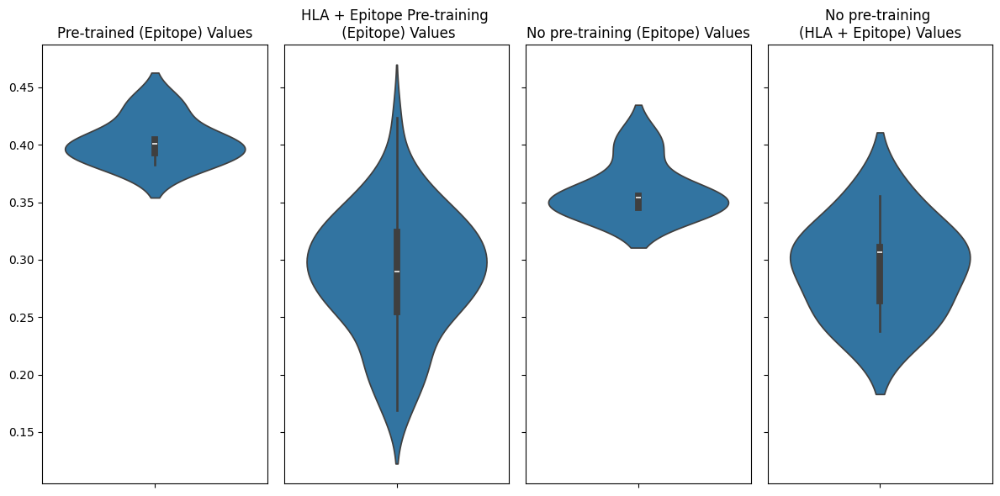

In [54]:
# Create a figure with 1 row and 2 columns of subplots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 6), sharey =True)

# Plot the first violin plot on the left subplot
sns.violinplot(data=pre_trained_val, ax=ax1)
ax1.set_title("Pre-trained (Epitope) Values")

# Plot the second violin plot on the right subplot
sns.violinplot(data=HE_pretrain, ax=ax2)
ax2.set_title("HLA + Epitope Pre-training \n (Epitope) Values")

# Plot the second violin plot on the right subplot
sns.violinplot(data=no_pre_trained_val, ax=ax3)
ax3.set_title("No pre-training (Epitope) Values")

# Plot the second violin plot on the right subplot
sns.violinplot(data=no_pretrain_HLA, ax=ax4)
ax4.set_title("No pre-training \n(HLA + Epitope) Values")


# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [7]:
evaluations_dt_sorted = evaluations_dt.drop_duplicates('HLA')
evaluations_dt_sorted

,HLA,Losses,encoding,data_prop,trained_blocks,lr_transformer,lr_regression,n_evaluations,spearman,pearsonr,mse,mae,r2,rmse,time,path
0,HLAB1801,Hubber,HLA,0.80,30,0.0001,0.000010,12,0.867133,0.914945,1.108200,0.848268,0.609242,1.052711,2025-03-04 04:38:55,/global/scratch/users/sergiomar10/losses/ESMCB...
1,HLAA2601,MSE,HLA,0.50,30,0.0001,0.000010,15,0.864286,0.862720,0.732143,0.595892,0.607185,0.855653,2025-03-04 13:10:46,/global/scratch/users/sergiomar10/losses/ESMCB...
3,HLAB0801,Hubber,epitope,0.95,20,0.0001,0.001000,16,0.857361,0.851606,1.805032,1.229421,0.095840,1.343515,2025-03-04 04:15:00,/global/scratch/users/sergiomar10/losses/ESMCB...
7,HLAA3001,Hubber,HLA,0.50,20,0.0001,0.000001,10,0.852825,0.927846,0.959784,0.909949,-0.346257,0.979686,2025-03-03 19:40:59,/global/scratch/users/sergiomar10/losses/ESMCB...
13,HLAA0203,Hubber,HLA,0.50,30,0.0001,0.001000,2606,0.809624,0.867849,1.336808,0.927313,0.559841,1.156204,2025-03-03 23:53:01,/global/scratch/users/sergiomar10/losses/ESMCB...
15,HLAB1501,MSE,epitope,0.50,30,0.0010,0.000010,22,0.797854,0.759883,0.798232,0.752500,0.480639,0.893438,2025-03-04 10:30:50,/global/scratch/users/sergiomar10/losses/ESMCB...
48,HLAA0206,MSE,epitope,0.50,20,0.0001,0.000010,2146,0.773468,0.792568,1.385026,0.998166,0.539201,1.176871,2025-03-04 14:34:00,/global/scratch/users/sergiomar10/losses/ESMCB...
61,HLAA6801,MSE,epitope,0.50,30,0.0010,0.000001,1533,0.766946,0.786442,0.983738,0.817501,0.582990,0.991836,2025-03-04 12:15:13,/global/scratch/users/sergiomar10/losses/ESMCB...
109,HLAB3501,MSE,epitope,0.95,20,0.0001,0.000001,487,0.751608,0.799229,2.622716,1.475266,0.309070,1.619480,2025-03-04 17:45:19,/global/scratch/users/sergiomar10/losses/ESMCB...
115,HLAA2301,Hubber,HLA,0.20,20,0.0001,0.000010,1409,0.749384,0.759261,0.966984,0.754118,0.539339,0.983354,2025-03-03 00:42:55,/global/scratch/users/sergiomar10/losses/ESMCB...


<Axes: >

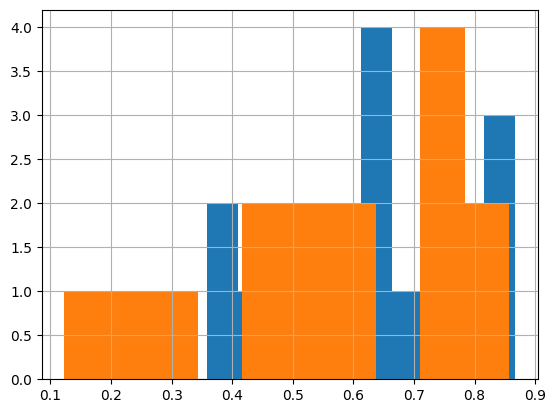

In [18]:
evaluations_dt_sorted[evaluations_dt_sorted['encoding'] == 'HLA']['spearman'].hist()
evaluations_dt_sorted[evaluations_dt_sorted['encoding'] == 'epitope']['spearman'].hist()

In [11]:
combined_metrics = []

for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    # for i in range(10):
    try:
        HLA = HLA.replace('HLA', 'HLA-')
        if len(glob.glob(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/*{HLA}_mhc_flurry.csv')) < 1:
            continue
            
        replicate_spearman = []
        replicate_pearson = []
        
        # Get all replicate CSV files using a glob pattern derived from 'path'
        file_paths = glob.glob(f'{path[:155]}*')
        print(f"{len(file_paths)} replicates for {HLA}")
        
        # Load the MHC Flurry predictions (assumed constant for each HLA)
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        label = HLA
        # Loop over each replicate CSV file for the fine-tuned ESMC predictions
        for rep_path in file_paths:
            last_csv = pd.read_csv(rep_path)
            
            # Adjust the sequence if needed
            if len(last_csv['sequence'].iloc[0]) > 300:
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
                predictions_rep = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
                # Fallback if the slicing didn't match any peptides.
                if predictions_rep['peptide'].notna().sum() == 0:
                    last_csv = pd.read_csv(rep_path)
                    last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                    predictions_rep = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            else:
                predictions_rep = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            
            # Compute log-transformed MHC affinity and filter out rows with missing values
            predictions_rep['mhc_log'] = predictions_rep['mhcflurry_affinity'].apply(np.log10)
            predictions_rep = predictions_rep[predictions_rep['mhc_log'].notna()]
    
            
            # Compute correlation metrics for this replicate
            sp, _ = spearmanr(predictions_rep['measured'], predictions_rep['prediction'])
            pr, _ = pearsonr(predictions_rep['measured'], predictions_rep['prediction'])
            replicate_spearman.append(sp)
            replicate_pearson.append(pr)
        
        # Compute mean and standard deviation across replicates for fine-tuned ESMC
        # If there are no replicates, default to NaN
        esmc_sp_mean = np.mean(replicate_spearman) if replicate_spearman else np.nan
        esmc_sp_std = np.std(replicate_spearman) if replicate_spearman else np.nan
        esmc_pr_mean = np.mean(replicate_pearson) if replicate_pearson else np.nan
        esmc_pr_std = np.std(replicate_pearson) if replicate_pearson else np.nan
    
        # print(HLA, label, esmc_sp_mean, esmc_sp_std)
        
        # Append the fine-tuned ESMC metrics with error bars
        combined_metrics.append({
            'HLA': HLA,
            'model': 'Fine-tuned ESMC',
            'label': label,
            'spearman': esmc_sp_mean,
            'spearman_std': esmc_sp_std,
            'pearson': esmc_pr_mean,
            'pearson_std': esmc_pr_std
        })
          
        sp_mhc, _ = spearmanr(predictions_rep['measured'], predictions_rep['mhc_log'])
        pr_mhc, _ = pearsonr(predictions_rep['measured'], predictions_rep['mhc_log'])
        
        combined_metrics.append({
            'HLA': HLA,
            'model': 'MHC Flurry',
            'label': label,
            'spearman': sp_mhc,
            'spearman_std': 0,  # Single CSV file: no replicate standard deviation.
            'pearson': pr_mhc,
            'pearson_std': 0
        })
    except:
        print(HLA)

combined_df = pd.DataFrame(combined_metrics)

1 replicates for HLA-B1801
HLA-B1801
1 replicates for HLA-A2601
3 replicates for HLA-B0801
1 replicates for HLA-A3001
1 replicates for HLA-A0203
3 replicates for HLA-B1501
4 replicates for HLA-A0206
2 replicates for HLA-A6801
2 replicates for HLA-B3501
1 replicates for HLA-A2301
1 replicates for HLA-A0202
2 replicates for HLA-A1101
1 replicates for HLA-B3901
1 replicates for HLA-A2403
1 replicates for HLA-B5801
1 replicates for HLA-B1517
1 replicates for HLA-A6802
1 replicates for HLA-A3002
1 replicates for HLA-A2902
4 replicates for HLA-B0702
4 replicates for HLA-A3301
1 replicates for HLA-A0301
2 replicates for HLA-A0101
1 replicates for HLA-A0201
1 replicates for HLA-A2402
1 replicates for HLA-B5101
1 replicates for HLA-B4402
3 replicates for HLA-A6901
2 replicates for HLA-B5701
2 replicates for HLA-B4601


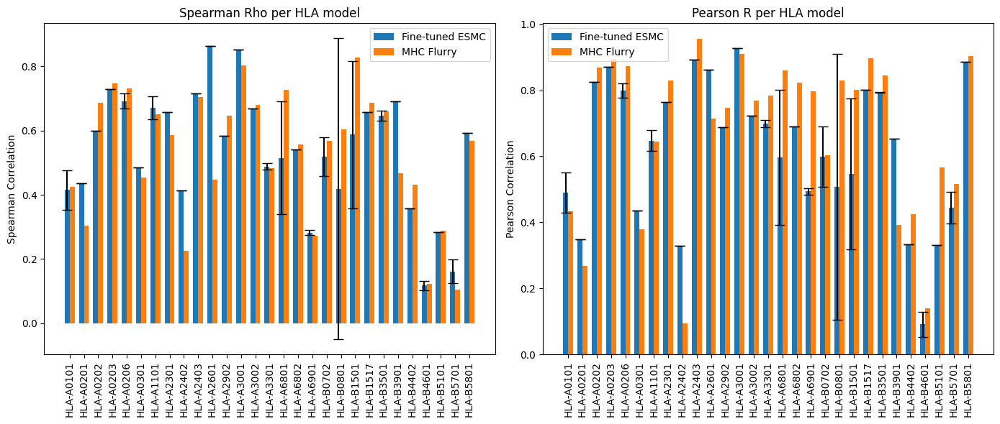

In [126]:
# Pivot the combined DataFrame to get values (and error bars) per HLA and model.
pivot_spearman     = combined_df.pivot(index='HLA', columns='model', values='spearman')
pivot_spearman_std = combined_df.pivot(index='HLA', columns='model', values='spearman_std')
pivot_pearson      = combined_df.pivot(index='HLA', columns='model', values='pearson')
pivot_pearson_std  = combined_df.pivot(index='HLA', columns='model', values='pearson_std')

# X-axis positions for each HLA.
x = np.arange(len(pivot_spearman.index))
width = 0.35  # width for each bar

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot Spearman correlations:
# - Fine-tuned ESMC: with error bars from the aggregated data.
# - MHC Flurry: without error bars.
axes[0].bar(x - width/2, pivot_spearman['Fine-tuned ESMC'], width, 
            yerr=pivot_spearman_std['Fine-tuned ESMC'], capsize=5, label='Fine-tuned ESMC')
axes[0].bar(x + width/2, pivot_spearman['MHC Flurry'], width, label='MHC Flurry')
axes[0].set_xticks(x)
axes[0].set_xticklabels(pivot_spearman.index, rotation=90)
axes[0].set_ylabel('Spearman Correlation')
axes[0].set_title('Spearman Rho per HLA model')
axes[0].legend()

# Plot Pearson correlations:
# - Fine-tuned ESMC: with error bars from the aggregated data.
# - MHC Flurry: without error bars.
axes[1].bar(x - width/2, pivot_pearson['Fine-tuned ESMC'], width,
            yerr=pivot_pearson_std['Fine-tuned ESMC'], capsize=5, label='Fine-tuned ESMC')
axes[1].bar(x + width/2, pivot_pearson['MHC Flurry'], width, label='MHC Flurry')
axes[1].set_xticks(x)
axes[1].set_xticklabels(pivot_pearson.index, rotation=90)
axes[1].set_ylabel('Pearson Correlation')
axes[1].set_title('Pearson R per HLA model')
axes[1].legend()

plt.tight_layout()
plt.show()


Error processing HLA-: [Errno 2] No such file or directory: '/global/scratch/users/sergiomar10/data/MHCFlurry_evals/HLA-_mhc_flurry.csv'


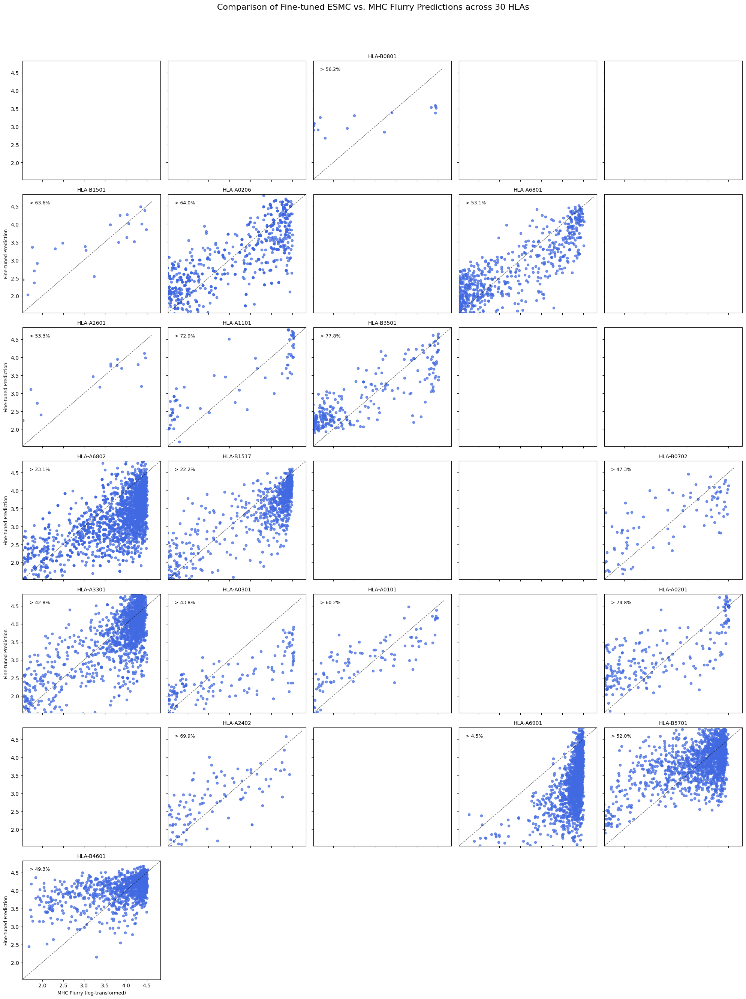

In [11]:
import math 
hlas = evaluations_dt_sorted['HLA'].unique()
n_hlas = len(hlas)
cols = 5  # adjust as needed for layout
rows = math.ceil(n_hlas / cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows), sharex=True, sharey=True)
axes = axes.flatten()

for i, (HLA, path) in enumerate(evaluations_dt_sorted[['HLA', 'path']].values):
    ax = axes[i]
    try:
        # Load the fine-tuned model predictions.
        last_csv = pd.read_csv(path)
        # Load the MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Here, we use HLA as a simple label; adjust if you want to extract a more detailed label.
        label = HLA
        
        # Merge predictions on sequence/peptide.
        predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        
        # Compute the log-transformed MHC Flurry affinity.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # If no predictions remain, skip this HLA.
        if predictions.empty:
            continue
        
        # X: MHC Flurry log predictions; Y: fine-tuned predictions (assumed to be in the 'prediction' column)
        x_vals = predictions['mhc_log']
        y_vals = predictions['prediction']
        
        # Create the scatter plot.
        ax.scatter(x_vals, y_vals, alpha=0.7, s=20, color='royalblue')
        
        # Determine limits for a balanced plot.
        all_vals = np.concatenate([x_vals.values, y_vals.values])
        min_val, max_val = np.min(all_vals), np.max(all_vals)
        pad = (max_val - min_val) * 0.05
        lims = [min_val - pad, max_val + pad]
        
        # Plot the x=y reference line.
        ax.plot(lims, lims, 'k--', alpha=0.6, lw=1)
        ax.set_xlim(lims)
        ax.set_ylim(lims)
        
        # Compute and annotate the percentage of points where fine-tuned prediction > MHC Flurry.
        n_points = len(predictions)
        if n_points > 0:
            pct_above = np.sum(y_vals > x_vals) / n_points * 100
            # The annotation is placed in the top left corner of the subplot.
            ax.text(0.05, 0.95, f'> {pct_above:.1f}%', transform=ax.transAxes,
                    verticalalignment='top', fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        ax.set_title(f'{HLA}', fontsize=10)
        
        # Optionally, label the leftmost subplots with Y label and bottom subplots with X label.
        if i % cols == 0:
            ax.set_ylabel('Fine-tuned Prediction', fontsize=9)
        if i // cols == rows - 1:
            ax.set_xlabel('MHC Flurry (log-transformed)', fontsize=9)
        
    except Exception as e:
        print(f"Error processing {HLA}: {e}")
        continue

# Remove any unused subplots.
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Comparison of Fine-tuned ESMC vs. MHC Flurry Predictions across 30 HLAs', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

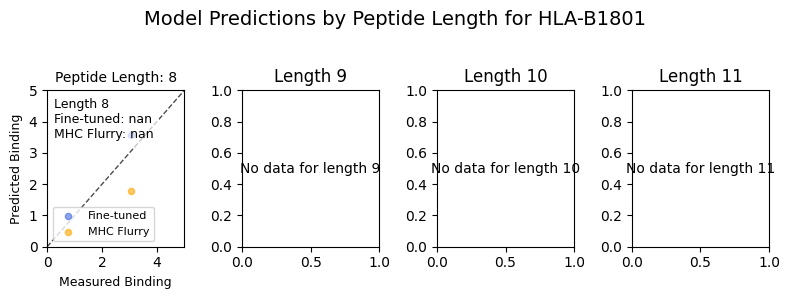

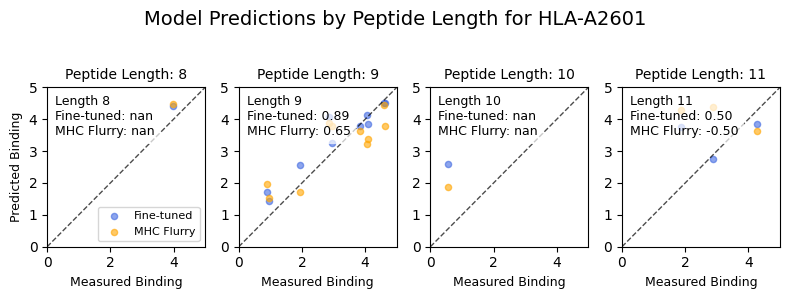

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


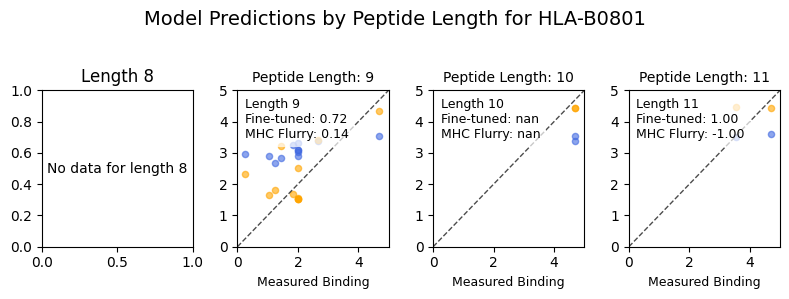

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


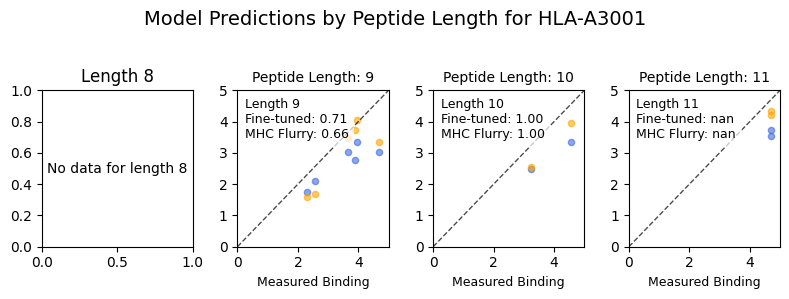

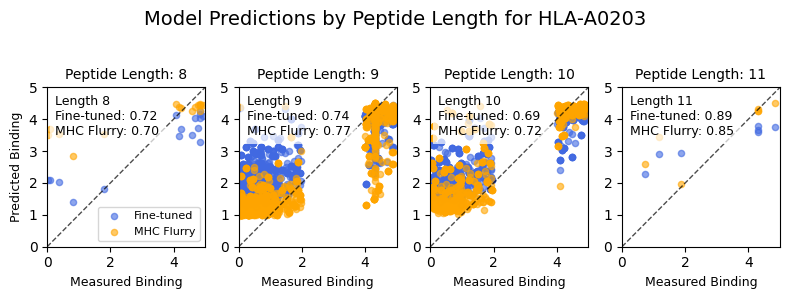

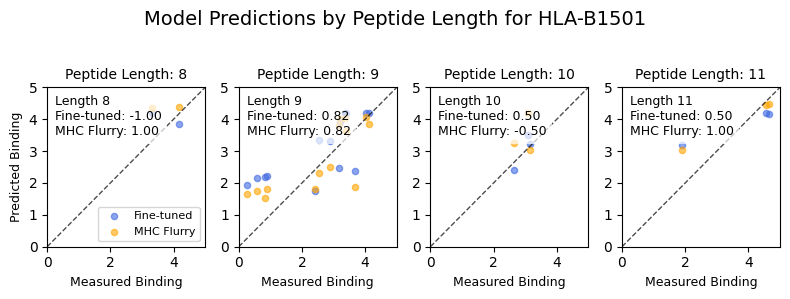

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


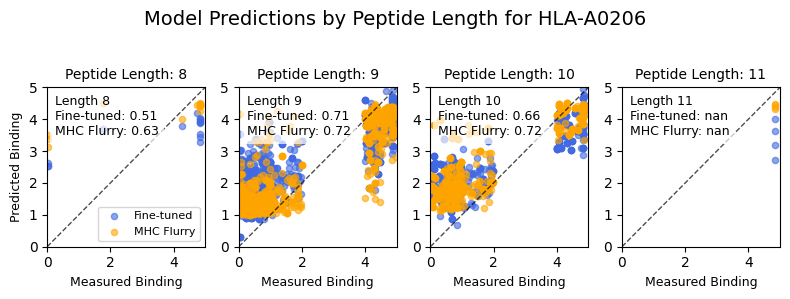

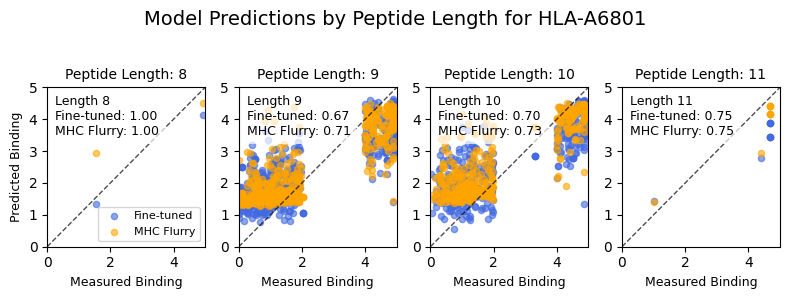

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


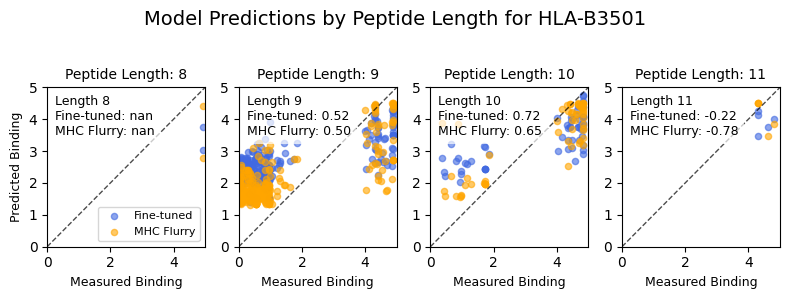

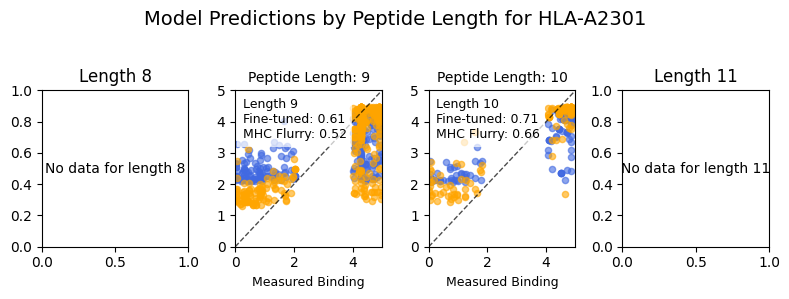

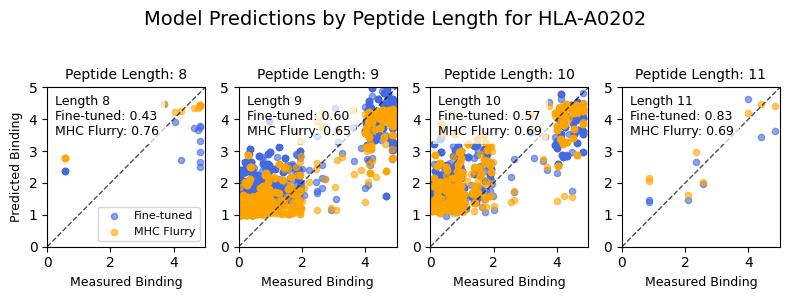

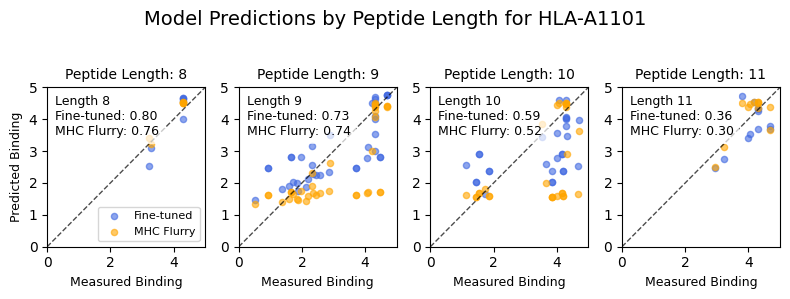

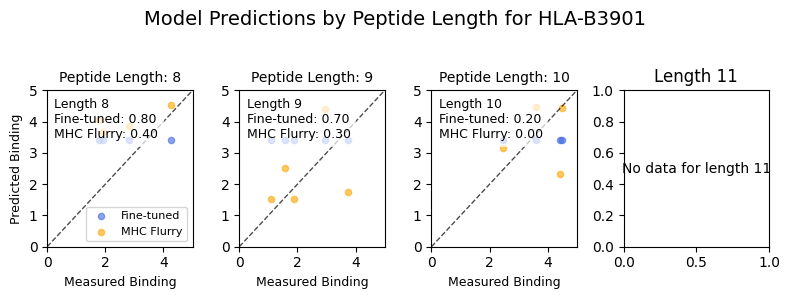

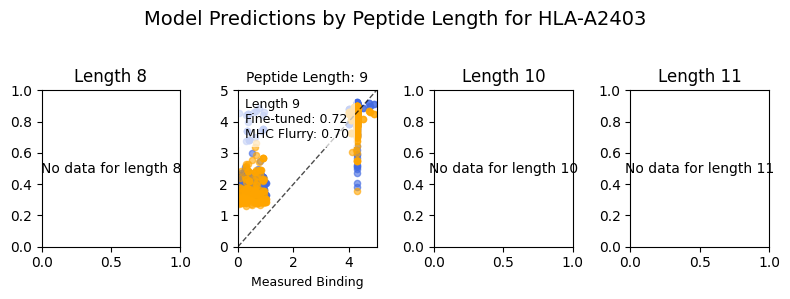

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


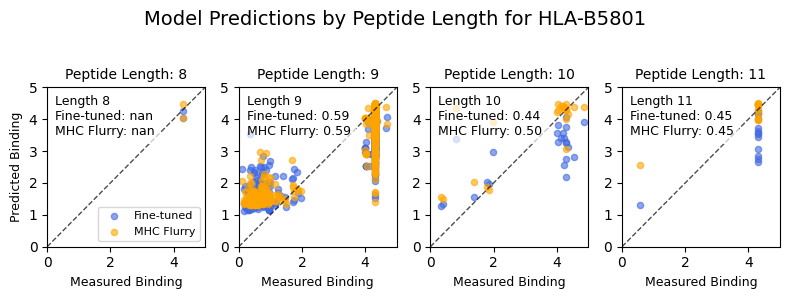

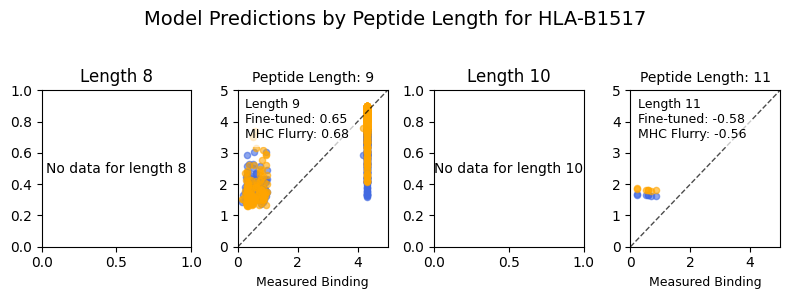

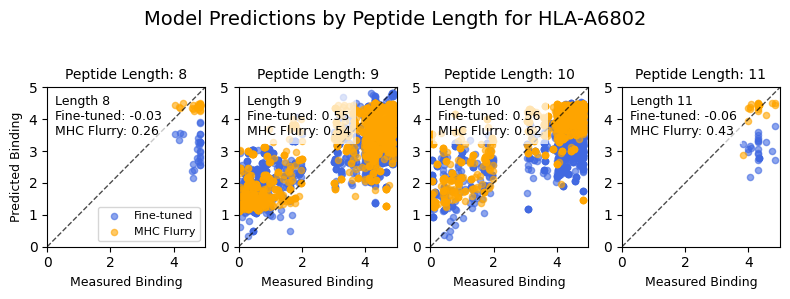

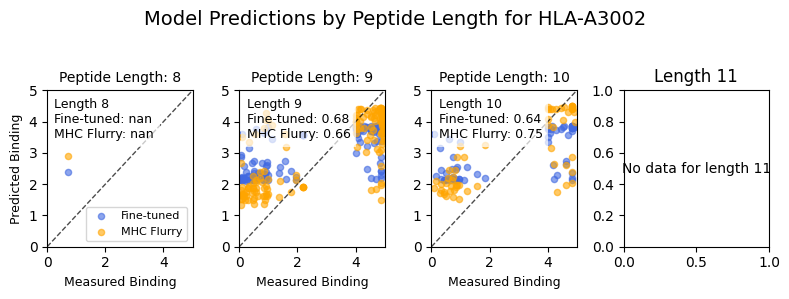

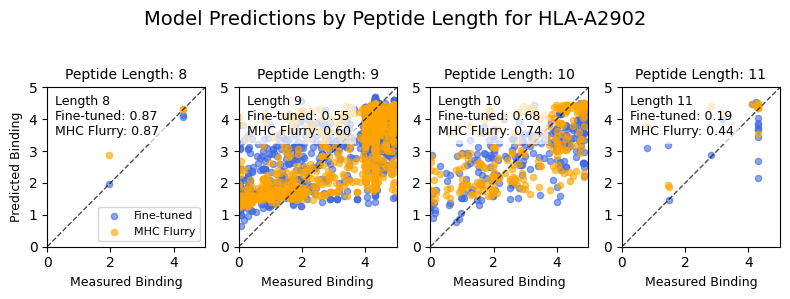

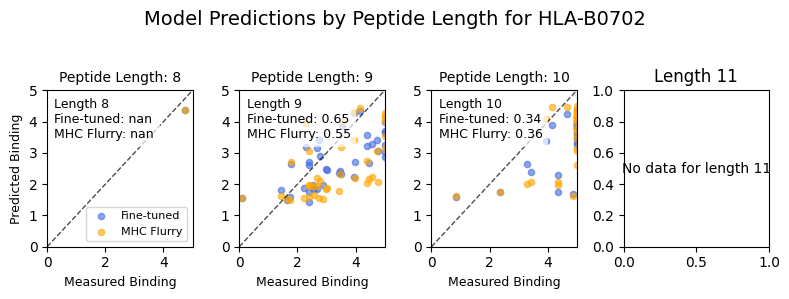

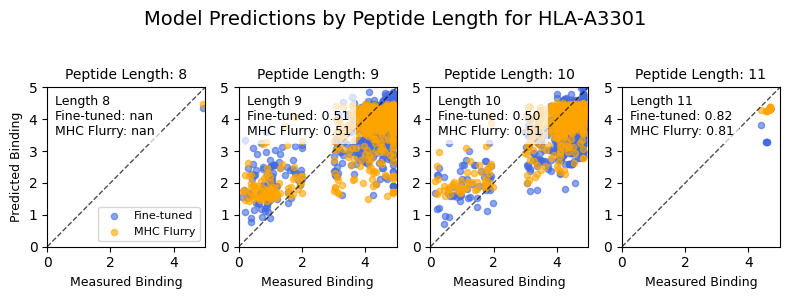

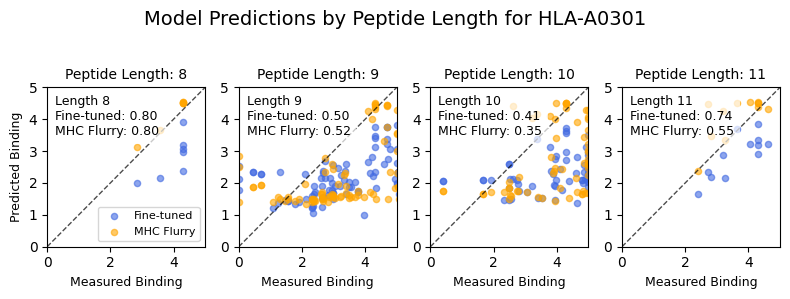

/tmp/ipykernel_204821/3831749529.py:61: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_204821/3831749529.py:62: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])


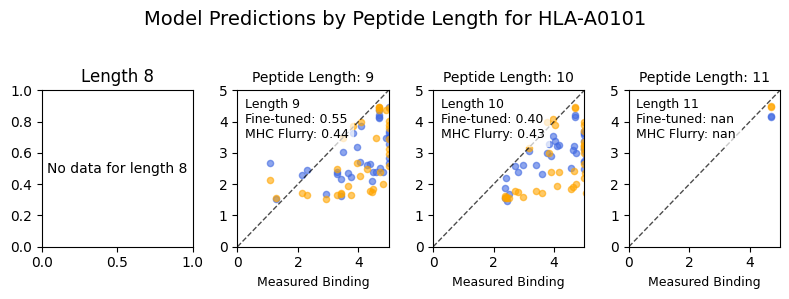

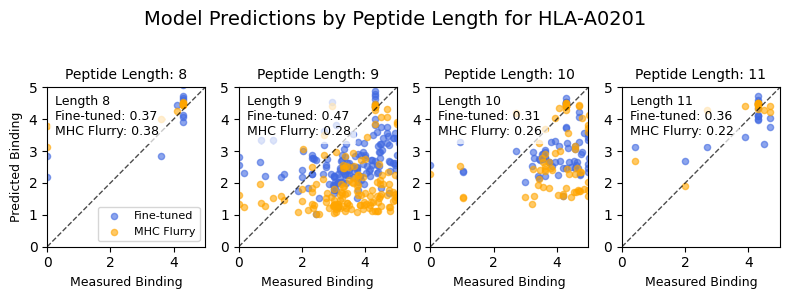

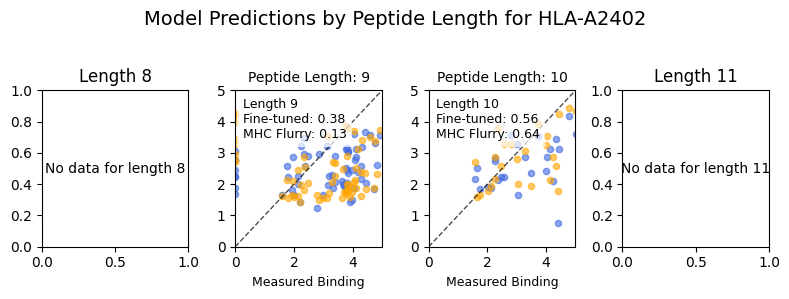

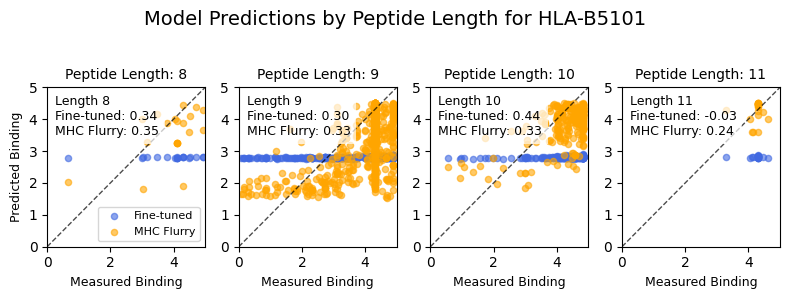

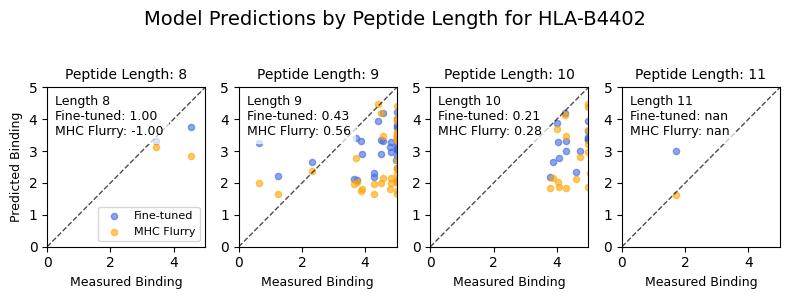

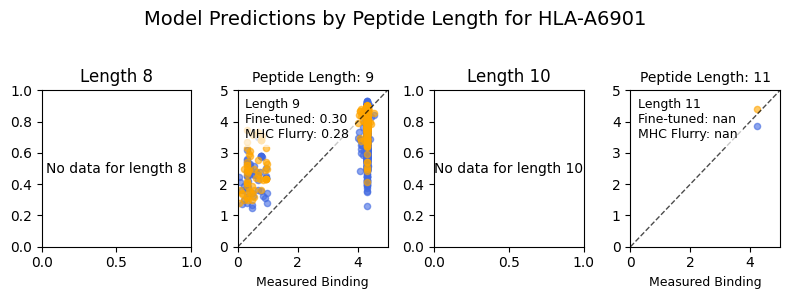

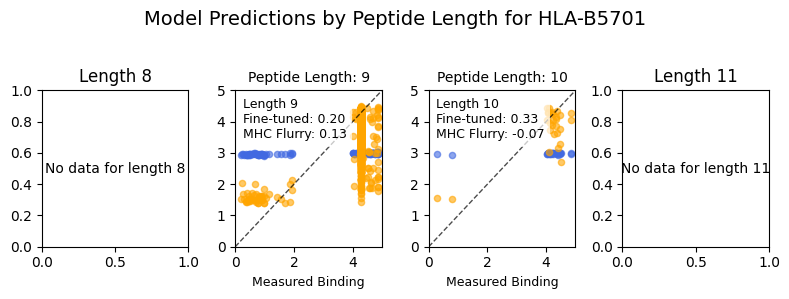

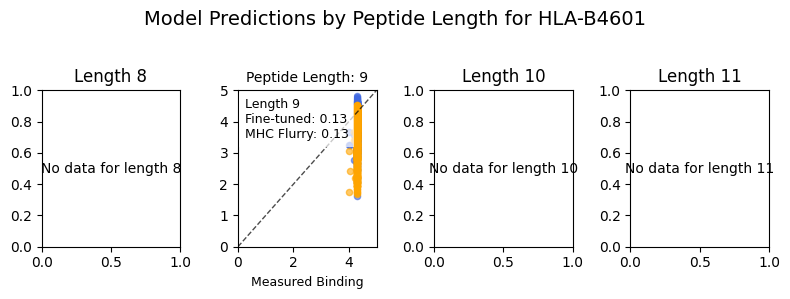

In [133]:
for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        HLA = HLA.replace('HLA', 'HLA-')
        last_csv = pd.read_csv(path)
        # Load MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Check and trim sequences if they are longer than 300 characters.
        if len(last_csv['sequence'].iloc[0]) > 300:
            last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            # Fallback: if no peptides matched, try a slightly different trimming.
            if predictions['peptide'].notna().sum() == 0:
                last_csv = pd.read_csv(path)
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        else:
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        
        # Compute the log-transformed affinity for MHC Flurry.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # Create a new column for peptide length.
        predictions['length'] = predictions['sequence'].str.len()
        
        # Prepare a figure with 1 row and 4 columns for peptide lengths 8, 9, 10, and 11.
        fig, axes = plt.subplots(1, 4, figsize=(8, 3), sharex=False, sharey=False)
        
        # Loop over the four peptide lengths.
        for idx, L in enumerate([8, 9, 10, 11]):
            ax = axes[idx]
            preds_length = predictions[predictions['length'] == L]
            if preds_length.empty:
                ax.text(0.5, 0.5, f"No data for length {L}", ha='center', va='center')
                ax.set_title(f"Length {L}")
                continue
                
            # Scatter plots:
            # Fine-tuned predictions (assumed in column 'prediction')
            ax.scatter(preds_length['measured'], preds_length['prediction'], 
                       color='royalblue', alpha=0.6, s=20, label='Fine-tuned')
            # MHC Flurry predictions (log-transformed)
            ax.scatter(preds_length['measured'], preds_length['mhc_log'], 
                       color='orange', alpha=0.6, s=20, label='MHC Flurry')
            
            # Determine common limits for the x=y line.
            all_vals = np.concatenate([
                preds_length['measured'].values, 
                preds_length['prediction'].values,
                preds_length['mhc_log'].values
            ])
            min_val, max_val = np.min(all_vals), np.max(all_vals)
            pad = (max_val - min_val) * 0.05
            lims = [min_val - pad, max_val + pad]
            ax.plot([0,5], [0,5], 'k--', alpha=0.7, lw=1)
            ax.set_xlim([0,5])
            ax.set_ylim([0,5])
            
            # Compute Spearman correlations for each model.
            sp_finetuned, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
            sp_mhc, _       = spearmanr(preds_length['measured'], preds_length['mhc_log'])
            
            # Annotate the panel with Spearman correlation values.
            annotation = (f"Length {L}\n"
                          f"Fine-tuned: {sp_finetuned:.2f}\n"
                          f"MHC Flurry: {sp_mhc:.2f}")
            ax.text(0.05, 0.95, annotation, transform=ax.transAxes,
                    verticalalignment='top', fontsize=9,
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
            
            ax.set_title(f"Peptide Length: {L}", fontsize=10)
            if idx == 0:
                ax.set_ylabel("Predicted Binding", fontsize=9)
            ax.set_xlabel("Measured Binding", fontsize=9)
            if idx == 0:
                ax.legend(fontsize=8)
        
        fig.suptitle(f"Model Predictions by Peptide Length for {HLA}", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        
        # Save the figure with the HLA name in the specified folder.
        save_path = f'/global/scratch/users/sergiomar10/data/figures_presentation/{HLA}.png'
        # plt.savefig(save_path, dpi=300)
        # plt.close(fig)
        plt.show()
        
    except Exception as e:
        print(f"Error processing {HLA}: {e}")


In [ ]:

metrics_list = []

# Iterate over each HLA using the representative path from evaluations_dt_sorted.
for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        last_csv = pd.read_csv(path)
        # Load MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Check and trim sequences if they are longer than 300 characters.
        if len(last_csv['sequence'].iloc[0]) > 300:
            last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            # Fallback: if no peptides matched, try a slightly different trimming.
            if predictions['peptide'].notna().sum() == 0:
                last_csv = pd.read_csv(path)
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        else:
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        
        # Compute log-transformed affinity for MHC Flurry.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        # Keep only rows with valid MHC Flurry predictions.
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # Add a column for peptide length.
        predictions['length'] = predictions['sequence'].str.len()
        
        # Loop over peptide lengths 8, 9, 10, and 11.
        for L in [8, 9, 10, 11]:
            preds_length = predictions[predictions['length'] == L]
            if preds_length.empty:
                continue
            
            # Compute Spearman correlation for the fine-tuned model.
            sp_ft, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
            # Compute Spearman correlation for MHC Flurry (using log-transformed predictions).
            sp_mhc, _ = spearmanr(preds_length['measured'], preds_length['mhc_log'])
            
            metrics_list.append({
                'HLA': HLA,
                'length': L,
                'model': 'Fine-tuned ESMC',
                'spearman': sp_ft
            })
            metrics_list.append({
                'HLA': HLA,
                'length': L,
                'model': 'MHC Flurry',
                'spearman': sp_mhc
            })
    except Exception as e:
        print(f"Error processing {HLA}: {e}")

# Convert the list of metrics into a DataFrame.
metrics_df = pd.DataFrame(metrics_list)

# Create a box plot showing the distribution of Spearman correlations for each peptide length.
plt.figure(figsize=(10, 6))
sns.boxplot(data=metrics_df, x='length', y='spearman', hue='model')
plt.xlabel("Peptide Length")
plt.ylabel("Spearman Correlation")
plt.title("Distribution of Spearman Correlations per Peptide Length and Model\n(Across HLAs)")
plt.legend(title='Model')
plt.tight_layout()
plt.show()


Error processing HLA-: [Errno 2] No such file or directory: '/global/scratch/users/sergiomar10/data/MHCFlurry_evals/HLA-_mhc_flurry.csv'


/tmp/ipykernel_710162/3319859148.py:37: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_ft, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_710162/3319859148.py:39: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _ = spearmanr(preds_length['measured'], preds_length['mhc_log'])
/tmp/ipykernel_710162/3319859148.py:37: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_ft, _ = spearmanr(preds_length['measured'], preds_length['prediction'])
/tmp/ipykernel_710162/3319859148.py:39: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_mhc, _ = spearmanr(preds_length['measured'], preds_length['mhc_log'])
/tmp/ipykernel_710162/3319859148.py:37: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_ft, _ = spearmanr(pre

/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


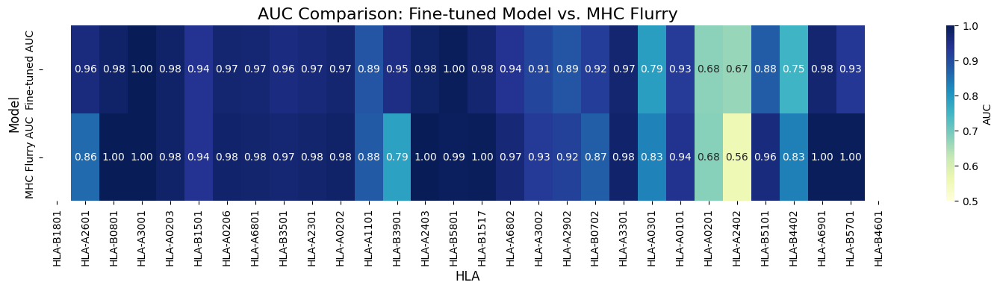

In [139]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc

# Initialize a dictionary to store AUC values
auc_dict = {'HLA': [], 'Fine-tuned AUC': [], 'MHC Flurry AUC': []}

# Loop over each HLA
for i, (HLA, path) in enumerate(evaluations_dt_sorted[['HLA', 'path']].values):
    try:
        HLA = HLA.replace('HLA', 'HLA-')
        last_csv = pd.read_csv(path)
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Trim sequences if necessary
        if len(last_csv['sequence'].iloc[0]) > 300:
            last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            if predictions['peptide'].notna().sum() == 0:
                last_csv = pd.read_csv(path)
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        else:
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        
        # Compute log-transformed MHC Flurry affinity
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # Binary label: binder = 1 if measured binding < 500 nM
        predictions['binder'] = (predictions['measured'] < np.log10(500)).astype(int)
        
        # Invert scores for consistency (higher = stronger binding)
        ft_scores = -predictions['prediction']
        mhc_scores = -predictions['mhc_log']
        
        # Compute AUC for both models
        fpr_ft, tpr_ft, _ = roc_curve(predictions['binder'], ft_scores)
        auc_ft = auc(fpr_ft, tpr_ft)
        
        fpr_mhc, tpr_mhc, _ = roc_curve(predictions['binder'], mhc_scores)
        auc_mhc = auc(fpr_mhc, tpr_mhc)
        
        # Store results
        auc_dict['HLA'].append(HLA)
        auc_dict['Fine-tuned AUC'].append(auc_ft)
        auc_dict['MHC Flurry AUC'].append(auc_mhc)
        
    except Exception as e:
        print(f"Error processing {HLA}: {e}")

# Create a DataFrame from the results and transpose it
auc_df = pd.DataFrame(auc_dict).set_index('HLA').T  # Transpose so HLAs are columns, models are rows

# Create a heatmap
plt.figure(figsize=(15, 4))  # Adjusted size: wider for HLAs on x-axis, shorter for 2 rows
sns.heatmap(auc_df, annot=True, fmt='.2f', cmap='YlGnBu', vmin=0.5, vmax=1.0, 
            cbar_kws={'label': 'AUC'})
plt.title('AUC Comparison: Fine-tuned Model vs. MHC Flurry', fontsize=16)
plt.xlabel('HLA', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.tight_layout()
plt.show()

/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:10

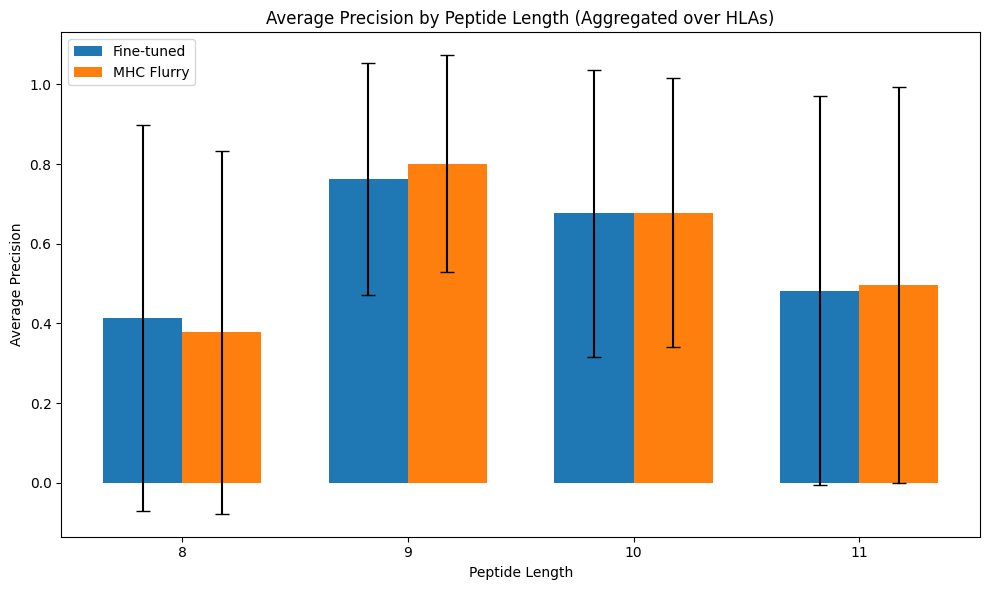

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import average_precision_score

# List to collect average precision (AP) values per HLA, peptide length, and model.
ap_data = []

# Loop over each HLA using the representative path from evaluations_dt_sorted.
for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        last_csv = pd.read_csv(path)
        # Load MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Check and trim sequences if they are longer than 300 characters.
        if len(last_csv['sequence'].iloc[0]) > 300:
            last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            # Fallback: if no peptides matched, try a slightly different trimming.
            if predictions['peptide'].notna().sum() == 0:
                last_csv = pd.read_csv(path)
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        else:
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
         # Compute log-transformed MHC Flurry affinity.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # Create binary label: binder = 1 if measured binding < 500 nM, else 0.
        predictions['binder'] = (predictions['measured'] < np.log10(500)).astype(int)
        
        # Loop over peptide lengths 8, 9, 10, and 11.
        for L in [8, 9, 10, 11]:
            preds_length = predictions[predictions['sequence'].str.len() == L]
            if preds_length.empty:
                continue
            
            # Invert scores so that higher values indicate stronger binding.
            ft_scores = -preds_length['prediction']    # Fine-tuned model scores
            mhc_scores = -preds_length['mhc_log']        # MHC Flurry scores
            
            # Compute average precision score for each model.
            ap_ft = average_precision_score(preds_length['binder'], ft_scores)
            ap_mhc = average_precision_score(preds_length['binder'], mhc_scores)
            
            ap_data.append({'HLA': HLA, 'length': L, 'model': 'Fine-tuned', 'AP': ap_ft})
            ap_data.append({'HLA': HLA, 'length': L, 'model': 'MHC Flurry', 'AP': ap_mhc})
            
    except Exception as e:
        print(f"Error processing {HLA}: {e}")

# Convert the collected data into a DataFrame.
ap_df = pd.DataFrame(ap_data)

# Group by model and peptide length to compute the mean and standard deviation of AP across HLAs.
grouped = ap_df.groupby(['model', 'length'])['AP'].agg(['mean','std']).reset_index()

# We'll create one bar per peptide length for each model.
# Define the order of peptide lengths.
lengths = sorted(grouped['length'].unique())  # [8, 9, 10, 11]
x = np.arange(len(lengths))
width = 0.35

# Separate the aggregated data for each model.
grouped_ft  = grouped[grouped['model'] == 'Fine-tuned'].set_index('length').reindex(lengths)
grouped_mhc = grouped[grouped['model'] == 'MHC Flurry'].set_index('length').reindex(lengths)

# Create a figure with two bars per peptide length.
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width/2, grouped_ft['mean'], width, yerr=grouped_ft['std'], capsize=5, label='Fine-tuned')
ax.bar(x + width/2, grouped_mhc['mean'], width, yerr=grouped_mhc['std'], capsize=5, label='MHC Flurry')

ax.set_xticks(x)
ax.set_xticklabels(lengths)
ax.set_xlabel('Peptide Length')
ax.set_ylabel('Average Precision')
ax.set_title('Average Precision by Peptide Length (Aggregated over HLAs)')
ax.legend()

plt.tight_layout()
plt.show()


/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1033: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
/clusterfs/nilah/sergio/miniconda3/envs/ESM_cambrian/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:10

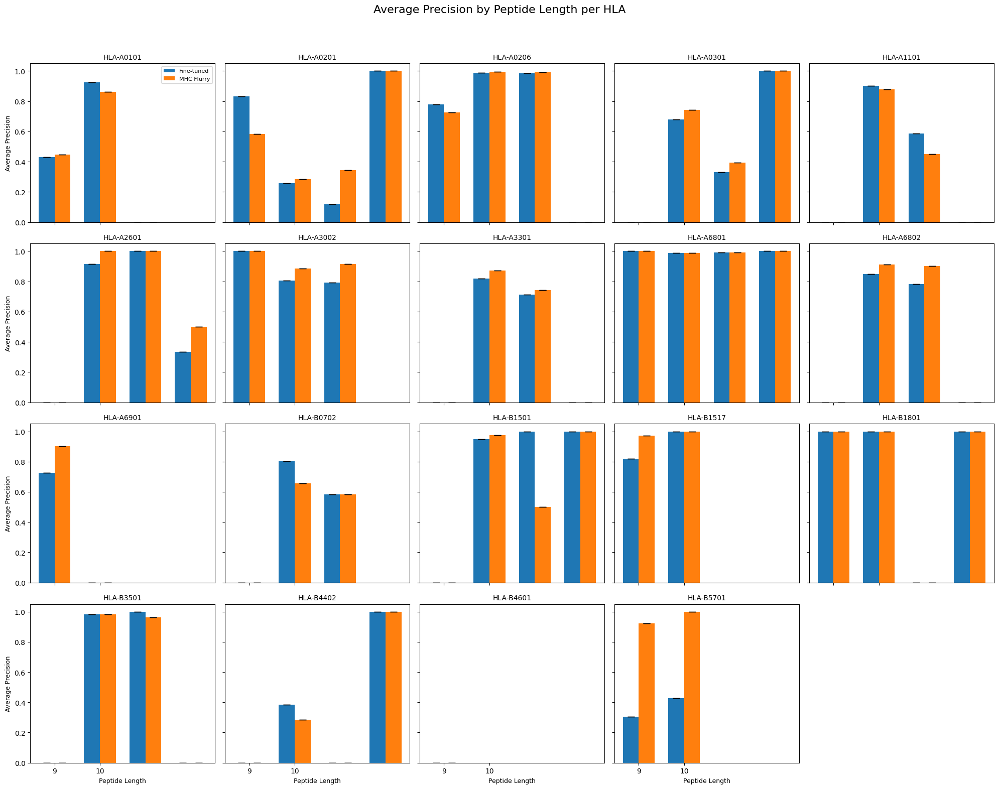

In [102]:
from sklearn.metrics import average_precision_score

# =============================================================================
# Step 1. Compute AP per HLA, peptide length, and model.
# We assume evaluations_dt_sorted has columns 'HLA' and 'path' to get the representative file.
ap_data = []

for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        # Load the fine-tuned model predictions.
        last_csv = pd.read_csv(path)
        # Load the corresponding MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Merge predictions (assumes 'sequence' in fine-tuned and 'peptide' in MHC Flurry).
        predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        
        # Compute log-transformed MHC Flurry affinity.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]
        
        # Create binary label: binder = 1 if measured binding < 500 nM, else 0.
        predictions['binder'] = (predictions['measured'] < np.log10(500)).astype(int)
        
        # Loop over peptide lengths 8, 9, 10, and 11.
        for L in [8, 9, 10, 11]:
            preds_length = predictions[predictions['sequence'].str.len() == L]
            if preds_length.empty:
                continue
            
            # Invert scores so that higher values indicate stronger binding.
            # (Lower predicted values mean stronger binding; for AP computation, higher scores should mean binder.)
            ft_scores = -preds_length['prediction']    # Fine-tuned model scores
            mhc_scores = -preds_length['mhc_log']        # MHC Flurry scores
            
            # Compute average precision (AP) for each model.
            ap_ft = average_precision_score(preds_length['binder'], ft_scores)
            ap_mhc = average_precision_score(preds_length['binder'], mhc_scores)
            
            ap_data.append({'HLA': HLA, 'length': L, 'model': 'Fine-tuned', 'AP': ap_ft})
            ap_data.append({'HLA': HLA, 'length': L, 'model': 'MHC Flurry', 'AP': ap_mhc})
    except Exception as e:
        print(f"Error processing {HLA}: {e}")

# Convert the list to a DataFrame.
ap_df = pd.DataFrame(ap_data)

# =============================================================================
# Step 2. Group by HLA, peptide length, and model to compute mean and std (in case there are replicates)
# (If you only have one measurement per HLA-length-model, the std will be zero.)
grouped_hla = ap_df.groupby(['HLA', 'length', 'model'])['AP'].agg(['mean','std']).reset_index()

# =============================================================================
# Step 3. Create one panel per HLA.
unique_hlas = grouped_hla['HLA'].unique()
n_hlas = len(unique_hlas)
# We'll arrange the panels in a grid – adjust the number of columns as desired.
cols = 5
rows = int(np.ceil(n_hlas/cols))

fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows), sharex=True, sharey=True)
axes = axes.flatten()

for i, hla in enumerate(unique_hlas):
    ax = axes[i]
    sub_df = grouped_hla[grouped_hla['HLA'] == hla]
    lengths = sorted(sub_df['length'].unique())
    x = np.arange(len(lengths))
    width = 0.35
    
    # Get data for Fine-tuned and MHC Flurry.
    sub_ft  = sub_df[sub_df['model'] == 'Fine-tuned'].set_index('length').reindex(lengths)
    sub_mhc = sub_df[sub_df['model'] == 'MHC Flurry'].set_index('length').reindex(lengths)
    
    # If there's only one measurement per cell, std may be NaN. Replace with 0.
    sub_ft['std'] = sub_ft['std'].fillna(0)
    sub_mhc['std'] = sub_mhc['std'].fillna(0)
    
    # Plot bars.
    ax.bar(x - width/2, sub_ft['mean'], width, yerr=sub_ft['std'], capsize=5, label='Fine-tuned')
    ax.bar(x + width/2, sub_mhc['mean'], width, yerr=sub_mhc['std'], capsize=5, label='MHC Flurry')
    ax.set_xticks(x)
    ax.set_xticklabels(lengths)
    ax.set_title(hla, fontsize=10)
    
    if i % cols == 0:
        ax.set_ylabel("Average Precision", fontsize=9)
    if i >= (rows-1)*cols:
        ax.set_xlabel("Peptide Length", fontsize=9)
    
    # Add a legend only in the first panel.
    if i == 0:
        ax.legend(fontsize=8)
        
# Remove any unused subplots.
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Average Precision by Peptide Length per HLA", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Error processing HLA-B1801: With n_samples=1, test_size=0.4 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.
Mean Squared Error (Stacking Ensemble): 0.4856502858876275


/tmp/ipykernel_1211056/2212958013.py:102: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])


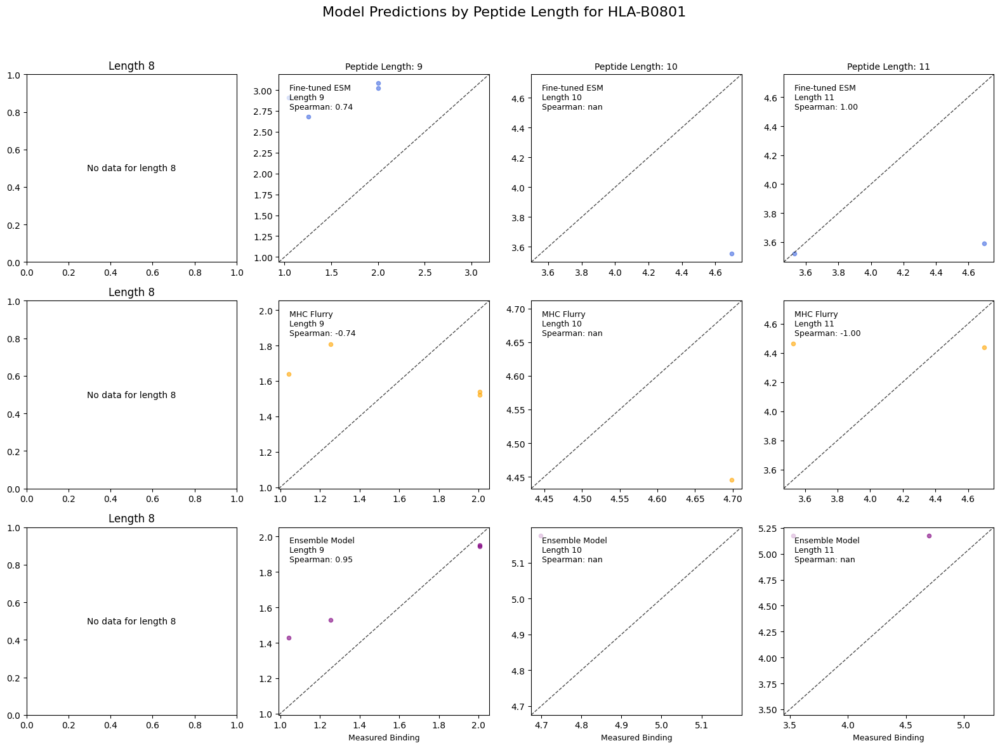

Mean Squared Error (Stacking Ensemble): 0.2690230634930964


/tmp/ipykernel_1211056/2212958013.py:102: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])


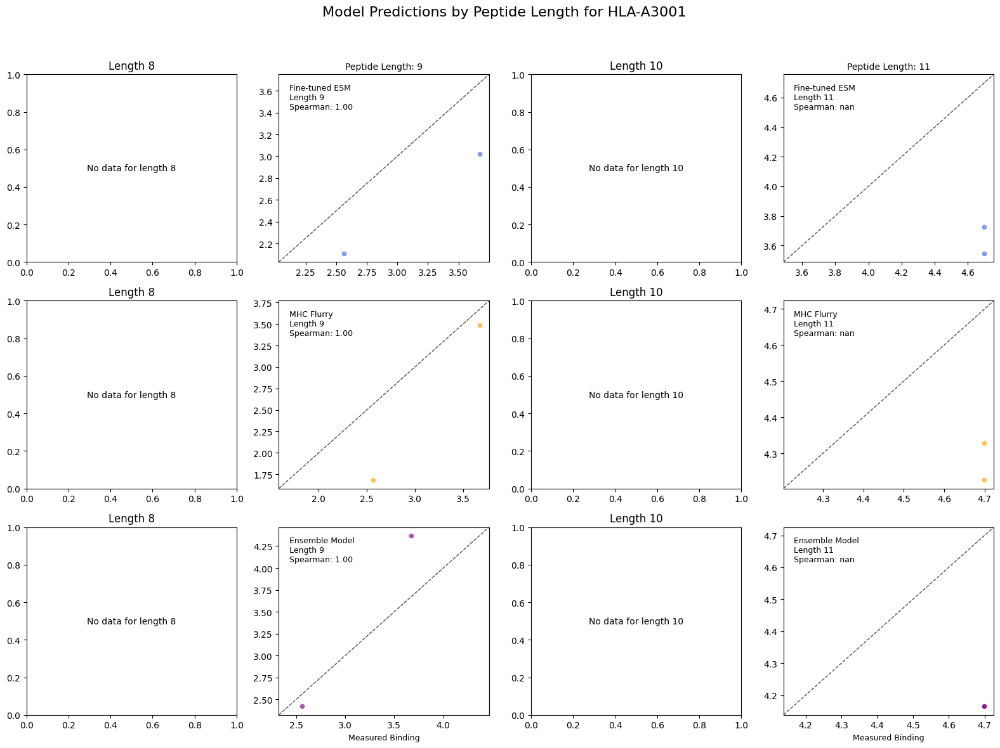

Mean Squared Error (Stacking Ensemble): 0.256655244504493


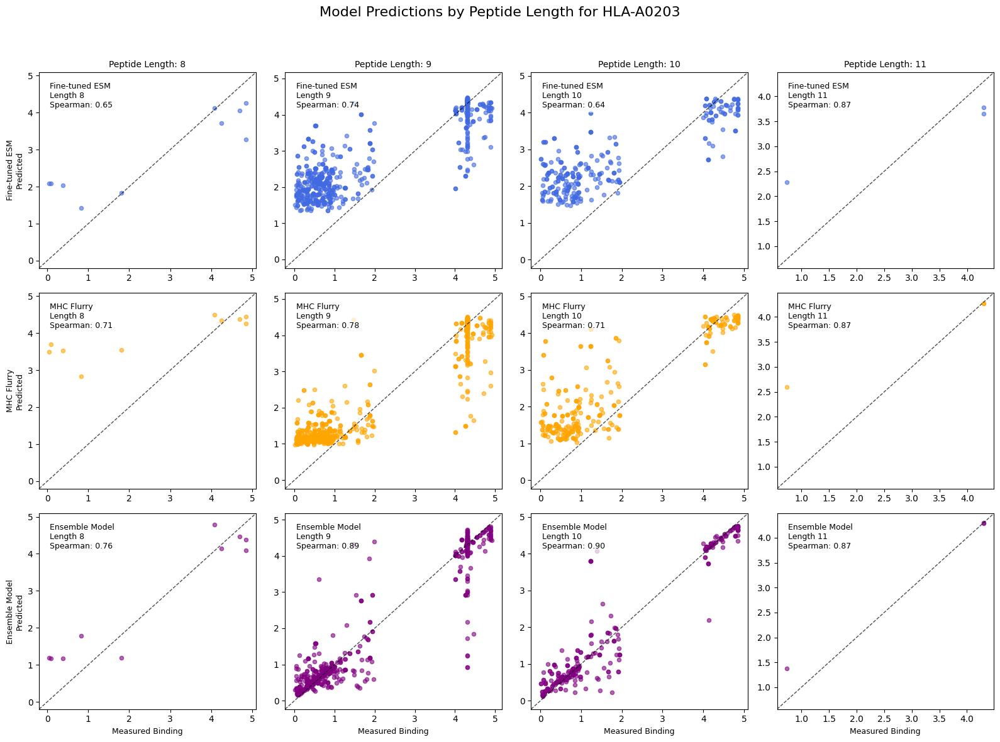

Mean Squared Error (Stacking Ensemble): 0.40428977309516745


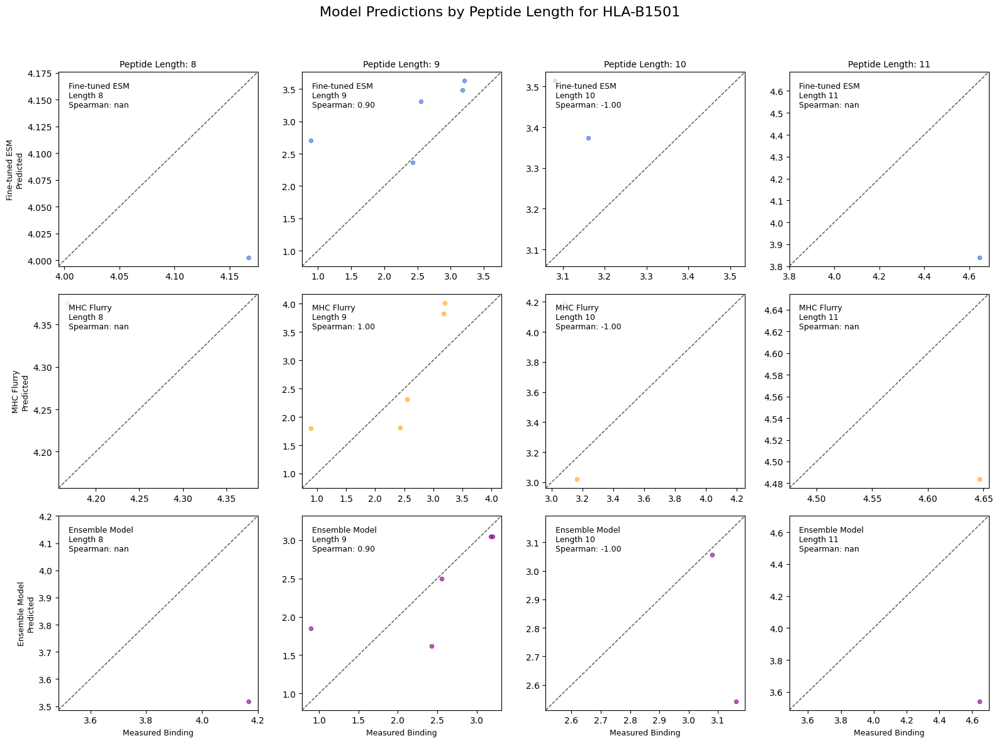

Mean Squared Error (Stacking Ensemble): 0.37706513580544126


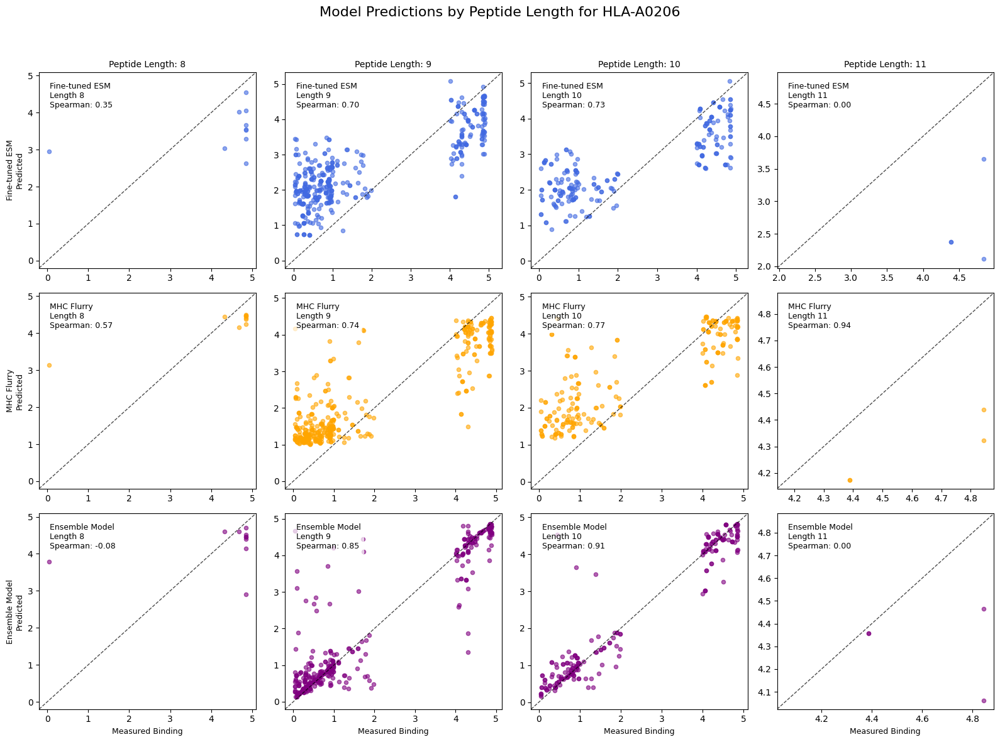

Mean Squared Error (Stacking Ensemble): 0.5116065240948628


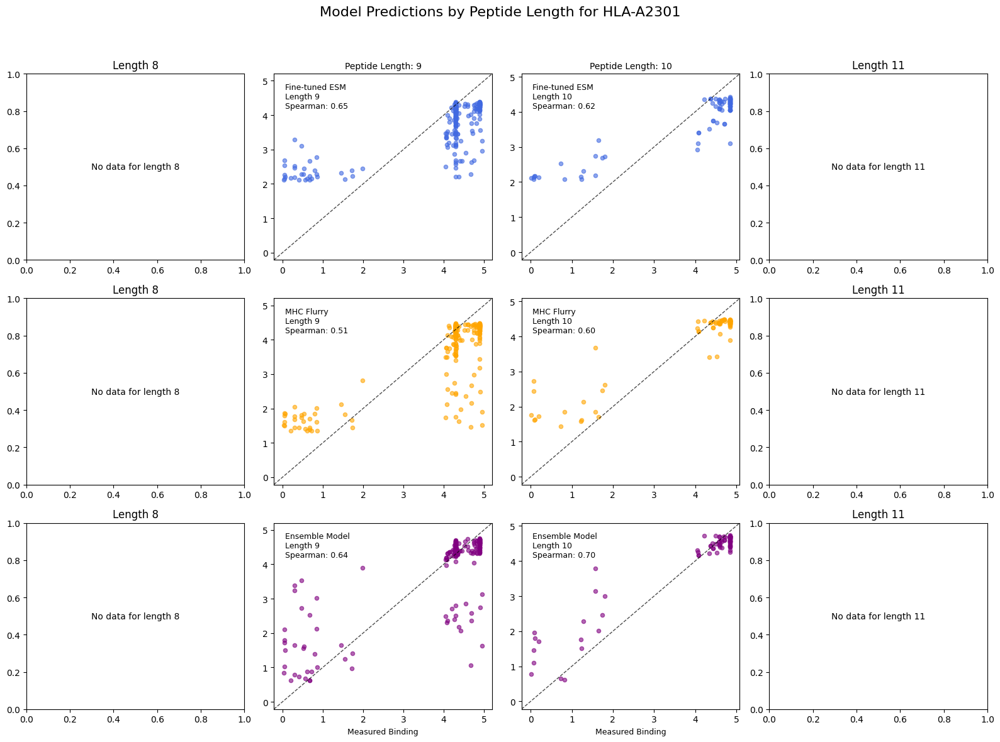

Mean Squared Error (Stacking Ensemble): 0.6291017649995403


/tmp/ipykernel_1211056/2212958013.py:102: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])


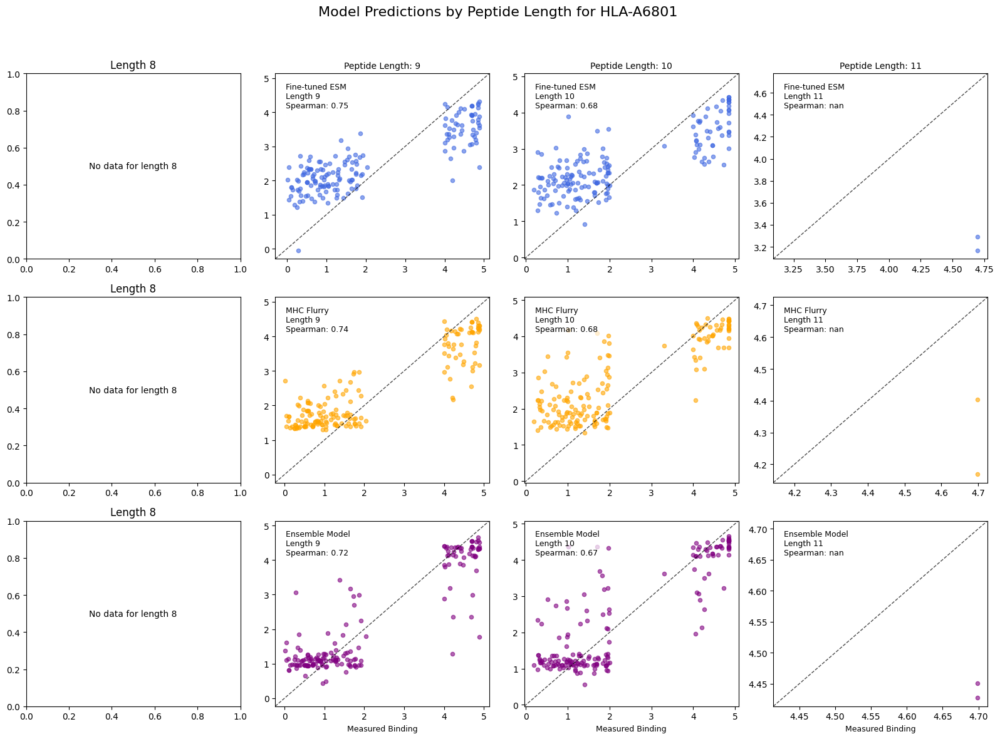

Mean Squared Error (Stacking Ensemble): 0.2216542761835542


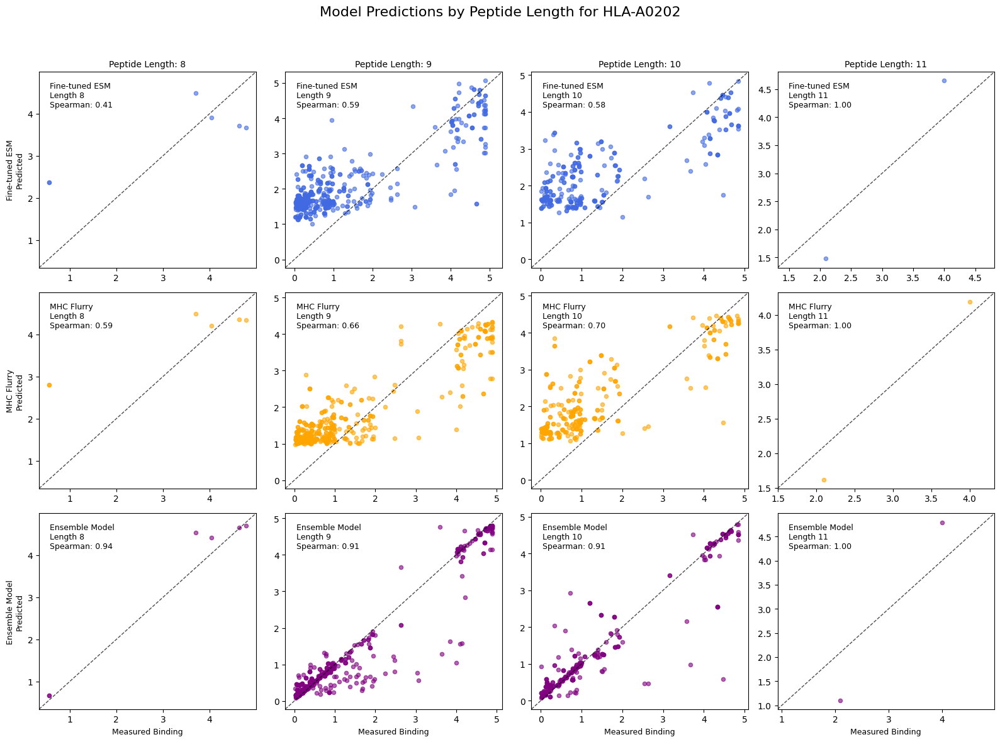

Mean Squared Error (Stacking Ensemble): 1.064309664396932


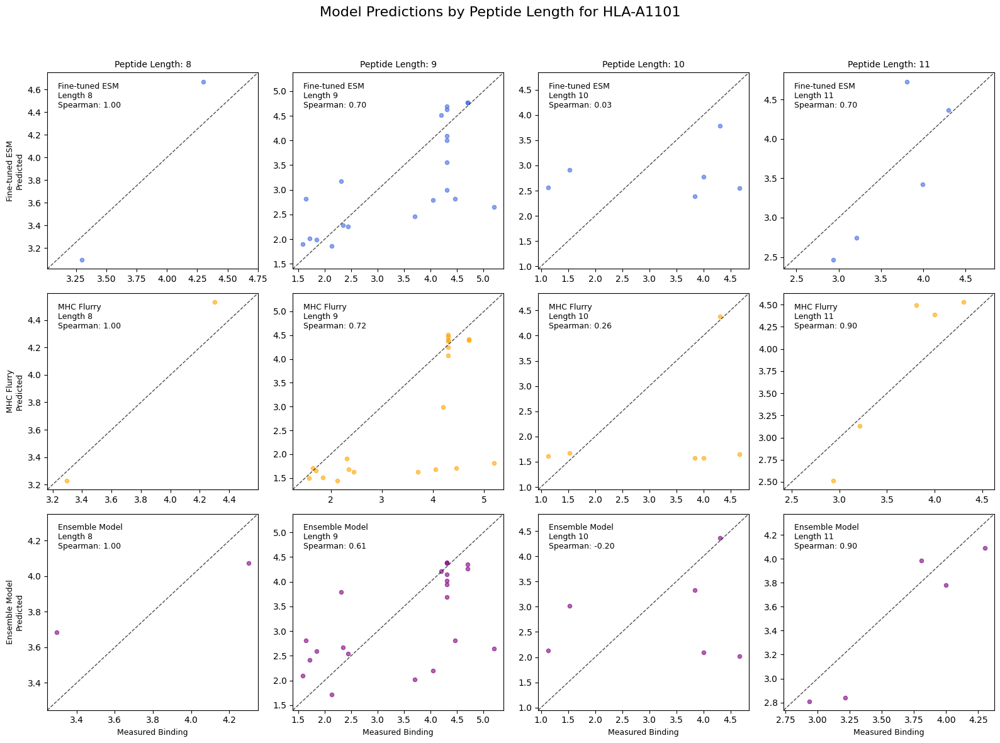

Mean Squared Error (Stacking Ensemble): 0.8405597128891854


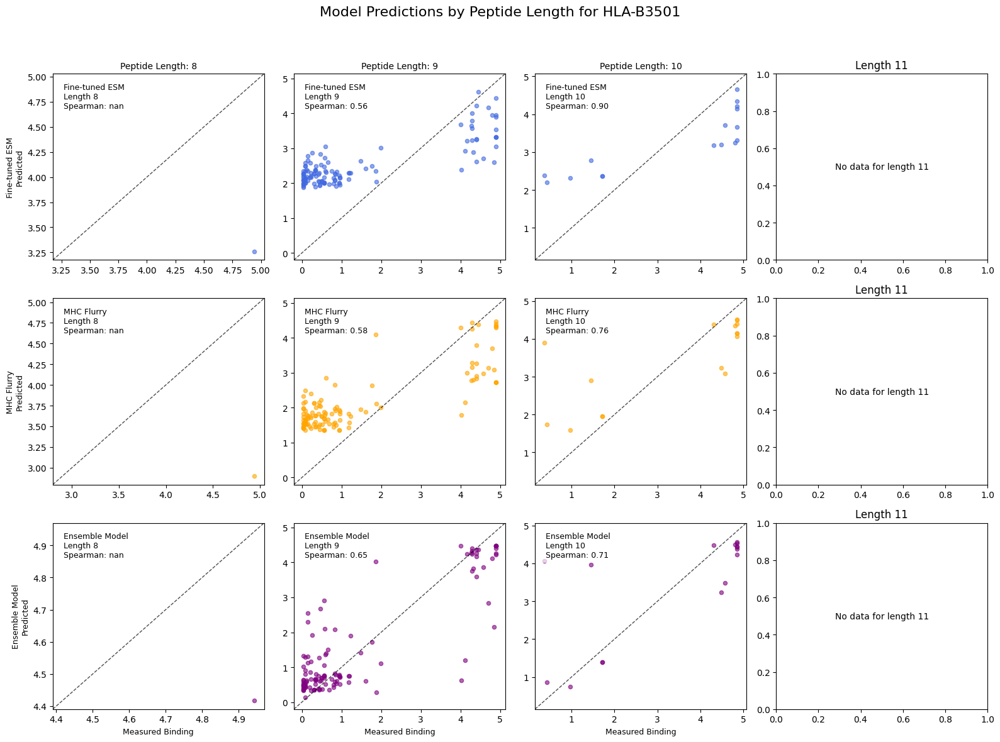

Mean Squared Error (Stacking Ensemble): 0.8554989340996224


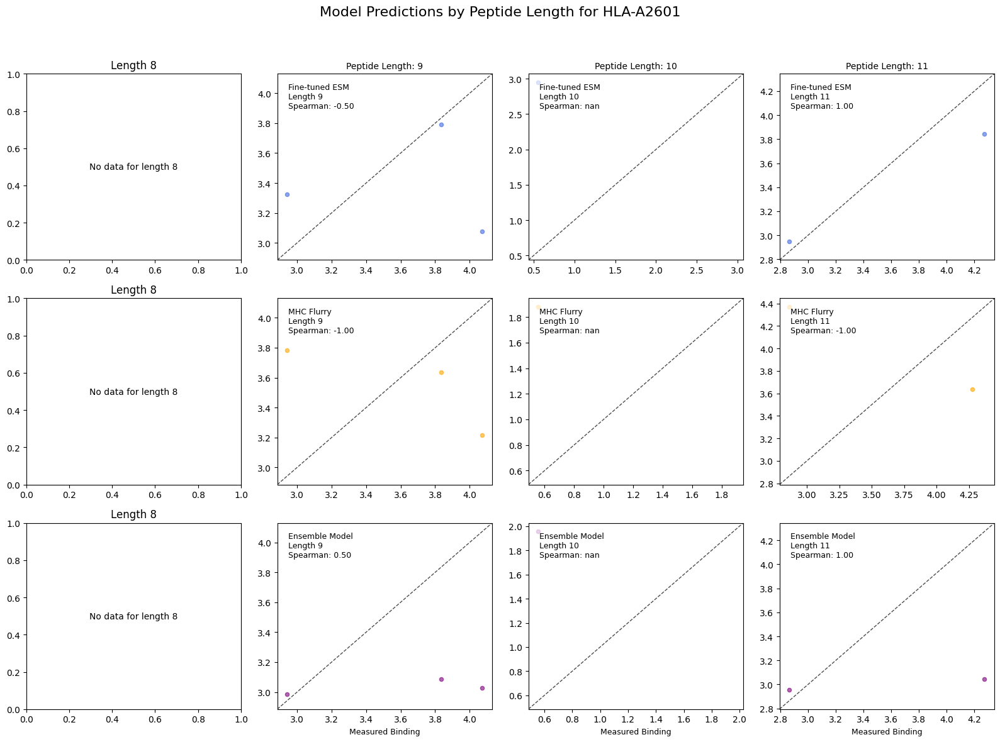

Mean Squared Error (Stacking Ensemble): 0.10254911463171952


/tmp/ipykernel_1211056/2212958013.py:102: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])


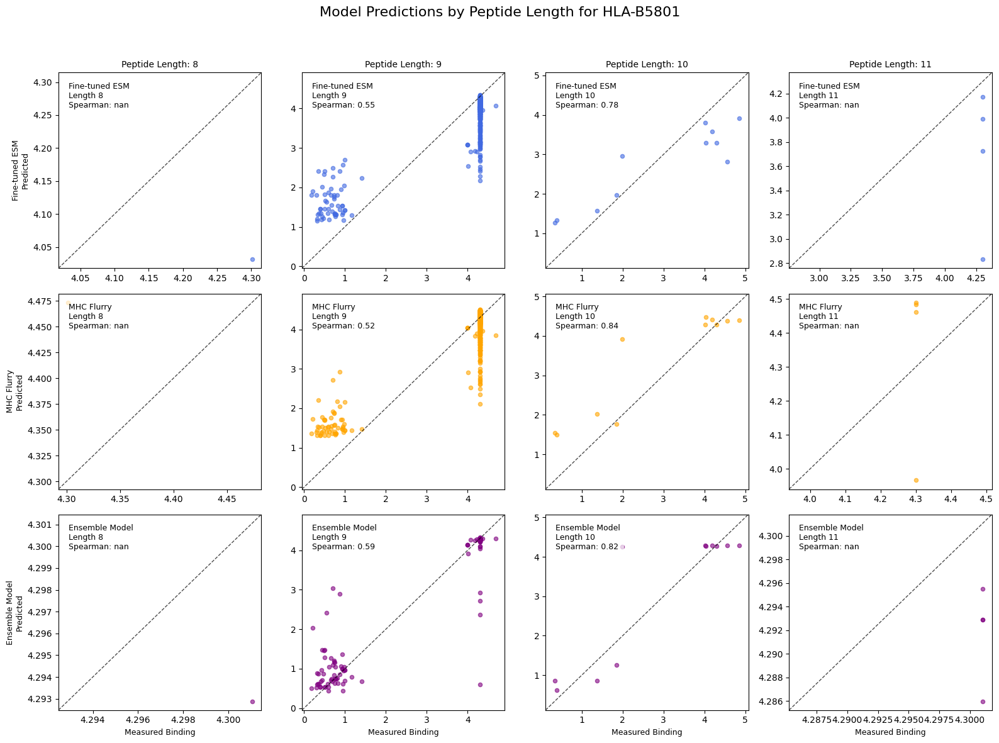

Mean Squared Error (Stacking Ensemble): 0.20166161899040996


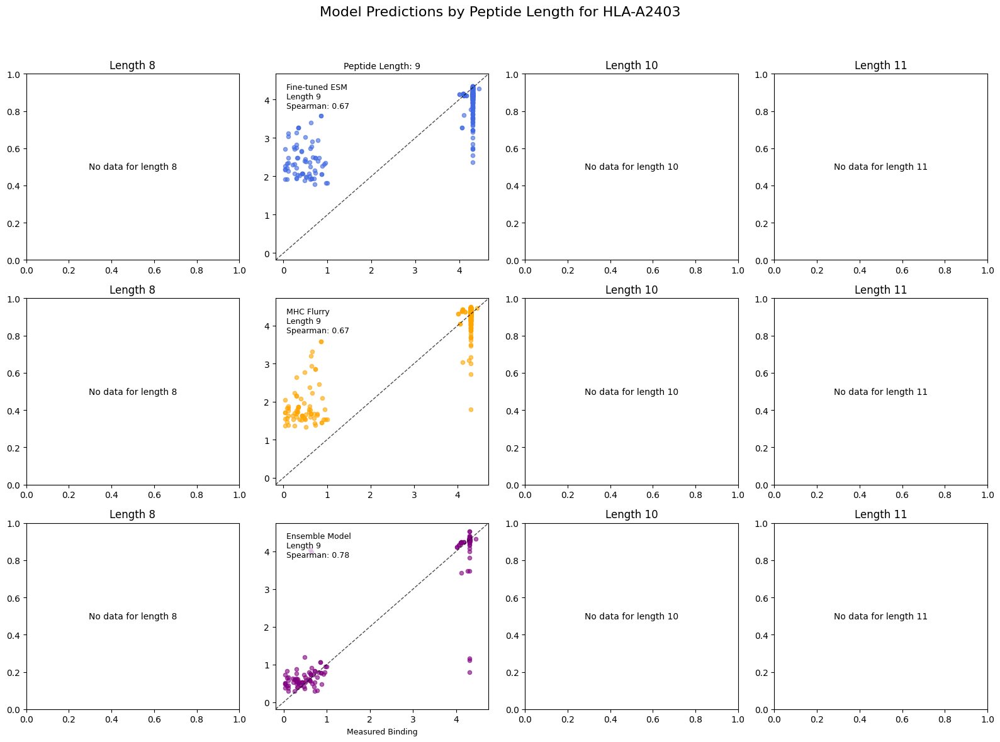

Mean Squared Error (Stacking Ensemble): 0.23606259321630044


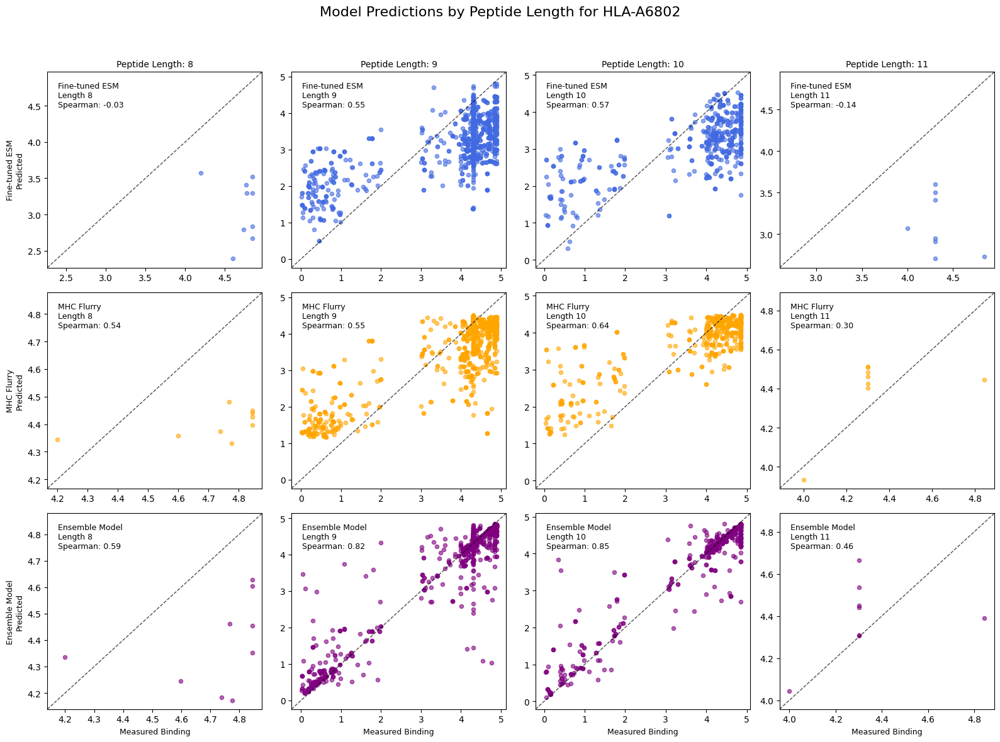

Mean Squared Error (Stacking Ensemble): 0.4896231872267932


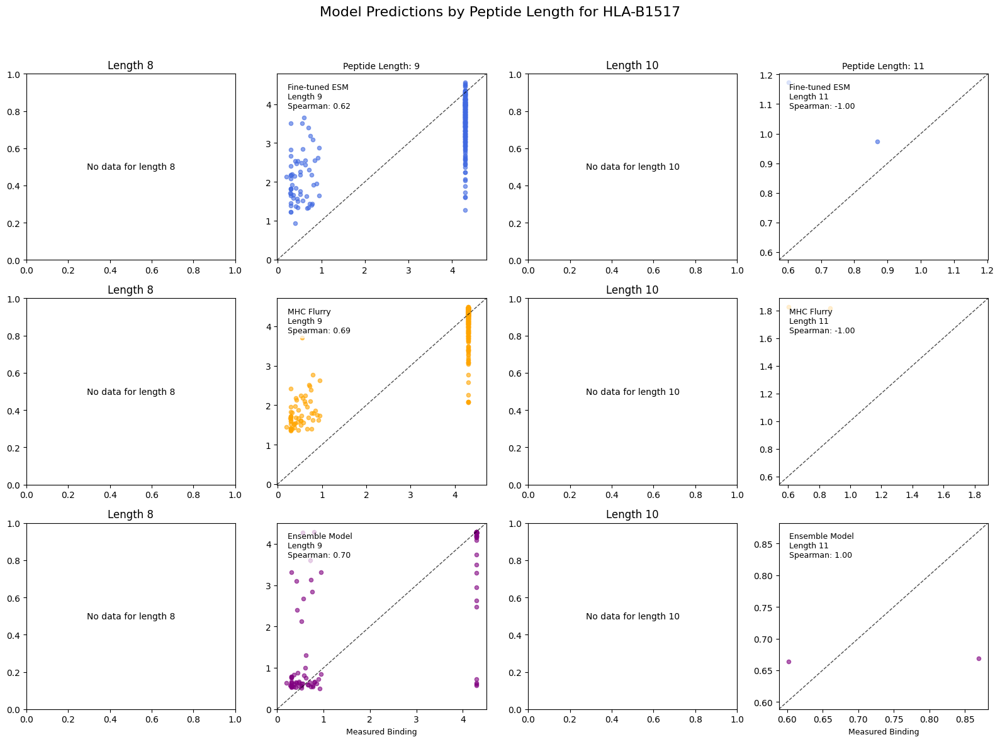

Mean Squared Error (Stacking Ensemble): 1.8379120201721466


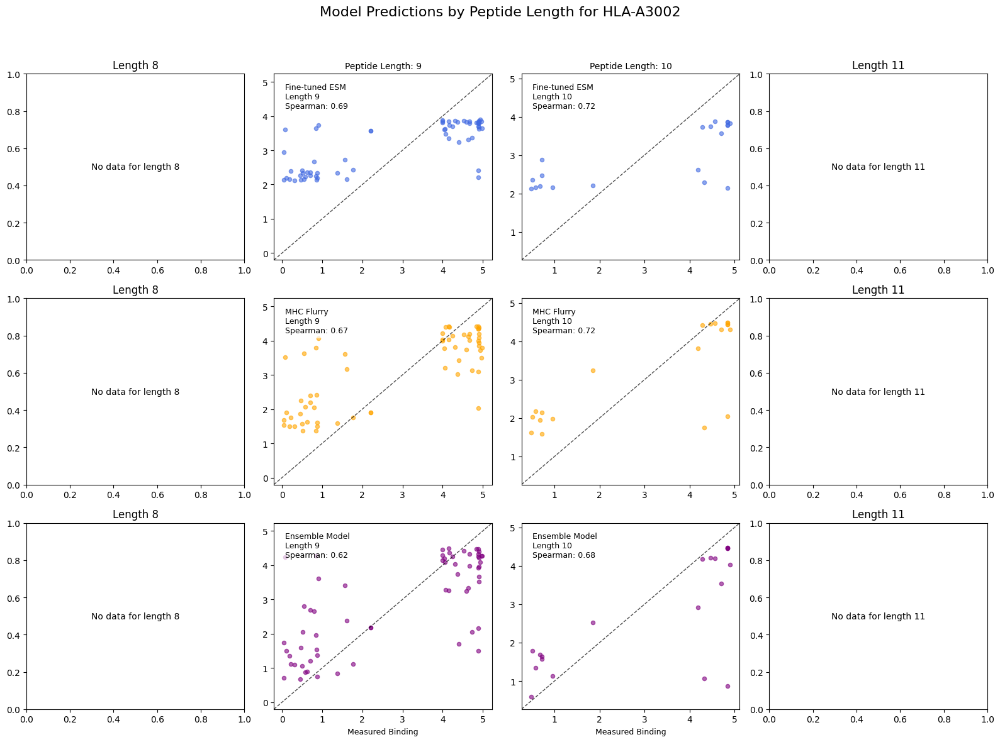

Mean Squared Error (Stacking Ensemble): 0.8340227018923582


/tmp/ipykernel_1211056/2212958013.py:102: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])


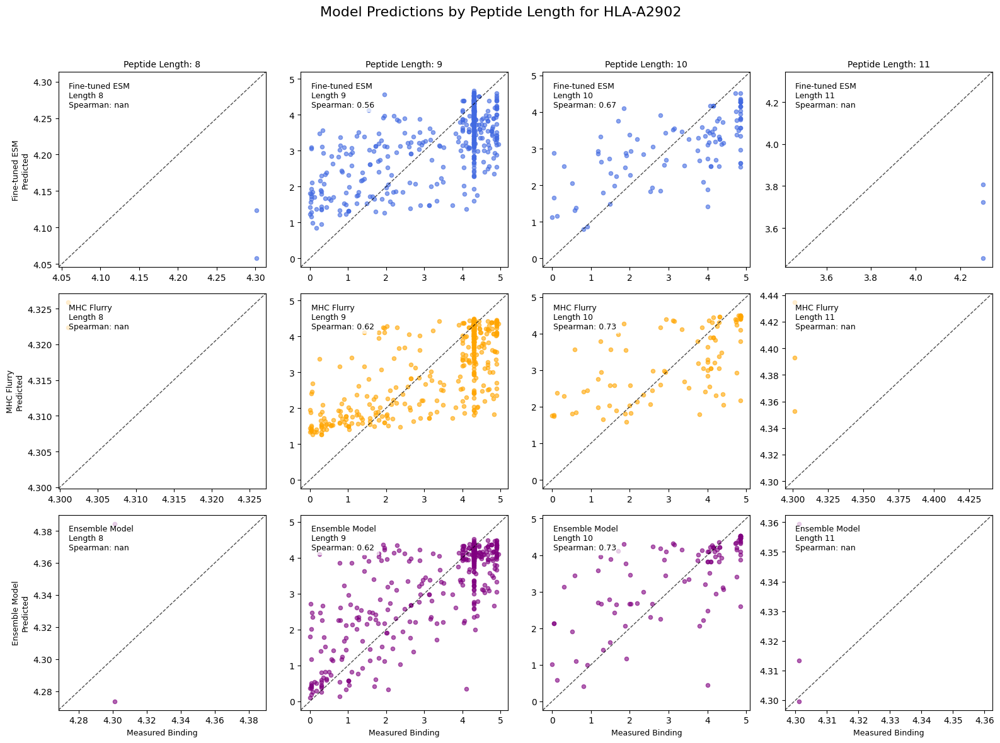

Mean Squared Error (Stacking Ensemble): 1.3839025334958341


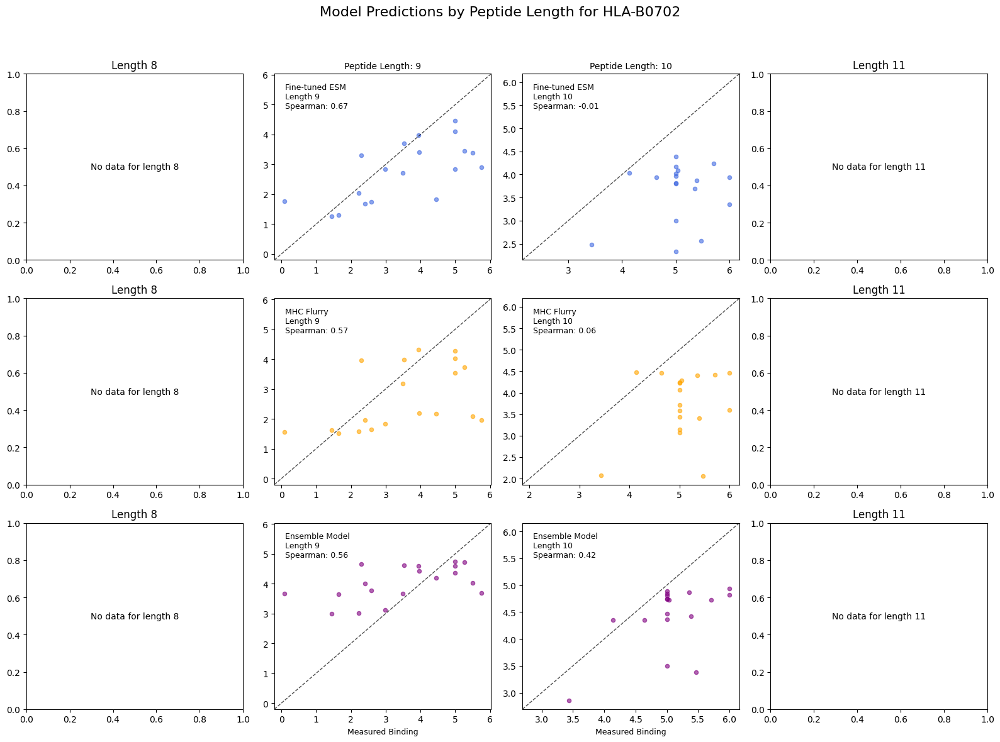

Mean Squared Error (Stacking Ensemble): 0.4386825551409458


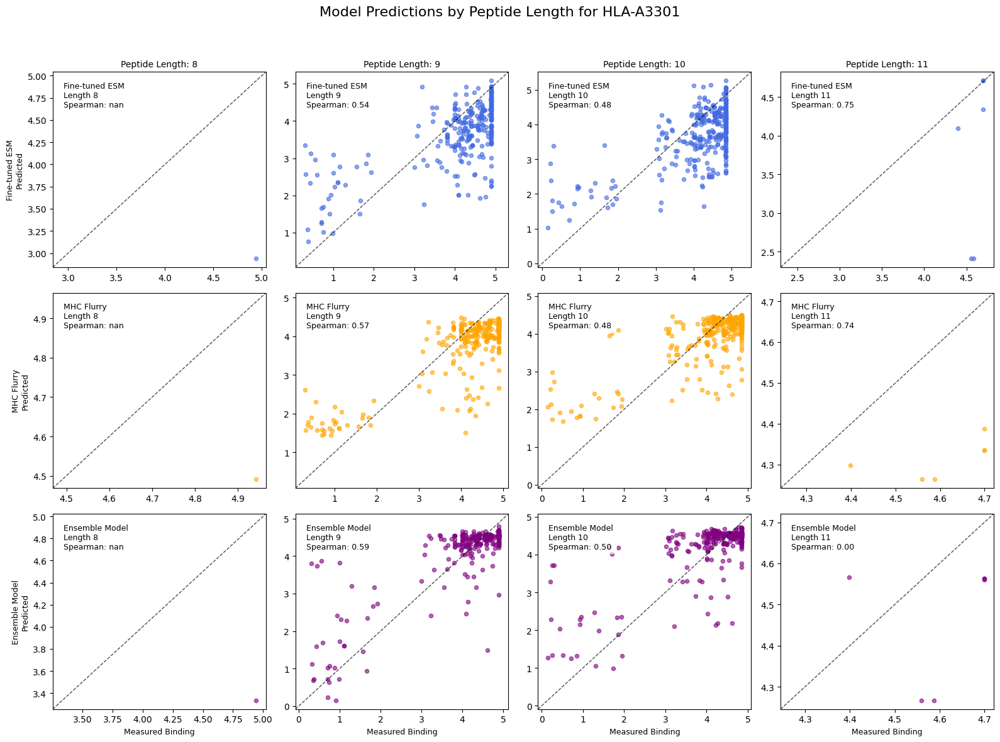

Mean Squared Error (Stacking Ensemble): 1.9292571350792642


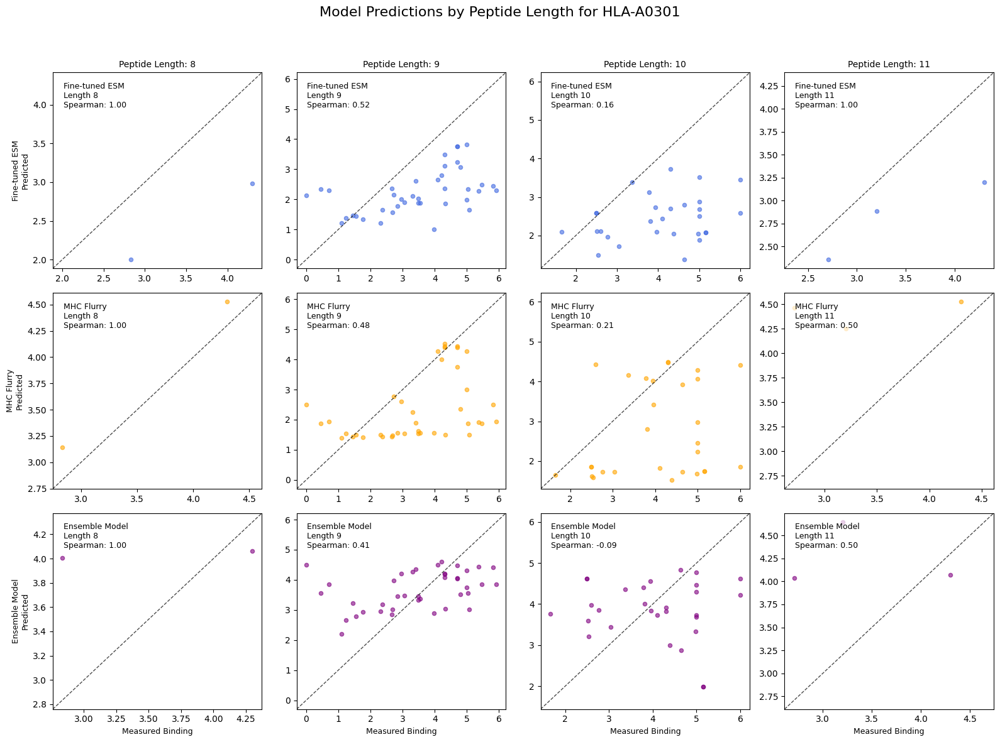

Mean Squared Error (Stacking Ensemble): 0.5150890419464904


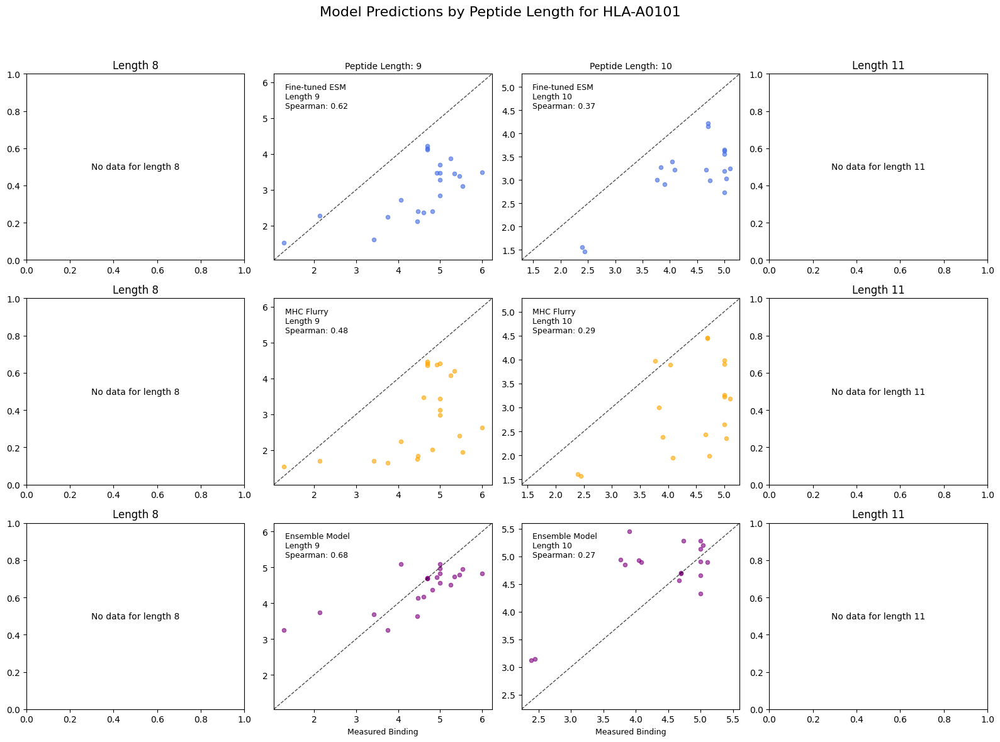

Mean Squared Error (Stacking Ensemble): 1.8058749963402076


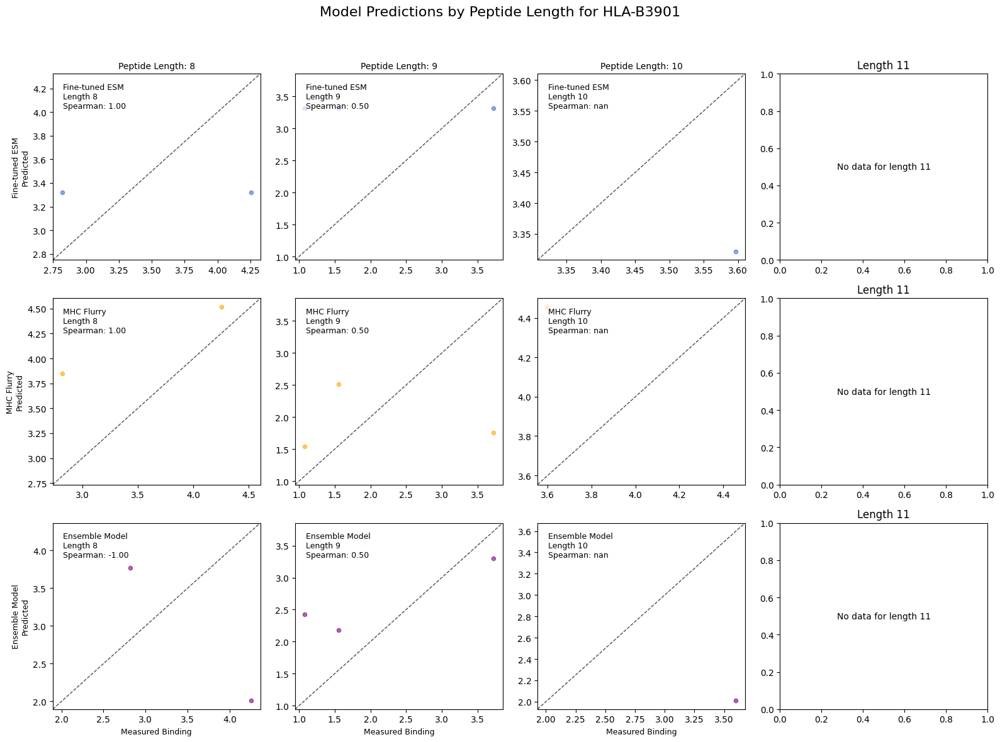

Mean Squared Error (Stacking Ensemble): 1.2030405880283512


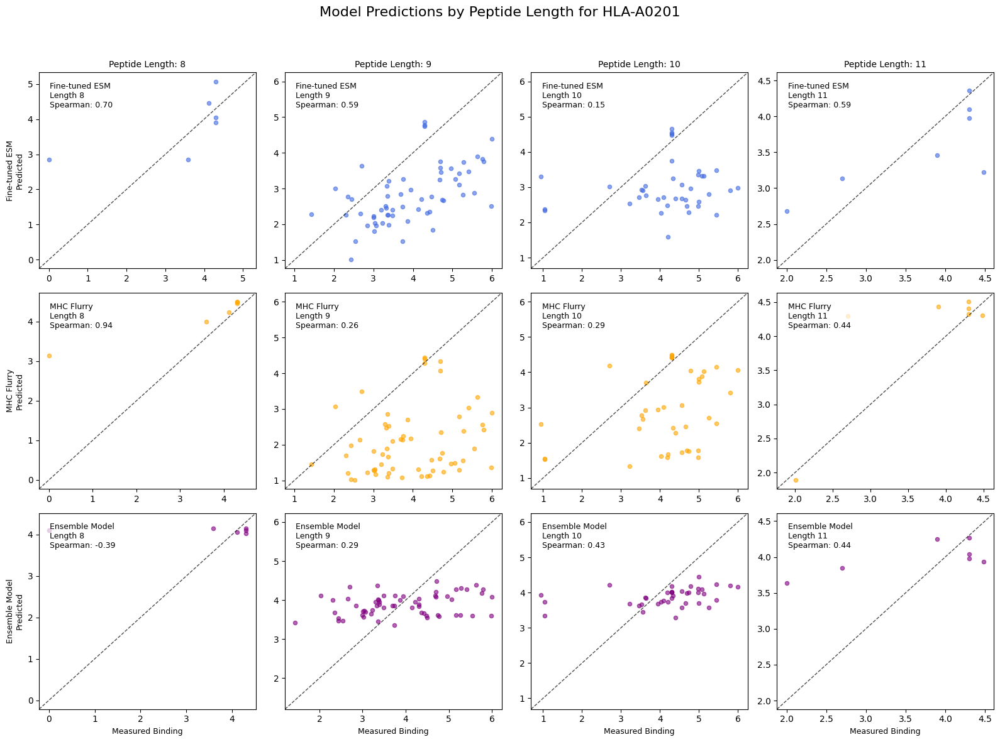

Mean Squared Error (Stacking Ensemble): 0.28773368443274516


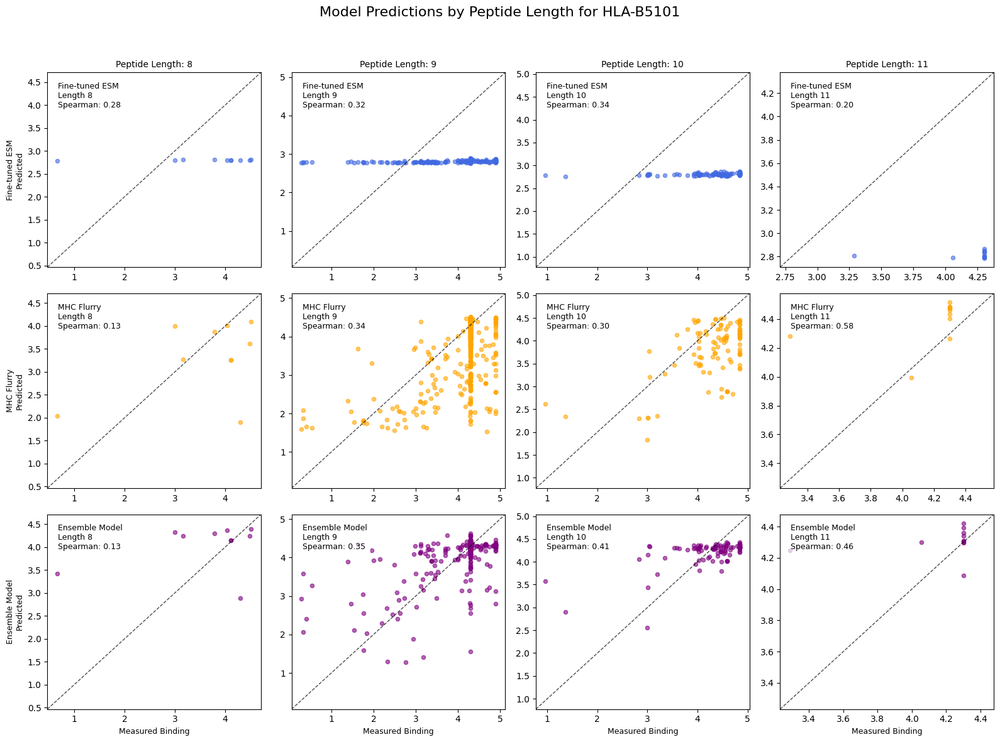

Mean Squared Error (Stacking Ensemble): 2.917008835362591


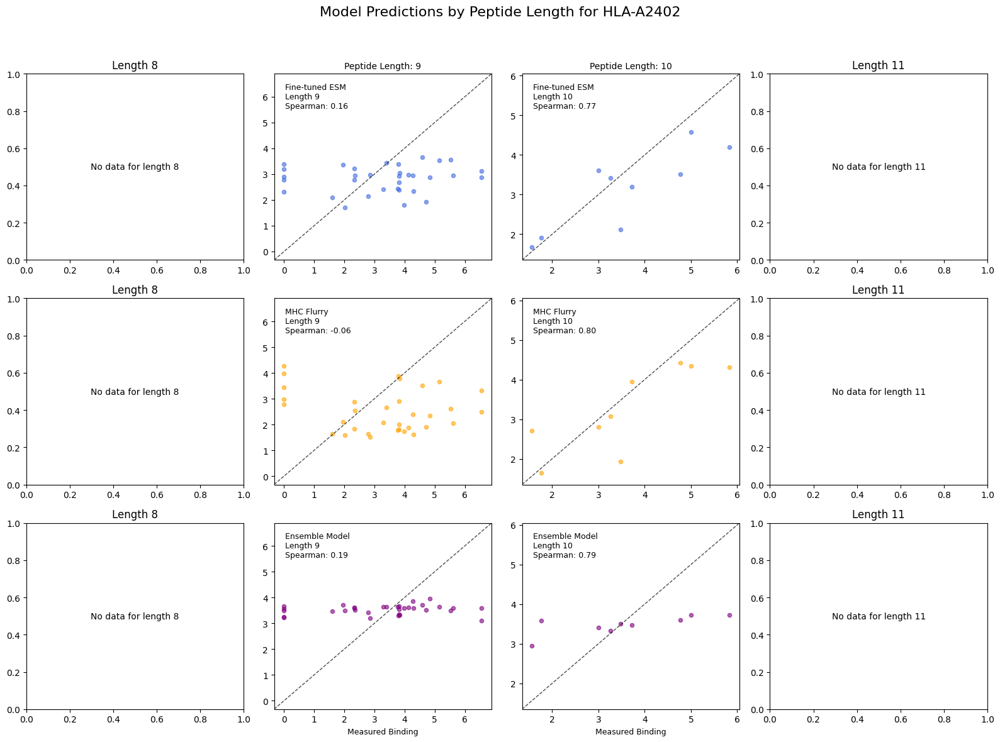

Mean Squared Error (Stacking Ensemble): 1.1146830807476809


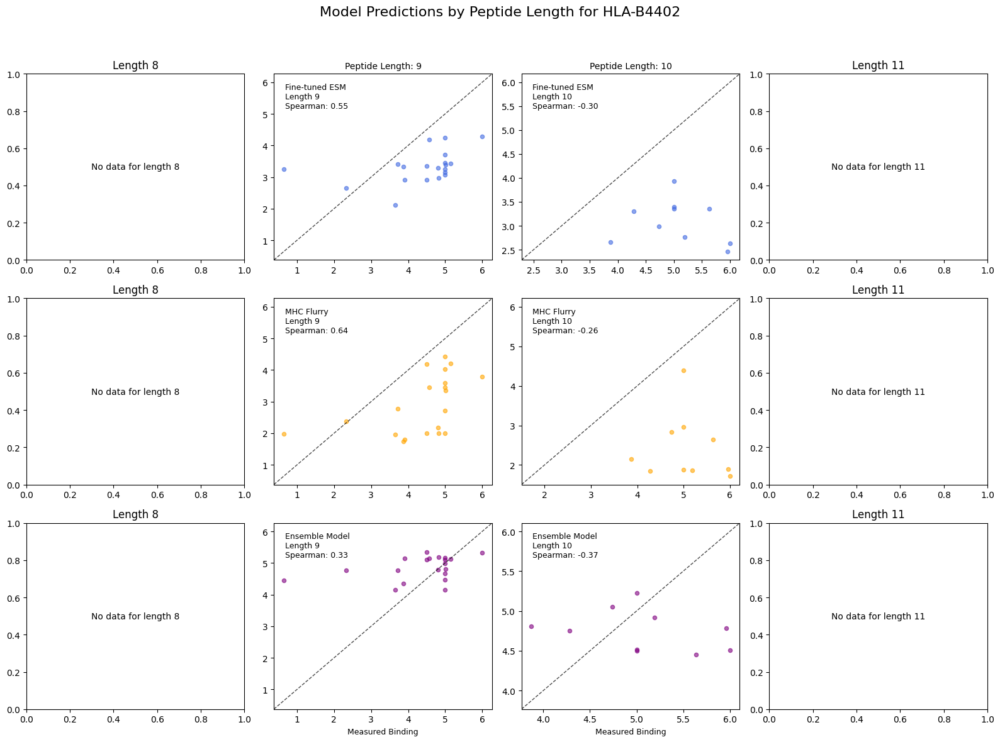

Mean Squared Error (Stacking Ensemble): 0.11616073697193217


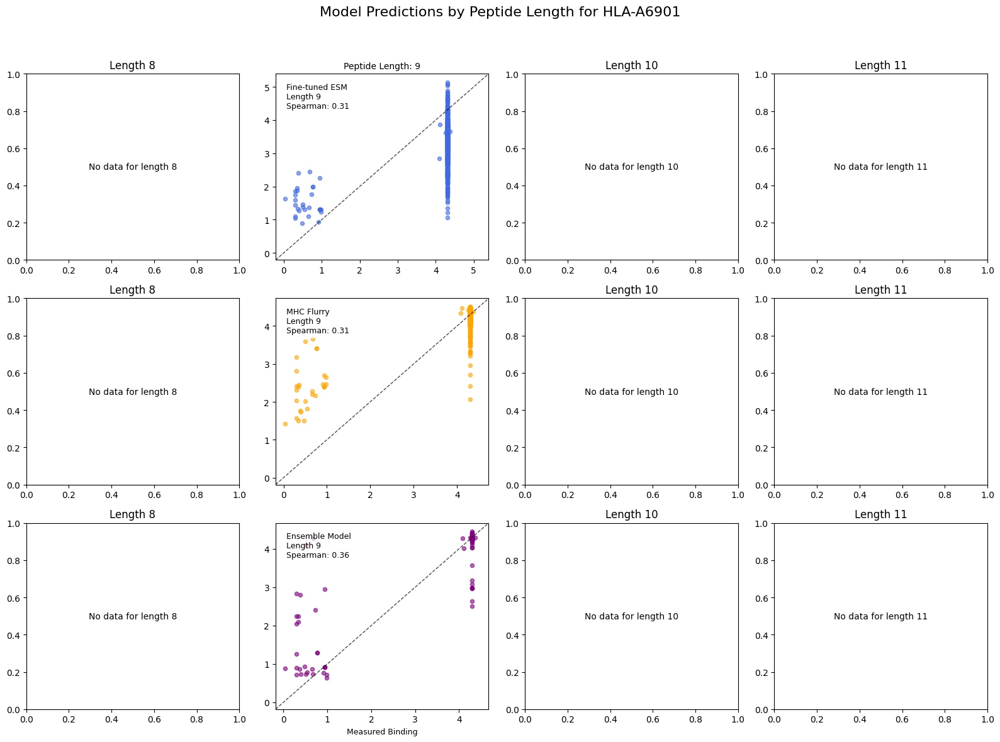

Mean Squared Error (Stacking Ensemble): 0.09273391984356773


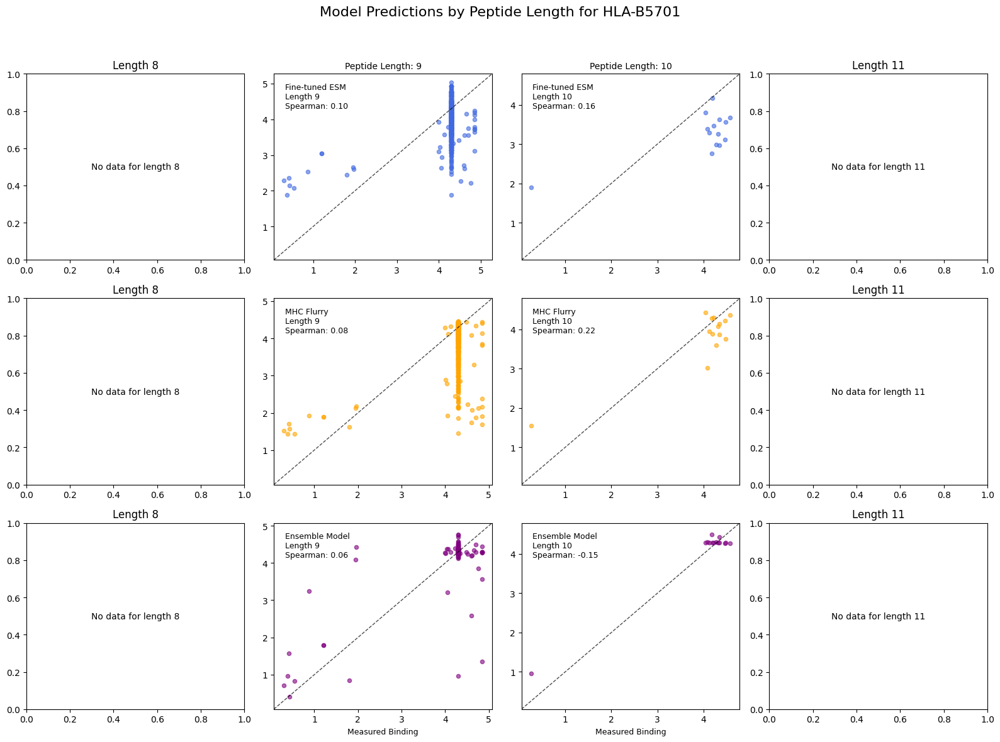

Mean Squared Error (Stacking Ensemble): 0.00021245199809279743


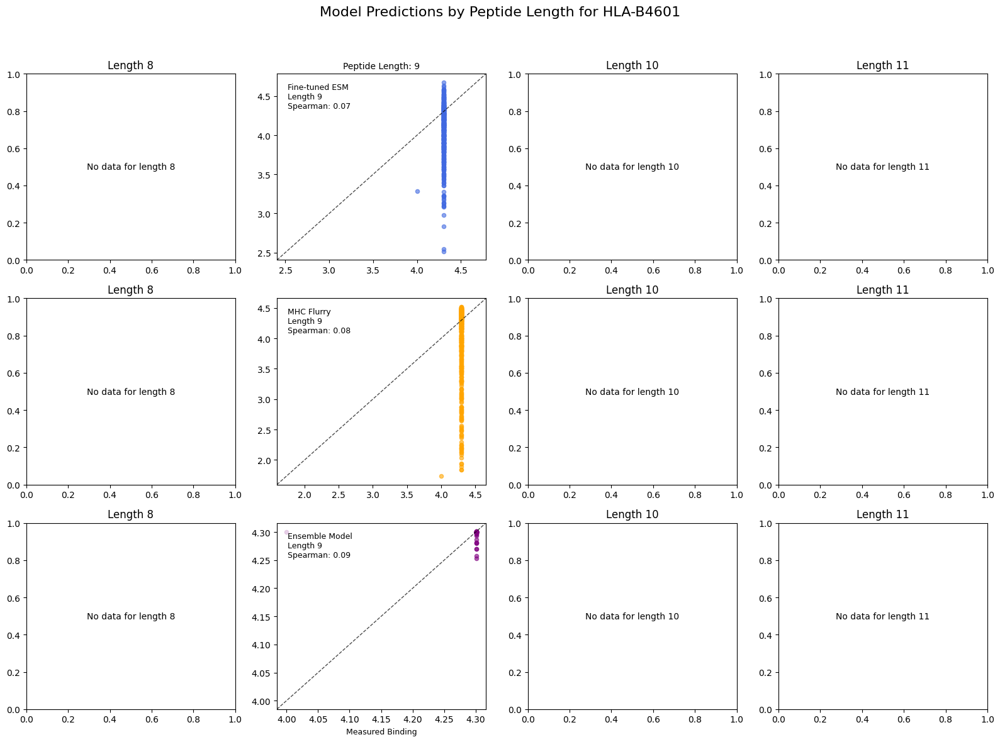

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        last_csv = pd.read_csv(path)
        # Load MHC Flurry predictions.
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Check and trim sequences if they are longer than 300 characters.
        if len(last_csv['sequence'].iloc[0]) > 300:
            last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[365:])
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
            # Fallback: if no peptides matched, try a slightly different trimming.
            if predictions['peptide'].notna().sum() == 0:
                last_csv = pd.read_csv(path)
                last_csv['sequence'] = last_csv['sequence'].apply(lambda x: x[362:])
                predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
        else:
            predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='left')
          # Compute log-transformed MHC Flurry affinity.
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        predictions = predictions[predictions['mhc_log'].notna()]

        # Assume predictions is your DataFrame with columns: 'sequence', 'prediction', 'mhc_log', 'measured'
        X = predictions[['sequence', 'prediction', 'mhc_log']]
        y = predictions['measured']
        
        # Split the data for training and testing.
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
        
        X_train_subset = X_train[['prediction', 'mhc_log']]
        X_test_subset = X_test[['prediction', 'mhc_log']]
        
        # Define two base learners.
        estimators = [
            ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
            ('gb', GradientBoostingRegressor(n_estimators=100, random_state=42))
        ]
        
        # Create a stacking ensemble with a linear regression as the final estimator.
        stack_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
        stack_model.fit(X_train_subset, y_train)
        
        # Predict on the test set.
        y_pred = stack_model.predict(X_test_subset)
        
        # Evaluate the performance.
        mse = mean_squared_error(y_test, y_pred)
        print("Mean Squared Error (Stacking Ensemble):", mse)
        
        # Create a DataFrame for stacking predictions.
        enseml_predictions = pd.DataFrame(y_pred)
        ensembl_df = pd.concat([
            X_test.reset_index(drop=True),
            enseml_predictions,
            y_test.reset_index(drop=True)
        ], axis=1)
        
        # Add a new column for peptide length.
        ensembl_df['length'] = ensembl_df['sequence'].str.len()
        
        # Define model settings: each row is one method.
        model_names  = ['Fine-tuned ESM', 'MHC Flurry', 'Ensemble Model']
        model_columns = ['prediction', 'mhc_log', 0]  # Note: column '0' comes from enseml_predictions.
        colors       = ['royalblue', 'orange', 'purple']
        
        # Define the peptide lengths to visualize.
        lengths = [8, 9, 10, 11]
        
        # Create a grid: 3 rows (models) x 4 columns (peptide lengths).
        fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 12), sharex=False, sharey=False)
        
        for row_idx, (model_name, model_col, color) in enumerate(zip(model_names, model_columns, colors)):
            for col_idx, L in enumerate(lengths):
                ax = axes[row_idx, col_idx]
                # Filter rows with the current peptide length.
                cell_df = ensembl_df[ensembl_df['length'] == L]
                
                if cell_df.empty:
                    ax.text(0.5, 0.5, f"No data for length {L}", ha='center', va='center')
                    ax.set_title(f"Length {L}")
                    continue
                
                # Scatter plot: measured vs. predicted for the current method.
                ax.scatter(cell_df['measured'], cell_df[model_col],
                           color=color, alpha=0.6, s=20, label=model_name)
                
                # Set a common range for the x=y reference line.
                all_vals = np.concatenate([cell_df['measured'].values, cell_df[model_col].values])
                min_val, max_val = np.min(all_vals), np.max(all_vals)
                pad = (max_val - min_val) * 0.05
                lims = [min_val - pad, max_val + pad]
                ax.plot(lims, lims, 'k--', alpha=0.7, lw=1)
                ax.set_xlim(lims)
                ax.set_ylim(lims)
                
                # Compute Spearman correlation between measured and predicted.
                sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])
                
                # Annotate the panel with model name, peptide length, and Spearman correlation.
                annotation = f"{model_name}\nLength {L}\nSpearman: {sp_corr:.2f}"
                ax.text(0.05, 0.95, annotation, transform=ax.transAxes,
                        verticalalignment='top', fontsize=9,
                        bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
                
                # Set axis labels: show x-labels on the bottom row and y-labels on the first column.
                if row_idx == 2:
                    ax.set_xlabel("Measured Binding", fontsize=9)
                else:
                    ax.set_xlabel("")
                if col_idx == 0:
                    ax.set_ylabel(f"{model_name}\nPredicted", fontsize=9)
                else:
                    ax.set_ylabel("")
                
                # For the top row, set the title indicating peptide length.
                if row_idx == 0:
                    ax.set_title(f"Peptide Length: {L}", fontsize=10)
        
        fig.suptitle(f"Model Predictions by Peptide Length for {HLA}", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
        
    except Exception as e:
        print(f"Error processing {HLA}: {e}")


In [26]:
print('Done')

Done


In [27]:
# Assume predictions is your DataFrame with columns: 'prediction', 'mhc_log', 'measured'
X = predictions[['sequence','prediction', 'mhc_log']]
y = predictions['measured']

# Split the data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

X_train_subset = X_train[['prediction', 'mhc_log']]
X_test_subset = X_test[['prediction', 'mhc_log']]

# Define two base learners
estimators = [
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('gb', GradientBoostingRegressor(n_estimators=100, random_state=42))
]

# Create a stacking ensemble with a linear regression as the final estimator
stack_model = StackingRegressor(estimators=estimators, final_estimator=LinearRegression())
stack_model.fit(X_train_subset, y_train)

# Predict on the test set
y_pred = stack_model.predict(X_test_subset)

# Evaluate the performance
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (Stacking Ensemble):", mse)

enseml_predictions = pd.DataFrame(y_pred)
ensembl_df = pd.concat([X_test.reset_index(drop=True), enseml_predictions, y_test.reset_index(drop=True)], axis = 1)

ValueError: With n_samples=0, test_size=0.4 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

In [ ]:
ensembl_df['length'] = ensembl_df['sequence'].str.len()

# Define model settings: each row is one method.
model_names  = ['Ensemble', 'MHC Flurry', 'Stacking Ensemble']
model_columns = ['prediction', 'mhc_log', 0]
colors       = ['royalblue', 'orange', 'purple']

# Define the peptide lengths to visualize.
lengths = [8, 9, 10, 11]

# Create a grid: 3 rows (models) x 4 columns (peptide lengths)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16, 12), sharex=False, sharey=False)

for row_idx, (model_name, model_col, color) in enumerate(zip(model_names, model_columns, colors)):
    for col_idx, L in enumerate(lengths):
        ax = axes[row_idx, col_idx]
        # Filter rows with the current peptide length.
        cell_df = ensembl_df[ensembl_df['length'] == L]
        
        if cell_df.empty:
            ax.text(0.5, 0.5, f"No data for length {L}", ha='center', va='center')
            ax.set_title(f"Length {L}")
            continue
        
        # Scatter plot: measured vs. predicted for the current method.
        ax.scatter(cell_df['measured'], cell_df[model_col],
                   color=color, alpha=0.6, s=20, label=model_name)
        
        # Set a common range for the x=y reference line.
        all_vals = np.concatenate([cell_df['measured'].values, cell_df[model_col].values])
        min_val, max_val = np.min(all_vals), np.max(all_vals)
        pad = (max_val - min_val) * 0.05
        lims = [min_val - pad, max_val + pad]
        ax.plot(lims, lims, 'k--', alpha=0.7, lw=1)
        ax.set_xlim(lims)
        ax.set_ylim(lims)
        
        # Compute Spearman correlation between measured and predicted.
        sp_corr, _ = spearmanr(cell_df['measured'], cell_df[model_col])
        
        # Annotate the panel with model name, peptide length, and Spearman correlation.
        annotation = f"{model_name}\nLength {L}\nSpearman: {sp_corr:.2f}"
        ax.text(0.05, 0.95, annotation, transform=ax.transAxes,
                verticalalignment='top', fontsize=9,
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Set axis labels: show x-labels on the bottom row and y-labels on the first column.
        if row_idx == 2:
            ax.set_xlabel("Measured Binding", fontsize=9)
        else:
            ax.set_xlabel("")
        if col_idx == 0:
            ax.set_ylabel(f"{model_name}\nPredicted", fontsize=9)
        else:
            ax.set_ylabel("")
        
        # For the top row, set the title indicating peptide length.
        if row_idx == 0:
            ax.set_title(f"Peptide Length: {L}", fontsize=10)

fig.suptitle("Model Predictions by Peptide Length", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
break

In [ ]:
for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    if HLA == 'HLA-A0101':
        try:
            last_csv = pd.read_csv(path)
            mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')

            label = path.split('/')[-1].split('_True-Full_pretraining_30000_seq_AUG_3_ALL_HLAS')[0].split('predictions_ESMCBA_epitope_')[1]

            predictions = pd.merge(last_csv, mhc_pred, left_on ='sequence', right_on ='peptide', how='left')
            predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
            plot_predictions(predictions['measured'], predictions['prediction'], title_prefix=f'Fine-tuned ESMC {HLA} Top Model \n {label}' )
            plot_predictions(predictions['measured'], predictions['mhc_log'], title_prefix=f'MHC Flurry {HLA} Top Model')
        except:
            print(f"NO {HLA}")

In [ ]:
# Filter and process your data
subset = evaluations_dt[evaluations_dt['HLA'] == 'HLA-A0201']
subset[['data_prop', 'lr_transformer', 'trained_blocks', 'lr_regression']] = subset[['data_prop', 'lr_transformer', 'trained_blocks', 'lr_regression']].astype('float')

# Create the scatterplot
sns.scatterplot(
    data=subset, 
    x='pearsonr', 
    y='spearman', 
    style='lr_regression',  
    hue='data_prop', 
    size='trained_blocks', 
    palette='tab10'
)

# Set axis limits
plt.xlim(0.2, 0.4)
plt.ylim(0.2, 0.4)

# Adjust the legend to be outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()  # Adjust layout so everything fits well
plt.show()

In [ ]:
# Filter and process your data
subset = evaluations_dt #[evaluations_dt['HLA'] == 'HLA-A0201']
subset[['data_prop', 'lr_transformer', 'trained_blocks', 'lr_regression']] = subset[['data_prop', 'lr_transformer', 'trained_blocks', 'lr_regression']].astype('float')

# Create the scatterplot
sns.scatterplot(
    data=subset, 
    x='pearsonr', 
    y='spearman', 
    style='lr_regression',  
    hue='data_prop', 
    size='trained_blocks', 
    palette='tab10'
)

# Set axis limits
plt.xlim(0.8, 1)
plt.ylim(0.8, 1)

# Adjust the legend to be outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.tight_layout()  # Adjust layout so everything fits well
plt.show()

In [ ]:
Counter(evaluations_dt['lr_regression'])

In [ ]:
# Filter and process your data
subset = evaluations_dt[evaluations_dt['lr_regression'] == 1e-05]

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=subset,
    x='trained_blocks',
    y='spearman',        # Change to 'spearman' if you prefer
    hue='data_prop', # Categorical grouping; works well if binary
    palette='tab10',
    split=True,          # Only works if there are exactly two hue levels
    inner="quartile"     # Shows quartile lines inside the violins
)
plt.title("Distribution of Pearsonr by Trained Blocks and LR Regression")
plt.tight_layout()
plt.show()

In [ ]:
n_boot = 100

# List to collect results
results = []

for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    try:
        # Read CSV files for the fine-tuned predictions and MHCFlurry predictions
        last_csv = pd.read_csv(path)
        mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')
        
        # Extract a label from the filename (adjust splitting as necessary)
        label = (path.split('/')[-1]
                 .split('_True-Full_pretraining_30000_seq_AUG_3_ALL_HLAS')[0]
                 .split('predictions_ESMCBA_epitope_')[1])
        
        # Merge dataframes on 'sequence' and 'peptide', then log-transform the MHCFlurry affinity
        predictions = pd.merge(last_csv, mhc_pred, left_on='sequence', right_on='peptide', how='right')
        predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
        
        # Extract measured values and predictions for each model
        measured = predictions['measured']
        pred_finetuned = predictions['prediction']
        pred_mhc = predictions['mhc_log']
        
        # Evaluate metrics for each prediction method
        for model_name, preds in [('fine_tuned', pred_finetuned), ('mhc_flurry', pred_mhc)]:
            # Compute point estimates
            spearman_point = spearmanr(measured, preds).correlation
            pearson_point = pearsonr(measured, preds)[0]
            mse_point = mean_squared_error(measured, preds)
            mae_point = mean_absolute_error(measured, preds)
            
            n = len(measured)
            
            # Initialize bootstrap values if enough datapoints
            if n >= 50:
                spearman_vals, pearson_vals = [], []
                mse_vals, mae_vals = [], []
                for _ in range(n_boot):
                    sample_idx = np.random.choice(n, size=n, replace=True)
                    m_sample = measured.iloc[sample_idx]
                    p_sample = preds.iloc[sample_idx]
                    
                    spearman_vals.append(spearmanr(m_sample, p_sample).correlation)
                    pearson_vals.append(pearsonr(m_sample, p_sample)[0])
                    mse_vals.append(mean_squared_error(m_sample, p_sample))
                    mae_vals.append(mean_absolute_error(m_sample, p_sample))
                
                # Get 2.5th and 97.5th percentiles as lower and upper bounds for each metric
                spearman_lower, spearman_upper = np.percentile(spearman_vals, [2.5, 97.5])
                pearson_lower, pearson_upper = np.percentile(pearson_vals, [2.5, 97.5])
                mse_lower, mse_upper = np.percentile(mse_vals, [2.5, 97.5])
                mae_lower, mae_upper = np.percentile(mae_vals, [2.5, 97.5])
            else:
                # Fewer than 50 datapoints: set CI bounds equal to the point estimates
                spearman_lower = spearman_upper = spearman_point
                pearson_lower = pearson_upper = pearson_point
                mse_lower = mse_upper = mse_point
                mae_lower = mae_upper = mae_point
            
            # Calculate the margin for each metric (half the width of the CI)
            spearman_margin = (spearman_upper - spearman_lower) / 2
            pearson_margin = (pearson_upper - pearson_lower) / 2
            mse_margin = (mse_upper - mse_lower) / 2
            mae_margin = (mae_upper - mae_lower) / 2
            
            # Save the results with metrics formatted as "point ± margin"
            results.append({
                'HLA': HLA,
                'Model': model_name,
                'Label': label,
                'n': n,
                'Spearman': spearman_point, #f"{spearman_point:.3f} ± {spearman_margin:.3f}",
                'Pearson': pearson_point, #f"{pearson_point:.3f} ± {pearson_margin:.3f}",
                'MSE': mse_point, # f"{mse_point:.3f} ± {mse_margin:.3f}",
                'MAE': mae_point #"{mae_point:.3f} ± {mae_margin:.3f}"
            })
    except Exception as e:
        print(f"")

# Create a DataFrame with the results
results_df = pd.DataFrame(results)

In [ ]:
results_df

In [ ]:
for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    if HLA == 'HLA-A2601':
        try:
            last_csv = pd.read_csv(path)
            mhc_pred = pd.read_csv(f'/global/scratch/users/sergiomar10/data/MHCFlurry_evals/{HLA}_mhc_flurry.csv')

            label = path.split('/')[-1].split('_True-Full_pretraining_30000_seq_AUG_3_ALL_HLAS')[0].split('predictions_ESMCBA_epitope_')[1]

            predictions = pd.merge(last_csv, mhc_pred, left_on ='sequence', right_on ='peptide', how='right')
            predictions['mhc_log'] = predictions['mhcflurry_affinity'].apply(np.log10)
            plot_predictions(predictions['measured'], predictions['prediction'], title_prefix=f'Fine-tuned ESMC {HLA} Top Model \n {label}' )
            plot_predictions(predictions['measured'], predictions['mhc_log'], title_prefix=f'MHC Flurry {HLA} Top Model')
        except:
            print(f"NO {HLA}")

### Evaluating model | Heatmaps

In [9]:
import pandas as pd
import os 
import numpy as np

In [2]:
test_data = pd.read_csv('/global/scratch/users/sergiomar10/py_files/PEPTIDES_COSTELLO.csv')

In [27]:
peptides = test_data['sequence'].values[:40000]

In [24]:
peptides

array(['VLSRRPEL', 'LSRRPELL', 'SRRPELLP', ..., 'LNKQLLHCMAC',
       'NKQLLHCMACN', 'KQLLHCMACNQ'], dtype=object)

In [1]:
# Directory to save the shell script files
sh_file_dir = '/global/scratch/users/sergiomar10/slurm_jobs/MHCF_ESMCBA'
os.makedirs(sh_file_dir, exist_ok=True)

hla_sequences = []

for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    dt = pd.read_csv(path)
    sequences = dt['sequence'].values
    break
    # for seq in sequences:
    #     HLA = HLA.replace('HLA','HLA-')
    #     peptides = 

    
    # hla_sequences.append([HLA, peptides])


NameError: name 'os' is not defined

In [29]:
# Directory to save the shell script files
sh_file_dir = '/global/scratch/users/sergiomar10/slurm_jobs/MHCF_ESMCBA'
os.makedirs(sh_file_dir, exist_ok=True)

hla_sequences = []

for HLA, path in evaluations_dt_sorted[['HLA', 'path']].values:
    dt = pd.read_csv(path)
    sequences = dt['sequence'].values
    # for seq in sequences:
    HLA = HLA.replace('HLA','HLA-')
    
    hla_sequences.append([HLA, peptides])


for allele, peptides in hla_sequences:
    # Clean the allele string for safe filenames (remove problematic characters)
    allele_clean = allele.replace('*', '').replace(':', '').replace(' ', '')
    run_id = f"EVAL_MHCFLURRY_FUSIONS_{allele_clean}"
    
    aa = set("ACDEFGHIKLMNPQRSTVWY")

# Assume peptides is a list of peptide strings.
    # First, remove occurrences of '<unk>' then filter out any non-amino acid letters.
    cleaned_peptides = [
        ''.join(ch for ch in peptide.replace('<unk>', '') if ch.upper() in aa)
        for peptide in peptides
    ]

    cleaned_peptides = [peptide for peptide in cleaned_peptides if len(peptide) > 7]

    cleaned_peptides = [peptide for peptide in cleaned_peptides if len(peptide) < 12]

# Convert the cleaned peptides list into a NumPy array if needed.
    peptides = np.array(cleaned_peptides)

    # Convert the peptides array into a plain string without extra quotes.
    # You can choose a delimiter; here we use a space.
    peptides_str = " ".join(peptides.tolist())
    
    # Create the command. Now the --peptides argument is a plain string.
    sql_query = f"""mhcflurry-predict --alleles {allele_clean} --peptides {peptides_str} --out {allele_clean}_FUSIONS_mhc_flurry.csv
"""
    try:
        # Create the full path for the SLURM job script.
        sh_filepath = os.path.join(sh_file_dir, f"{run_id}.sh")
        
        # Write the SLURM script.
        with open(sh_filepath, 'w') as sh_file:
            sh_file.write('#!/bin/bash\n')
            sh_file.write('#SBATCH --account=co_nilah\n')
            sh_file.write('#SBATCH --partition=savio3_gpu\n')
            sh_file.write('#SBATCH --qos=savio_lowprio\n')
            sh_file.write('#SBATCH --cpus-per-task=4\n')
            sh_file.write('#SBATCH --gres=gpu:1\n')
            sh_file.write('#SBATCH --time=00:20:00\n')
            sh_file.write(f'#SBATCH --job-name={run_id}\n')
            sh_file.write(f'#SBATCH --output=/global/scratch/users/sergiomar10/logs/MHCFlurry_evals/{run_id}_%j.out\n')
            sh_file.write(f'#SBATCH --error=/global/scratch/users/sergiomar10/logs/MHCFlurry_evals/{run_id}_%j.err\n')
            sh_file.write('\n')
            sh_file.write('source /clusterfs/nilah/sergio/miniconda3/etc/profile.d/conda.sh\n')
            sh_file.write('conda activate /clusterfs/nilah/sergio/miniconda3/envs/cooltools\n')
            sh_file.write('\n')
            sh_file.write("cd /global/scratch/users/sergiomar10/data/MHCFlurry_evals\n")
            sh_file.write(sql_query)
        
        # Make the SLURM script executable.
        os.chmod(sh_filepath, 0o755)
    except Exception as e:
        print(f"Error creating script for {run_id}: {e}")
        
    # break

print('Done.')


Done.


In [ ]:
eval_df = pd.read_csv('/global/scratch/users/sergiomar10/data/True-Full_pretraining_100000_seq_AUG_6_ALL_HLAS.csv')

In [ ]:
protein_seqs_with_hla = eval_df['sequence'].unique()

In [ ]:
eval_df[eval_df['position'] > 370]

In [ ]:
eval_df['epitope'] = [x[362:] for x in eval_df['sequence']]
eval_df['epitope'].unique()[:2]

eval_df['HLA'] = [x[:362] for x in eval_df['sequence']]
print(eval_df['HLA'].nunique())

eval_df['epitope_length'] = eval_df['epitope'].apply(len)
print(eval_df['epitope_length'].unique())

eval_df['correct'] = eval_df['original_aa'] == eval_df['predicted_aa']

In [ ]:
eval_df.groupby('sequence').size().reset_index(name = 'epitopes_evaluated').head(31)

In [ ]:
# for HLA_num, HLA in enumerate(eval_df['HLA'].unique()):

#     subset_eval_df = eval_df[(eval_df['HLA'] == HLA) & (eval_df['position'] > 370)]

#     subset_eval_df['predicted_prob'].hist()
#     plt.title(HLA_num)
#     plt.show()
    
#     # average_acuraccy_epitopes = subset_eval_df.groupby('epitope')[['epitope_length','correct']].mean().reset_index()
#     # # average_acuraccy_epitopes = average_acuraccy_epitopes[average_acuraccy_epitopes['protein_length'] < 15]
#     # # average_acuraccy_epitopes = average_acuraccy_epitopes.iloc[:1500]


#     # length_bins = np.arange(10, 15, 1)  
#     # # Define y-axis (accuracy) bins with edges at 0, 0.2, 0.4, 0.6, 0.8, 1.0.
#     # # To get six bins, we need 7 edges.
#     # correct_bins = np.linspace(0, 1, 7)  # edges: [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]

#     # # Compute 2D histogram.
#     # # np.histogram2d returns an array of shape (len(x_edges)-1, len(y_edges)-1)
#     # hist, xedges, yedges = np.histogram2d(
#     #     average_acuraccy_epitopes['epitope_length'],
#     #     average_acuraccy_epitopes['correct'],
#     #     bins=[length_bins, correct_bins]
#     # )

#     # plt.figure(figsize=(7, 4))
#     # # Transpose so that the first dimension (rows) corresponds to "accuracy" (y-axis)
#     # ax = sns.heatmap(hist.T, cmap="Blues", cbar_kws={"label": "Percentage"}) #, annot=True)

#     # # Compute the centers for each cell (for positioning ticks)
#     # x_centers = (xedges[:-1] + xedges[1:]) / 2  # e.g., 25, 75, 125, ...
#     # y_centers = (yedges[:-1] + yedges[1:]) / 2

#     # # Create x tick labels using the left edges of each bin.
#     # # If the left edge (from length_bins) is a multiple of 100, show the label; otherwise leave it blank.
#     # x_tick_labels = [f"{int(edge)}" if edge % 1 == 0 else "" for edge in length_bins[:-1]]

#     # # Set x-axis ticks at the center of each cell.
#     # ax.set_xticks(np.arange(len(x_centers)) + 0.5)
#     # ax.set_xticklabels(x_tick_labels, rotation=90)

#     # # For the y-axis, create tick labels at the desired values.
#     # y_tick_labels = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
#     # ax.set_yticks(np.arange(len(y_tick_labels)) + 0.5)
#     # ax.set_yticklabels([f"{label:.1f}" for label in y_tick_labels], rotation=0)

#     # # Optionally, invert the y-axis so that lower values are at the bottom.
#     # ax.invert_yaxis()

#     # plt.xlabel("Protein Length")
#     # plt.ylabel("Accuracy")
#     # plt.title(f"Accuracy of Fine-tuned ESM Cambrian in Masked Residue Prediction \n in {HLA_num} Epitope Sequences")
#     # plt.tight_layout()
#     # plt.show()


In [ ]:
# This list will accumulate a dictionary for each row.
rows = []

# Loop over each protein sequence.
for seq in protein_seqs_with_hla:
    # 1. Create an ESMProtein object for the sequence.
    protein = ESMProtein(sequence=seq)
    
    # 2. Encode the protein sequence to get token IDs.
    protein_tensor = model.base_model.encode(protein)
    token_ids = protein_tensor.sequence  # This is a tensor of token IDs.
    
    # 3. Identify the valid positions to mask.
    # Typically, we assume the first and last tokens are special (e.g. BOS/EOS),
    # so we only iterate over positions 1 to len(token_ids)-2.
    valid_positions = []
    original_tokens = []

    for pos in range(377, len(token_ids) - 1):
        token_id = int(token_ids[pos].item())
        token_str = model.base_model.tokenizer.decode([token_id]).strip()
        # Only include tokens that are standard amino acids.
        if token_str in aa_to_idx:
            valid_positions.append(pos)
            original_tokens.append(token_str)
    
    # If no valid positions were found, skip this sequence.
    if not valid_positions:
        continue

    # Convert valid positions to a tensor on the proper device.
    valid_positions_tensor = torch.tensor(valid_positions, device=device)
    
    # 4. Mask all valid positions at once and get model predictions.
    with torch.no_grad():
        # The model returns logits for each masked token.
        masked_logits, _ = model(protein, mask_positions=valid_positions_tensor)
    # Convert logits to probabilities.
    probs = F.softmax(masked_logits, dim=-1)  # shape: (n_masked_positions, vocab_size)
    
    # 5. Extract probabilities for the standard 20 amino acids.
    # Make sure to order the amino acids in a consistent way.
    std_aa_pairs = sorted(aa_to_idx.items(), key=lambda x: x[1])
    std_aas = [aa for aa, idx in std_aa_pairs]
    std_indices = [idx for aa, idx in std_aa_pairs]
    
    # Select only the columns corresponding to the 20 standard amino acids.
    # The resulting matrix has shape: (n_masked_positions, 20)
    prob_matrix = probs[:, std_indices].cpu().numpy()
    
    # 6. For each masked position, determine the predicted amino acid.
    for i, pos in enumerate(valid_positions):
        original_aa = original_tokens[i]
        # Find the index of the highest probability among the standard amino acids.
        predicted_index = prob_matrix[i].argmax()
        predicted_aa = std_aas[predicted_index]
        predicted_prob = prob_matrix[i][predicted_index]
        correct = (predicted_aa == original_aa)
        
        # Add a row (dictionary) with the relevant information.
        rows.append({
            "sequence": seq,
            "position": pos,
            "original_aa": original_aa,
            "predicted_aa": predicted_aa,
            "predicted_prob": predicted_prob,
            "correct": correct
        })

# 7. Build the DataFrame from the list of row dictionaries.
epitopes_results_hla = pd.DataFrame(rows)

# Optionally, sort or reset the index if needed.
epitopes_results_hla.reset_index(drop=True, inplace=True)

In [ ]:
epitopes_results_hla['protein_length'] = epitopes_results_hla['sequence'].apply(len)
average_acuraccy_epitopes = epitopes_results_hla.groupby('sequence')[['protein_length','correct']].mean().reset_index()
# average_acuraccy_epitopes = average_acuraccy_epitopes[average_acuraccy_epitopes['protein_length'] < 15]
# average_acuraccy_epitopes = average_acuraccy_epitopes.iloc[:1500]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
average_acuraccy_epitopes['protein_length'].unique()

In [ ]:
average_acuraccy_epitopes

In [ ]:

length_bins = np.arange(384, 397, 1)  
# Define y-axis (accuracy) bins with edges at 0, 0.2, 0.4, 0.6, 0.8, 1.0.
# To get six bins, we need 7 edges.
correct_bins = np.linspace(0, 1, 7)  # edges: [0.0, 0.2, 0.4, 0.6, 0.8, 1.0]

# Compute 2D histogram.
# np.histogram2d returns an array of shape (len(x_edges)-1, len(y_edges)-1)
hist, xedges, yedges = np.histogram2d(
    average_acuraccy_epitopes['protein_length'],
    average_acuraccy_epitopes['correct'],
    bins=[length_bins, correct_bins]
)

plt.figure(figsize=(7, 4))
# Transpose so that the first dimension (rows) corresponds to "accuracy" (y-axis)
ax = sns.heatmap(hist.T, cmap="Blues", cbar_kws={"label": "Percentage"}) #, annot=True)

# Compute the centers for each cell (for positioning ticks)
x_centers = (xedges[:-1] + xedges[1:]) / 2  # e.g., 25, 75, 125, ...
y_centers = (yedges[:-1] + yedges[1:]) / 2

# Create x tick labels using the left edges of each bin.
# If the left edge (from length_bins) is a multiple of 100, show the label; otherwise leave it blank.
x_tick_labels = [f"{int(edge)}" if edge % 1 == 0 else "" for edge in length_bins[:-1]]

# Set x-axis ticks at the center of each cell.
ax.set_xticks(np.arange(len(x_centers)) + 0.5)
ax.set_xticklabels(x_tick_labels, rotation=90)

# For the y-axis, create tick labels at the desired values.
y_tick_labels = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
ax.set_yticks(np.arange(len(y_tick_labels)) + 0.5)
ax.set_yticklabels([f"{label:.1f}" for label in y_tick_labels], rotation=0)

# Optionally, invert the y-axis so that lower values are at the bottom.
ax.invert_yaxis()

plt.xlabel("Protein Length")
plt.ylabel("Accuracy")
plt.title("Accuracy of Fine-tuned ESM Cambrian in Masked Residue Prediction \n in HLA*02:01 + Epitope Sequences \n n = 2371 sequences")
plt.tight_layout()
plt.show()


### Trouble shooting

In [ ]:
eval_df = pd.read_csv('/global/scratch/users/sergiomar10/data/False-Full_pretraining_20000_seq_2.csv')

In [ ]:
eval_df['correct'] = eval_df['original_aa'] == eval_df['predicted_aa']

In [ ]:
eval_df

In [ ]:
len(eval_df[eval_df['correct'] == 1])/10000

In [ ]:
eval_df[eval_df['correct'] == 1]

In [ ]:
eval_df[eval_df['correct'] == 1]['predicted_prob'].hist()

In [ ]:
eval_df[eval_df['correct'] == 1]['predicted_prob'].hist()

In [ ]:
eval_df[eval_df['correct'] == 0]['predicted_prob'].hist()

In [ ]:
eval_df[eval_df['correct'] == 0]['predicted_prob'].hist()

In [ ]:
eval_df

In [ ]:
peptides = pd.read_csv("/global/home/users/sergiomar10/HLA-B5701_training_data.csv")

In [ ]:
peptides['label'].hist()

In [ ]:
hla_b5701 = "GSHSMRYFYTAMSRPGRGEPRFIAVGYVDDTQFVRFDSDAASPRMAPRAPWIEQEGPEYWDGETRNMKASAQTYRENLRIALRYYNQSEAGSHIIQVMYGCDVGPDGRLLRGHDQSAYDGKDYIALNEDLSSWTAADTAAQITQRKWEAARVAEQLRAYLEGLCVEWLRRYLENGKETLQRADPPKTHVTHHPISDHEATLRCWALGFYPAEITLTWQRDGEDQTQDTELVETRPAGDRTFQKWAAVVVPSGEEQRYTCHVQHEGLPKPLTLRWE"

In [ ]:
####################################################
# 1. Extend the model with a masking head (LM Head)
####################################################
class ESMCMasked(nn.Module):
    """
    A simple wrapper that takes a pre-trained ESM C model and adds
    a masking (language modeling) head on top of the final hidden states.
    """
    def __init__(self, base_model, hidden_dim=64, num_aa=33):
        super().__init__()
        self.base_model = base_model  # Pretrained ESM C model
        self.mask_head = nn.Linear(hidden_dim, num_aa)  # Simple linear LM head

    def forward(self, protein_obj, mask_positions=None):
        # Encode the protein to get initial embeddings
        encoded_seq = self.base_model.encode(protein_obj)
        # Obtain the hidden representations (logits call ensures forward pass)
        logits_out = self.base_model.logits(
            encoded_seq,
            LogitsConfig(sequence=True, return_embeddings=False)
        )
        # logits_out.logits.sequence is a list of length batch_size; here presumably 1
        # hidden has shape [L, hidden_dim] if single-sequence
        hidden = logits_out.logits.sequence[0]

        # Convert hidden from bfloat16 to float32 (match linear layer weights)
        hidden = hidden.to(self.mask_head.weight.dtype)

        # Pass through the custom LM head
        out_logits = self.mask_head(hidden)  # shape: [L, num_aa]

        if mask_positions is not None:
            # Return just the masked positions
            masked_logits = out_logits[mask_positions]
            return masked_logits, hidden
        else:
            # Or return logits for every position
            return out_logits



In [ ]:
def load_finetuned_model(model_path, full_pretraining=False, device='cuda'):
    # Load checkpoint
    checkpoint = torch.load(model_path, map_location=device)
    config = checkpoint['config']
    
    # 1. Load base ESMC model
    base_model = ESMC.from_pretrained("esmc_300m").to(device)
    
    # 2. Apply parameter freezing (use same setting as during training)
    # freeze_model_except_last(base_model, full_pretraining)
    
    # 3. Wrap with ESMCMasked using saved config
    model = ESMCMasked(
        base_model,
        hidden_dim=config['hidden_dim'],
        num_aa=config['num_aa']
    ).to(device)
    
    # 4. Load trained weights
    model.load_state_dict(checkpoint['model_state_dict'])
    
    return model

# Usage
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = load_finetuned_model(
    "/global/scratch/users/sergiomar10/models/esm_c/fine_tuned/False-Full_pretraining_20000_seq_2.pt",
    full_pretraining=False,  # Must match training setting!
    device=device
)
model.eval()  # Set to evaluation mode

In [ ]:
#########################################################
# 4. Define a mapping for the 20 standard amino acids
#########################################################
amino_acids = "ARNDCEQGHILKMFPSTWYV"

# Map each amino acid to its tokenizer-assigned ID
aa_to_idx = {
    aa: model.base_model.tokenizer(text=aa).input_ids[1]  # index=1 to skip <cls> or start token
    for aa in amino_acids
}

# Reverse mapping: token_id → amino acid
idx_to_aa = {idx: aa for aa, idx in aa_to_idx.items()}

print(f"aa_to_idx: {aa_to_idx}", flush=True)
print(f"idx_to_aa: {idx_to_aa}", flush=True)

In [ ]:
peptides['sequence'].values

In [ ]:
from esm.sdk.api import ESMProtein, LogitsConfig

In [ ]:
# Your protein sequence (replace with your own if needed)
protein = ESMProtein(sequence=(
    "GSHSMRYFYTAMSRPGRGEPRFIAVGYVDDTQFVRFDSDAASPRMAPRAPWIEQEGPEYWDGETRNMKASAQTYRENLRIALRYYNQSEAGSHIIQVMYGCDVGPDGRLLRGHDQSAYDGKDYIALNEDLSSWTAADTAAQITQRKWEAARVAEQLRAYLEGLCVEWLRRYLENGKETLQRADPPKTHVTHHPISDHEATLRCWALGFYPAEITLTWQRDGEDQTQDTELVETRPAGDRTFQKWAAVVVPSGEEQRYTCHVQHEGLPKPLTLRWE"
))
 
# =============================================================================
# 2. Encode the protein and choose positions to mask
# =============================================================================

# First, encode the protein into token IDs.
protein_tensor = model.base_model.encode(protein)
token_ids = protein_tensor.sequence  # This is a tensor of token IDs.

# We assume that the first and last tokens are special (e.g. BOS/EOS), so we iterate 
# only over the “real” positions.
valid_positions = []
original_tokens = []
for pos in range(1, len(token_ids) - 1):
    token_id = int(token_ids[pos].item())
    token_str = model.base_model.tokenizer.decode([token_id]).strip()
    # Only include tokens that are in your amino acid dictionary
    if token_str in aa_to_idx:
        valid_positions.append(pos)
        original_tokens.append(token_str)

# Convert the positions list to a tensor on your device.
valid_positions_tensor = torch.tensor(valid_positions, device=device)

# =============================================================================
# 3. Mask all these positions at once and get predictions
# =============================================================================

with torch.no_grad():
    # When you pass mask_positions to the model, it returns logits for each masked token.
    masked_logits, _ = model(protein, mask_positions=valid_positions_tensor)

# Convert logits to probabilities.
probs = F.softmax(masked_logits, dim=-1)  # Shape: (n_positions, vocab_size)

# =============================================================================
# 4. Extract probabilities for the standard 20 amino acids
# =============================================================================

# Make sure to order the amino acids in a consistent way. Here we sort by the index.
std_aa_pairs = sorted(aa_to_idx.items(), key=lambda x: x[1])
std_aas = [aa for aa, idx in std_aa_pairs]
std_indices = [idx for aa, idx in std_aa_pairs]

# Now select only the columns corresponding to the 20 amino acids.
# The resulting matrix has shape (num_masked_positions, 20)
prob_matrix = probs[:, std_indices].cpu().numpy()

# Optionally, create y-axis labels that include both the token position and the original amino acid.
# (Here we show the token index as found in token_ids; you may wish to convert to 1-indexed or protein-index.)
position_labels = [f"{pos} ({orig})" for pos, orig in zip(valid_positions, original_tokens)]
prob_matrix = prob_matrix.T

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(30, 12))
# prob_matrix = prob_matrix.T

ax = sns.heatmap(prob_matrix, cmap="viridis", yticklabels=std_aas, xticklabels=position_labels,
                 cbar_kws={"label": "Predicted Probability"})
ax.set_xlabel("Amino Acid")
ax.set_ylabel("Masked Residue Position (Original AA)")
ax.set_title("Heat Map of Predicted Probabilities When Masking Each Residue")
plt.tight_layout()
plt.show()

In [ ]:
std_aas

In [ ]:
1134 / 2500

In [ ]:

# Set up argument parsing
parser = argparse.ArgumentParser(description='Fine-tune ESM model with varying parameters.')
parser.add_argument('--full_pretraining', type=str, default='False', help='True/False Full pretraining')
parser.add_argument('--name_of_model', type=str, default='ESM-C_evaluation_predictions_newconfig_FP.csv', help='Name of Model')
parser.add_argument('--num_seq', type=int, default=100, help='Number of Sequences')  # Fixed type to int

args = parser.parse_args()
full_pretraining = args.full_pretraining.lower() == 'true'  # Simplified boolean conversion
name_of_model = args.name_of_model
num_seq = args.num_seq

# --- Device setup ---
if not torch.cuda.is_available():
    print("CUDA is not available. Exiting.")
    sys.exit(1)
device = torch.device("cuda")
print(f"Using device: {device}", flush = True)

# --- 1. Model Definition ---
# --- 1. Model Wrapper with Proper SDK Integration ---
class ESMCMasked(nn.Module):
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model
        self.original_lm_head = base_model.sequence_head  # Save original head
        
        # Replace sequence head with MLM head
        self.mlm_head = nn.Sequential(
            nn.Linear(960, 960),
            nn.GELU(),
            nn.LayerNorm(960),
            nn.Linear(960, 33)
        )
        base_model.sequence_head = self.mlm_head
        
        # Freeze parameters unless specified
        if not args.full_pretraining:
            for param in base_model.parameters():
                param.requires_grad = False
            # Unfreeze last transformer block and MLM head
            for param in base_model.transformer.blocks[-1].parameters():
                param.requires_grad = True
            for param in self.mlm_head.parameters():
                param.requires_grad = True

    def forward(self, protein_obj):
        # Use SDK's encode->logits pipeline
        encoded = self.base_model.encode(protein_obj)
        logits = self.base_model.logits(
            encoded, 
            LogitsConfig(sequence=True, return_embeddings=False)
        )
        return logits.sequence[0]

        
class MLMDataset(Dataset):
    def __init__(self, sequences, model):
        self.sequences = sequences
        self.model = model
        self.tokenizer = base_model.tokenizer  # Access tokenizer through model
        # print(tokenizer)
        self.mask_token = "<mask>"
        self.mask_id = self.tokenizer.vocab[self.mask_token]
    

        # Get valid amino acid tokens (excluding special tokens)
        self.valid_aa_tokens = [
            v for k, v in self.tokenizer.vocab.items()
            if len(k) == 1 and k.isupper()  # Filter for single-letter amino acids
        ]

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        header, seq = self.sequences[idx]
        
        # Convert to tokens using model's tokenizer
        tokens = self.tokenizer.encode(seq)
        masked_tokens = tokens.copy()
        
        mask_pos = []
        for i in range(1, len(tokens)-1):  # Skip first/last token
            if random.random() < 0.15:
                mask_pos.append(i)
                rand = random.random()
                if rand < 0.8:
                    masked_tokens[i] = self.mask_id
                elif rand < 0.9:
                    # Replace with random valid AA token (excluding special tokens)
                    masked_tokens[i] = random.choice(self.valid_aa_tokens)
                # 10% keep original

        masked_tokens_output = []

        # print(masked_tokens)

        for masked in masked_tokens:
            try:   
                masked_tokens_output.append(tokenizer.decode(masked))
            except:
                masked_tokens_output.append(['Error'])
        # print(masked_tokens_output)

        return {
            "original": ESMProtein(sequence=seq),
            "masked": masked_tokens_output,
            "mask_pos": torch.tensor(mask_pos),
            "original_tokens": torch.tensor(tokens)
        }

In [ ]:

################################################
# 6. Define a simple FASTA parser
################################################
def parse_fasta(file_path):
    sequences = []
    with open(file_path, 'r') as f:
        header = None
        seq = ""
        for line in f:
            line = line.strip()
            if line.startswith(">"):
                if seq:
                    sequences.append((header, seq))
                    seq = ""
                header = line[1:]
            else:
                seq += line
        # Append the last sequence if present
        if seq:
            sequences.append((header, seq))
    return sequences

train_fasta = "/global/scratch/users/sergiomar10/data/IEDB_SQL/IEDB_HLAA0201_final.csv"

epitope_data = pd.read_csv(train_fasta, header = None)
epitope_data.columns = ['sequence', 'ref_ID', 'submissionID', 'Epitope_ID','protein_origin', 'ID_SOURCE', "SOURCE_ORGANISM", "IC50_nM", "DESCRIPTION_BINDING", "Year_submission"]
HLA_0201 = "MIQRTPKIQVYSRHPAENGKSNFLNCYVSGFHPSDIEVDLLKNGERIEKVEHSDLSFSKDWSFYLLYYTEFTPTEKDEYACRVNHVTLSQPKIVKWDRDMGSHSMRYFFTSVSRPGRGEPRFIAVGYVDDTQFVRFDSDAASQRMEPRAPWIEQEGPEYWDGETRKVKAHSQTHRVDLGTLRGYYNQSEAGSHTVQRMYGCDVGSDWRFLRGYHQYAYDGKDYIALKEDLRSWTAADMAAQTTKHKWEAAHVAEQLRAYLEGTCVEWLRRYLENGKETLQRTDAPKTHMTHHAVSDHEATLRCWALSFYPAEITLTWQRDGEDQTQDTELVETRPAGDGTFQKWAAVVVPSGQEQRYTCHVQHEGLPKPLTLRWEP"

epitope_data['IC50_nM'] = epitope_data['IC50_nM'].astype(str)
epitope_data['IC50_nM'] = epitope_data['IC50_nM'].str.replace('\\N', '0', regex=False)
epitope_data['IC50_nM'] = epitope_data['IC50_nM'].astype('float')
epitope_data['IC50_nM'] = epitope_data['IC50_nM'].apply(np.log)

epitope_data['Year_submission'] = epitope_data['Year_submission'].astype(str)
epitope_data['Year_submission'] = epitope_data['Year_submission'].str.replace('\\N', '0', regex=False)
epitope_data['Year_submission'] = epitope_data['Year_submission'].astype(int)

epitope_data = epitope_data[["IC50_nM","sequence","Year_submission"]]

epitope_data = epitope_data.values

HLA_0201 = "MIQRTPKIQVYSRHPAENGKSNFLNCYVSGFHPSDIEVDLLKNGERIEKVEHSDLSFSKDWSFYLLYYTEFTPTEKDEYACRVNHVTLSQPKIVKWDRDMGSHSMRYFFTSVSRPGRGEPRFIAVGYVDDTQFVRFDSDAASQRMEPRAPWIEQEGPEYWDGETRKVKAHSQTHRVDLGTLRGYYNQSEAGSHTVQRMYGCDVGSDWRFLRGYHQYAYDGKDYIALKEDLRSWTAADMAAQTTKHKWEAAHVAEQLRAYLEGTCVEWLRRYLENGKETLQRTDAPKTHMTHHAVSDHEATLRCWALSFYPAEITLTWQRDGEDQTQDTELVETRPAGDGTFQKWAAVVVPSGQEQRYTCHVQHEGLPKPLTLRWEP"

filtered_data = []
for header, sequence, year_submission in epitope_data:
    if '+' in sequence:
        continue
    if '(' in sequence:
        continue
    if 'X' in sequence:
        continue
    if 'epitope' not in encoding:   
        sequence = HLA_0201 + sequence
        
    filtered_data.append((header, sequence, year_submission))

print(f"Filtered {len(filtered_data)} sequences for training.", flush=True)

filtered_data_new = []

for header, sequence, year in filtered_data:
    for augmentations in range(0, 1):
        filtered_data_new.append((header, sequence, year))

print(f"After augmentation: {len(filtered_data_new)} sequences for training.", flush=True)

aggregated = pd.DataFrame(filtered_data_new, columns = ['label','sequence','testing'])

def split_data(aggregated, size_of_train=1.0):
    """
    Split data into Train (bin-sampled), Validation (10% of that train),
    and Test (20% of total). For final 'external' test, you can still use
    aggregated['Year_submission'] > 2020 if desired.
    """
    # 1) Split out the portion to treat as test_data (20%)
    #    from the portion <= 2020
    training_data = aggregated[aggregated['testing'] <= 2020]

    train_data, test_data = train_test_split(
        training_data, 
        test_size=0.2, 
        random_state=10, 
        shuffle=True
    )

    # 2) Bin-sample 'train_data' according to your normal approach
    print(f'Threshold used for generating the training data {size_of_train}', flush=True)
    bin_edges = [0, 1, 2, 3, 4, 6, 7]
    bin_centers_normal = [0.5, 1.5, 2.5, 3.5]
    pmf = norm.pdf(bin_centers_normal, loc=2.5, scale=1.0)
    pmf /= pmf.sum()
    total_samples = int(size_of_train * len(train_data))
    bin_samples_normal = np.round(pmf * total_samples).astype(int)

    sampled_sequences, sampled_labels = [], []
    for i in range(len(bin_centers_normal)):
        bin_min = bin_edges[i]
        bin_max = bin_edges[i + 1]
        df_bin = train_data[(train_data["label"] > bin_min) & (train_data["label"] <= bin_max)]
        n_samples = min(bin_samples_normal[i], len(df_bin))
        if n_samples > 0:
            sample = df_bin.sample(n=n_samples, random_state=42)
            sampled_sequences.extend(sample["sequence"].tolist())
            sampled_labels.extend(sample["label"].tolist())

    # Construct the final "train_data" from the bin-sampled sequences
    final_train = pd.DataFrame({"sequence": sampled_sequences, "label": sampled_labels})

    # 3) Now split *final_train* into 90% train, 10% validation
    #    This ensures we keep 10% (of the final training set) for validation
    train_data_final, val_data_final = train_test_split(
        final_train, 
        test_size=0.1, 
        random_state=42, 
        shuffle=True
    )

    # Optional histogram to check distribution
    num_bins = 5
    counts, bin_edges_ = np.histogram(train_data_final['label'], bins=num_bins)
    max_count = max(counts) if len(counts) > 0 else 1
    scale_factor = 50 / max_count

    print(f"\nTrain Histogram with {num_bins} Bins (after bin-sampling & removing val set):")
    for i in range(len(bin_edges_) - 1):
        bin_range = f"[{bin_edges_[i]:.2f}, {bin_edges_[i+1]:.2f})"
        bar = "#" * int(counts[i] * scale_factor)
        print(f"{bin_range}: {bar} ({counts[i]})")

    print('We are generating the 2021 Testing set', flush = True)

    test_data = aggregated[aggregated['testing'] > 2020]

    if len(test_data['label']) < 10:
        print('Not enough samples past the 2021 treshold', flush = True)
        output_table = aggregated[~aggregated["sequence"].isin(sampled_sequences)]
        test_data = pd.concat([output_table, test_data])

    test_data = test_data[['sequence','label']]

    return train_data_final, val_data_final, test_data

class EpitopeDataset(Dataset):
    def __init__(self, sequences, labels, tokenizer, max_length):
        self.sequences = sequences
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        sequence = self.sequences[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            sequence,
            return_tensors="pt",
            padding='max_length',
            truncation=True,
            max_length=self.max_length
        )
        input_ids = encoding['input_ids'].squeeze(0)
        attention_mask = encoding['attention_mask'].squeeze(0)
        return input_ids, attention_mask, torch.tensor(label, dtype=torch.float)

def collate_fn(batch):
    input_ids_list, attention_mask_list, labels_list = zip(*batch)
    input_ids = torch.stack(input_ids_list)
    attention_mask = torch.stack(attention_mask_list)
    labels = torch.stack(labels_list)
    return input_ids, attention_mask, labels

def prepare_dataloaders(dataframe, tokenizer, batch_size=10, max_length=15, size_of_train=1):
    """
    Load data, filter by HLA, aggregate sequences, 
    then split into train, val, test. Return corresponding loaders.
    """
    print(f"\n----------------------------------------\nPreparing data...", flush=True)

    train_data, val_data, test_data = split_data(dataframe, size_of_train=size_of_train)

    print(f"Training samples: {len(train_data)}, "
    f"Validation samples: {len(val_data)}, "
    f"Test samples: {len(test_data)}\n----------------------------------------\n", flush=True)

    train_dataset = EpitopeDataset(
        sequences=train_data["sequence"].values,
        labels=train_data["label"].values,
        tokenizer=tokenizer,
        max_length=max_length
    )

    val_dataset = EpitopeDataset(
        sequences=val_data["sequence"].values,
        labels=val_data["label"].values,
        tokenizer=tokenizer,
        max_length=max_length
    )

    test_dataset = EpitopeDataset(
        sequences=test_data["sequence"].values,
        labels=test_data["label"].values,
        tokenizer=tokenizer,
        max_length=max_length
    )

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn)

    return train_loader, val_loader, test_loader, train_data, val_data, test_data


# 2) Prepare Data
train_loader, val_loader, test_loader, train_data, val_data, test_data = prepare_dataloaders(
    dataframe = aggregated,
    tokenizer=base_model.tokenizer,
    batch_size=10,
    max_length=1000,
    size_of_train=1
)

In [ ]:

base_model = ESMC.from_pretrained("esmc_300m")

tokenizer = base_model.tokenizer
model = ESMCMasked(base_model).to(device)

# Load data
all_data = parse_fasta("/global/scratch/users/sergiomar10/data/UP000005640_9606.fasta")
filtered_data = [seq for seq in all_data 
                if seq[1].startswith('M') 
                and len(seq[1]) >= 50 
                and 'X' not in seq[1]][:num_seq]

dataset = MLMDataset(filtered_data[:args.num_seq], tokenizer)
train_data, val_data = train_test_split(dataset, test_size=0.1)

train_loader = DataLoader(train_data, batch_size=4, shuffle=True, collate_fn= collate_fn)
val_loader = DataLoader(val_data, batch_size=4, collate_fn= collate_fn)

# Set up optimizer
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()), 
    lr=1e-4
)

# Training loop
for epoch in range(10):
    train_loss, train_acc = train_epoch(model, train_loader, optimizer)
    print(f"Epoch {epoch+1}")
    print(f"  Train Loss: {train_loss:.4f} | Acc: {train_acc*100:.2f}%")
    break
    
    # Validation
    model.eval()
    with torch.no_grad():
        val_loss, val_acc = train_epoch(model, val_loader, None)
        print(f"  Val Loss: {val_loss:.4f} | Acc: {val_acc*100:.2f}%")

# Save model
# torch.save(model.state_dict(), f"/global/scratch/users/sergiomar10/models/esm_c/fine_tuned/{name_of_model}.pt")

In [ ]:
import torch.testing
# --- 5. Define a simple FASTA parser ---
def parse_fasta(file_path):
    sequences = []
    with open(file_path, 'r') as f:
        header = None
        seq = ""
        for line in f:
            line = line.strip()
            if line.startswith(">"):
                if seq:
                    sequences.append((header, seq))
                    seq = ""
                header = line[1:]
            else:
                seq += line
        if seq:
            sequences.append((header, seq))
    return sequences

# --- 6. Load training data (using a few hundred sequences) ---
train_fasta = "/global/scratch/users/sergiomar10/data/UP000005640_9606.fasta"
all_data = parse_fasta(train_fasta)

filtered_data = []
for header, sequence in all_data:
    if sequence[0] != 'M':
        continue
    if len(sequence) < 50:
        continue
    
    if 'X' in sequence:
        continue

    filtered_data.append((header, sequence))


In [ ]:
testing_data = []

for index in np.random.randint(0, 20339, 50):
    testing_data.append(filtered_data[index])

In [ ]:
eval_df = pd.read_csv('/global/scratch/users/sergiomar10/data/False-Full_pretraining_5000_seq_1.csv')

In [ ]:
amino_acids = "ARNDCEQGHILKMFPSTWYV"

# Map each amino acid to its tokenizer-assigned ID:
aa_to_idx = {
    aa: base_model.tokenizer(text=aa).input_ids[1]  # Get the token ID for the amino acid
    for aa in amino_acids
}

# Reverse mapping should be token ID → amino acid:
idx_to_aa = {idx: aa for aa, idx in aa_to_idx.items()}

# Print the mappings to verify.
print(f"aa_to_idx:, {aa_to_idx}", flush = True)
print(f"idx_to_aa:, {idx_to_aa}", flush = True)

In [ ]:
# --- 9. Evaluation: Save predictions on the evaluation set ---
eval_results = []
for header, seq in testing_data:
    protein_obj = ESMProtein(sequence=seq)
    protein_tensor = base_model.encode(protein_obj)
    token_ids = protein_tensor.sequence
    L = token_ids.size(0)
    if L < 3:
        continue
    num_masks = min(5, L - 2)
    mask_positions = random.sample(range(1, L - 1), num_masks)
    
    original_tokens = []
    valid_positions = []
    for pos in mask_positions:

        if np.random.randint(1, 2, 1) == 1:
            pos = 1

        token_id = int(token_ids[pos].item())
        token_str = base_model.tokenizer.decode([token_id]).strip()
        
        # Skip if the token is not one of the 20 AAs:
        if token_str not in aa_to_idx:
            continue  # Skip this position
        
        original_tokens.append(token_str)  # Use the tokenizer's token ID directly
        valid_positions.append(pos)

    # if not valid_positions:
    #     continue

    valid_positions = torch.tensor(valid_positions, device="cuda")
    masked_logits, _ = model_masked(protein_obj, mask_positions=valid_positions)
    probs = F.softmax(masked_logits, dim=-1)
    preds = torch.argmax(probs, dim=-1)
    for i, pos in enumerate(valid_positions):
        pred_idx = preds[i].item()
        pred_prob = probs[i, pred_idx].item()
        eval_results.append({
            "sequence": seq,
            "position": int(pos.cpu().item()),
            "original_aa": original_tokens[i],
            "predicted_aa": idx_to_aa[pred_idx],
            "predicted_prob": pred_prob
        })

eval_df = pd.DataFrame(eval_results)

In [ ]:
eval_df

In [ ]:
plt.bar(x = eval_df['predicted_aa'], height= eval_df['predicted_prob'])

In [ ]:
import matplotlib.pyplot as plt

eval_df[eval_df['correct'] == True]['predicted_prob'].hist()

In [ ]:
eval_df[(eval_df['correct'] == False) & (eval_df['predicted_prob'] > 0.4)]

In [ ]:

eval_df[eval_df['correct'] == False]['predicted_prob'].hist()

### SLURM Files

In [9]:
sorted_acuraccies = []

for file_name in glob.glob('/global/scratch/users/sergiomar10/data/ESMC_Masking/*AUG*.csv'):

    if 'ALL' in file_name:
        continue
    eval_df = pd.read_csv(file_name)
    eval_df['correct'] = eval_df['original_aa'] == eval_df['predicted_aa']

    acuraccy = len(eval_df[eval_df['correct'] == 1]) /  len(eval_df)
    
    # if acuraccy > 0.25:
    sorted_acuraccies.append([file_name, acuraccy])

eval_acc = pd.DataFrame(sorted_acuraccies).sort_values(by = 1, ascending = False)

In [10]:
# Show all rows
pd.set_option('display.max_rows', None)

# Optionally, to show all columns and prevent column truncation:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [11]:
eval_acc

,0,1
13,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_10000_seq_AUG_4_HE.csv,0.314750
6,/global/scratch/users/sergiomar10/data/ESMC_Masking/False-Full_pretraining_10000_seq_AUG_3_HE.csv,0.301667
27,/global/scratch/users/sergiomar10/data/ESMC_Masking/False-Full_pretraining_10000_seq_AUG_4_HE.csv,0.289250
32,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_10000_seq_AUG_2_HE.csv,0.287000
3,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_10000_seq_AUG_3_HE.csv,0.284333
23,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_10000_seq_AUG_1_HE.csv,0.272000
21,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_40000_seq_AUG_4_HE.csv,0.266458
28,/global/scratch/users/sergiomar10/data/ESMC_Masking/True-Full_pretraining_20000_seq_AUG_1_HE.csv,0.238232
31,/global/scratch/users/sergiomar10/data/ESMC_Masking/False-Full_pretraining_20000_seq_AUG_2_HE.csv,0.227295
18,/global/scratch/users/sergiomar10/data/ESMC_Masking/False-Full_pretraining_20000_seq_AUG_1_HE.csv,0.220941


In [ ]:
import itertools
import os
import glob

script_path = '/global/scratch/users/sergiomar10/py_files/ESM-C_BA_09022025.py'
sh_file_dir = '/global/scratch/users/sergiomar10/slurm_jobs/ESM-C_BA'
os.makedirs(sh_file_dir, exist_ok=True)

fine_tuning = ['True', 'False']
trials = np.arange(0, 10, 1)
encoding = ['epitope', 'HLA']
# file_names = ["/global/scratch/users/sergiomar10/data/False-Full_pretraining_2000_seq_AUG_3.csv"]

# True-Full_pretraining_10000_seq_AUG_4_HE.pt ## False-Full_pretraining_2000_seq_AUG_3.pt

for fine_tuning_binary, trial_n, encode in itertools.product(fine_tuning, trials, encoding):
    
    # if 'HLA' in encode:
    #     pretrain_filepath = '/global/scratch/users/sergiomar10/models/esm_c/masking/HLA-0201_epitope_only/True-Full_pretraining_10000_seq_AUG_4_HE.pt'
    # else:
    #     pretrain_filepath = '/global/scratch/users/sergiomar10/models/esm_c/masking/HLA-0201_epitope_only/True-Full_pretraining_1000_seq_AUG_4.pt'

    pretrain_filepath = '/global/scratch/users/sergiomar10/models/esm_c/masking/HLA-0201_epitope_only/False-Full_pretraining_2000_seq_AUG_3.pt'

    pretrain_filepath_name = pretrain_filepath.split('/')[-1].replace('.pt','')

    file_name = f'ESM-C_BA_{fine_tuning_binary}_{trial_n}_{encode}_{pretrain_filepath_name}'

    sh_filename = f'{file_name}.sh'
    sh_filepath = os.path.join(sh_file_dir, sh_filename)
    
    # Construct the command to run the script with the current parameters
    cmd = f'python3 {script_path} --full_pretraining {fine_tuning_binary}  --name_of_model {fine_tuning_binary}-Full_pretraining_HLAA0201_{encode}_{pretrain_filepath_name} --encoding {encode} --file_path {pretrain_filepath}'

    with open(sh_filepath, 'w') as sh_file:
        sh_file.write('#!/bin/bash\n')
        sh_file.write('#SBATCH --account=co_nilah\n')
        sh_file.write('#SBATCH --partition=savio3_gpu\n')
        sh_file.write('#SBATCH --qos=savio_lowprio\n')
        sh_file.write('#SBATCH --cpus-per-task=4\n')
        sh_file.write('#SBATCH --gres=gpu:1\n')
        sh_file.write('#SBATCH --requeue\n')
        sh_file.write('#SBATCH --time=02:10:00\n')
        sh_file.write(f'#SBATCH --job-name={file_name}\n')
        sh_file.write(f'#SBATCH --output=/global/scratch/users/sergiomar10/logs/ESMCBA/{file_name}_%j.out\n')
        sh_file.write(f'#SBATCH --error=/global/scratch/users/sergiomar10/logs/ESMCBA/{file_name}_%j.err\n')
        sh_file.write('source /clusterfs/nilah/sergio/miniconda3/etc/profile.d/conda.sh\n')
        sh_file.write('\n')
        sh_file.write('conda activate ESM_cambrian\n')
        sh_file.write('\n')

        sh_file.write(cmd + '\n')
        
    # Make the shell script executable
    os.chmod(sh_filepath, 0o755)
    
    print(f'Created shell script: {file_name}')